In [1]:
%load_ext autoreload
%autoreload 2

import os
import sys
sys.path.append("../")

import pyaldata as pyal
import pandas as pd
import numpy as np


# from tools.reports.report_initial import run_initial_report
from tools import dataTools as dt
import pickle
import pathlib  
import numpy as np
import matplotlib.pyplot as plt
from sklearn.naive_bayes import GaussianNB
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split
import pyaldata as pyal
from tools.viz import mean_firing as firing
import matplotlib.pyplot as plt
plt.style.use('ggplot')
from tools.params import Params
from tools.decoding import decodeTools as decode
from tools.dsp.preprocessing import preprocess
from tools.params import colors
from tools import dataTools as dt
import torch

In [35]:
sessions = [
    # 'M062_2025_03_19_14_00',
    # 'M062_2025_03_20_14_00',
    # 'M062_2025_03_21_14_00',
    # 'M061_2025_03_04_10_00',
    # 'M061_2025_03_05_14_00',
    # "M061_2025_03_06_14_00",
    # "M063_2025_03_12_14_00",  
    # "M063_2025_03_13_14_00",  
    # "M063_2025_03_14_15_30",
    # "M078_2025_08_05_15_30",
    # "M078_2025_08_06_15_00",
    # "M078_2025_08_07_13_30",
    # "M078_2025_08_08_10_30",# muscimol session
    # "M086_2025_12_09_16_00",
    # "M086_2025_12_10_15_00",
    # "M086_2025_12_11_15_00",
    # "M066_2025_04_09_15_45" # bci session
    "M103_2026_02_17_14_00", # control session
    "M103_2026_02_17_14_00",# control session
    "M103_2026_02_18_15_30",
    "M103_2026_02_19_15_30",
    "M103_2026_02_20_16_00",# muscimol session
    "M106_2026_02_24_15_00",# control session
    "M106_2026_02_25_15_00",
    "M106_2026_02_26_16_00",
    "M106_2026_02_27_16_00",# muscimol session
    # "M081_2026_01_28_16_00"





]
# prep_dfs = dt.load_sessions(sessions, prep = True, only_trials = False)


In [77]:
# mean per feature per window
session_idx = 0
prep_df = dt.load_sessions([sessions[session_idx]], prep=True, only_trials=False)[0]
prep_df = dt.add_no_mua_field(prep_df)



M062_2025_03_21_14_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger'] could not be converted to int.
fields: ['values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
fields: ['values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 47999 in trial: free and id: 707, inserting NaN.
Extending index to 47989 in trial: free and id: 707, inserting NaN.
Extending index to 47990 in trial: free and id: 707, inserting NaN.
Extending index to 47991 in trial: free and id: 707, inserting NaN.
Extending index to 47992 in trial: free and id: 707, inserting NaN.
Extending index to 47993 in trial: free and id: 707, inserting NaN.
Extending index to 47994 in trial: free and id: 707, inserting NaN.
Extending index to 47995 in trial: free and id: 707, inserting NaN.
Exte

 windows: 101 , bins per window: 2000, features: 135 
trial_type
intertrial    53
free0         24
free1         24
Name: count, dtype: int64


/tmp/ipykernel_164716/2659636479.py:31: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper right", frameon=True)


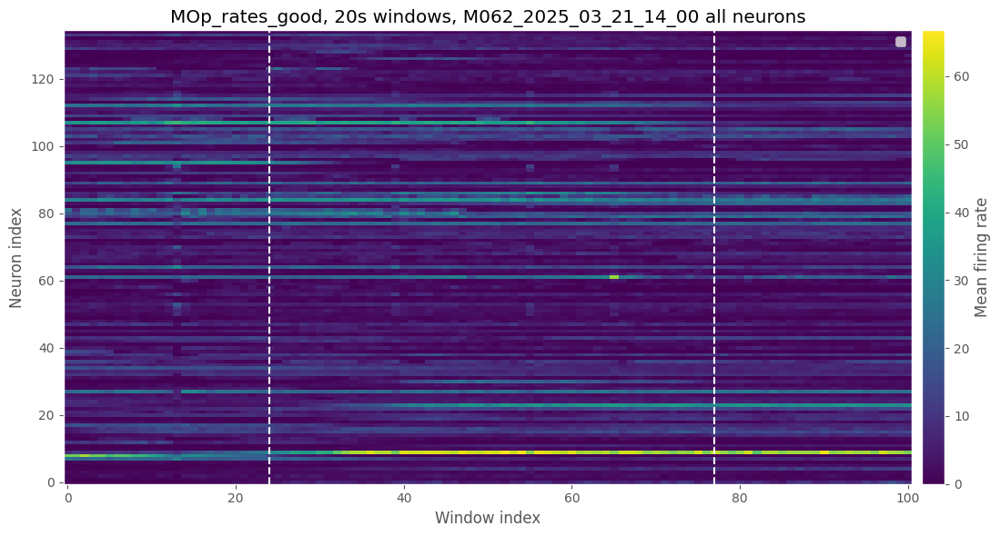

In [81]:
window_size_s = 20
field = "MOp_rates_good"
prep_df_no_trials = pyal.select_trials(prep_df,"trial_name!='trial'" )


# Build windows by concatenating within each trial type (e.g., trial vs intertrial)
meta_df, X = dt.build_window_tensor_concat_by_trial_type(
    prep_df_no_trials,
    window_size_s=window_size_s,
    field=field,
    trial_type_col="trial_name",   # your type column
    bin_size_col="bin_size",
)
print(f" windows: {X.shape[0]} , bins per window: {X.shape[1]}, features: {X.shape[2]} ")
print(meta_df["trial_type"].value_counts())
meta_df = meta_df.reset_index(drop=True)

# Choose device
device = "cuda" if torch.cuda.is_available() else "cpu"
X = X.to(device)
X_mean = X.mean(dim=1)  # (n_windows, F)
X_mean.shape


fig, ax = plt.subplots(figsize=(12, 6))
cmap = 'viridis'
im = ax.imshow(X_mean.detach().cpu().numpy().T, aspect="auto", origin="lower", cmap=cmap)
boundaries = dt.trial_change_boundaries(meta_df,col = 'trial_type')
for b in boundaries:
    ax.axvline(b, color="w", ls="--", lw=1.5)
ax.legend(loc="upper right", frameon=True)
ax.set_xlabel("Window index")
ax.set_ylabel("Neuron index")
ax.grid(False)
ax.set_title(f"{field}, {window_size_s}s windows, {sessions[session_idx]} all neurons")
cbar = plt.colorbar(im, ax=ax, pad=0.01)
cbar.set_label("Mean firing rate")
plt.tight_layout()

 windows: 101 , bins per window: 2000, features: 179 
trial_type
intertrial    53
free0         24
free1         24
Name: count, dtype: int64


/tmp/ipykernel_164716/425193451.py:31: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper right", frameon=True)


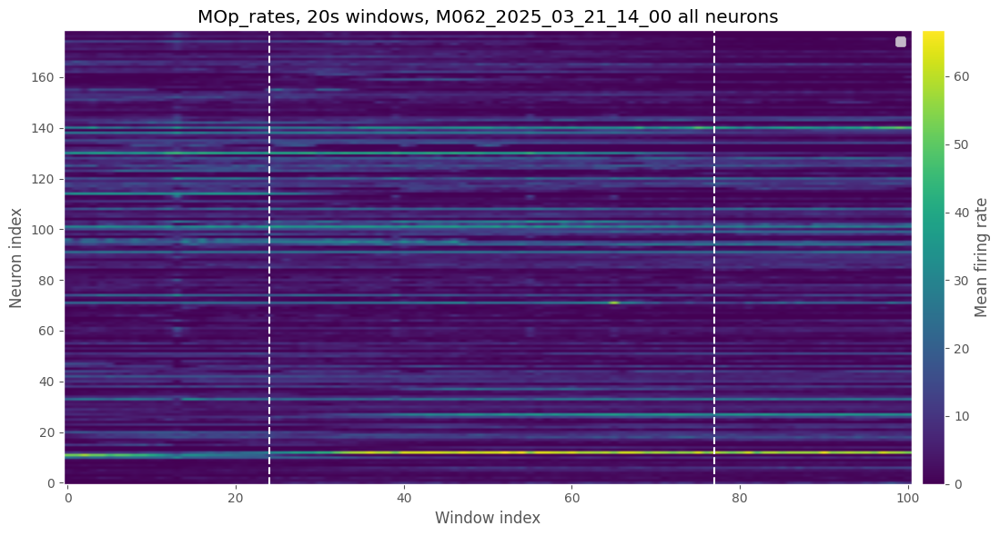

In [79]:
window_size_s = 20
field = "MOp_rates"
prep_df_no_trials = pyal.select_trials(prep_df,"trial_name!='trial'" )


# Build windows by concatenating within each trial type (e.g., trial vs intertrial)
meta_df, X = dt.build_window_tensor_concat_by_trial_type(
    prep_df_no_trials,
    window_size_s=window_size_s,
    field=field,
    trial_type_col="trial_name",   # your type column
    bin_size_col="bin_size",
)
print(f" windows: {X.shape[0]} , bins per window: {X.shape[1]}, features: {X.shape[2]} ")
print(meta_df["trial_type"].value_counts())
meta_df = meta_df.reset_index(drop=True)

# Choose device
device = "cuda" if torch.cuda.is_available() else "cpu"
X = X.to(device)
X_mean = X.mean(dim=1)  # (n_windows, F)
X_mean.shape


fig, ax = plt.subplots(figsize=(12, 6))
cmap = 'viridis'
im = ax.imshow(X_mean.detach().cpu().numpy().T, aspect="auto", origin="lower", cmap=cmap)
boundaries = dt.trial_change_boundaries(meta_df,col = 'trial_type')
for b in boundaries:
    ax.axvline(b, color="w", ls="--", lw=1.5)
ax.legend(loc="upper right", frameon=True)
ax.set_xlabel("Window index")
ax.set_ylabel("Neuron index")
ax.grid(False)
ax.set_title(f"{field}, {window_size_s}s windows, {sessions[session_idx]} all neurons")
cbar = plt.colorbar(im, ax=ax, pad=0.01)
cbar.set_label("Mean firing rate")
plt.tight_layout()

In [82]:
# order neurons by relative increase in activity in free0 vs intertrial
free0_mask = meta_df["trial_type"] == "free0"
intertrial_mask = meta_df["trial_type"] == "intertrial"
free0_mean = X_mean[free0_mask].mean(dim=0)
intertrial_mean = X_mean[intertrial_mask].mean(dim=0)
relative_increase = (intertrial_mean-free0_mean) / free0_mean
relative_change = abs(intertrial_mean-free0_mean) / free0_mean 
relative_decrease = (free0_mean-intertrial_mean) / intertrial_mean
neuron_order_rel_increase = torch.argsort(relative_increase, descending=True)
neuron_order_rel_decrease = torch.argsort(relative_decrease, descending=True)
neuron_order_rel = torch.argsort(relative_change, descending=True)
X_ordered_rel_increase = X_mean[:, neuron_order_rel_increase]
X_ordered_rel_decrease = X_mean[:, neuron_order_rel_decrease]
X_ordered_rel_change = X_mean[:, neuron_order_rel]

/tmp/ipykernel_164716/3122619609.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper right", frameon=True)


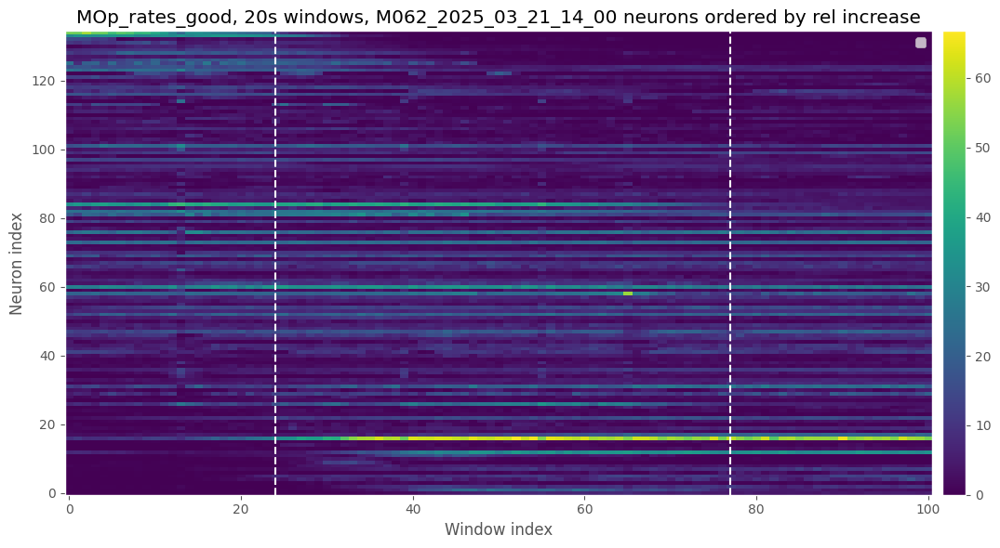

In [83]:
fig, ax = plt.subplots(figsize=(12, 6))
cmap = 'viridis'
im = ax.imshow(X_ordered_rel_increase.detach().cpu().numpy().T, aspect="auto", origin="lower", cmap=cmap)
boundaries = dt.trial_change_boundaries(meta_df,col = 'trial_type')
for b in boundaries:
    ax.axvline(b, color="w", ls="--", lw=1.5)
ax.legend(loc="upper right", frameon=True)
ax.set_xlabel("Window index")
ax.set_ylabel("Neuron index")
ax.grid(False)
# ax.set_title(title)
cbar = plt.colorbar(im, ax=ax, pad=0.01)
ax.set_title(f"{field}, {window_size_s}s windows, {sessions[session_idx]} neurons ordered by rel increase")
plt.tight_layout()

/tmp/ipykernel_164716/73497812.py:7: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper right", frameon=True)


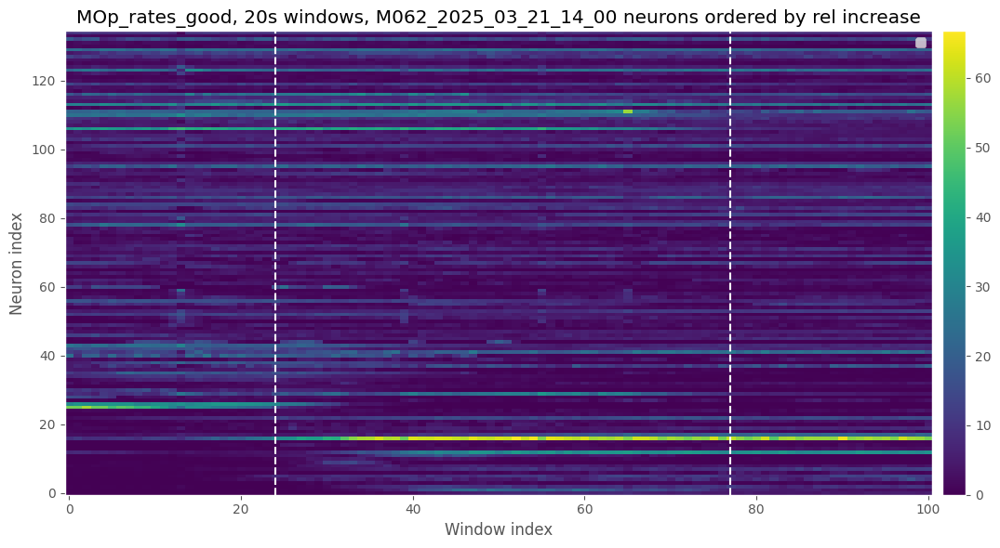

In [84]:
fig, ax = plt.subplots(figsize=(12, 6))
cmap = 'viridis'
im = ax.imshow(X_ordered_rel_change.detach().cpu().numpy().T, aspect="auto", origin="lower", cmap=cmap)
boundaries = dt.trial_change_boundaries(meta_df,col = 'trial_type')
for b in boundaries:
    ax.axvline(b, color="w", ls="--", lw=1.5)
ax.legend(loc="upper right", frameon=True)
ax.set_xlabel("Window index")
ax.set_ylabel("Neuron index")
ax.grid(False)
# ax.set_title(title)
cbar = plt.colorbar(im, ax=ax, pad=0.01)
ax.set_title(f"{field}, {window_size_s}s windows, {sessions[session_idx]} neurons ordered by rel increase")
plt.tight_layout()

In [85]:
# remove the first 35 neurons with highest relative increase 
n_remove = 35
X_removed = X[:,:,neuron_order_rel[n_remove:]]

In [86]:
area = "MOp"
field = f"{area}_rates_good"
exclude_trials = True
if exclude_trials:
    alldata = np.concatenate(pyal.select_trials(prep_df,"trial_name!='trial'")[field].values,axis = 0)



In [87]:

free0_len = dt.get_n_time(prep_df, "free0", field=field)
intertrials_len = dt.get_n_time(prep_df, "intertrial", field=field)
free1_len = dt.get_n_time(prep_df, "free1", field=field)


In [88]:
# convert neuron_order_rel_increase to numpy
neuron_order_rel = neuron_order_rel.cpu().numpy()
alldata_removed = alldata[:,neuron_order_rel[n_remove:]]
model = PCA(n_components=3, svd_solver='full')
pca_data = model.fit_transform(alldata_removed)


In [89]:

model = PCA(n_components=3, svd_solver='full')
pca_data_orig = model.fit_transform(alldata)

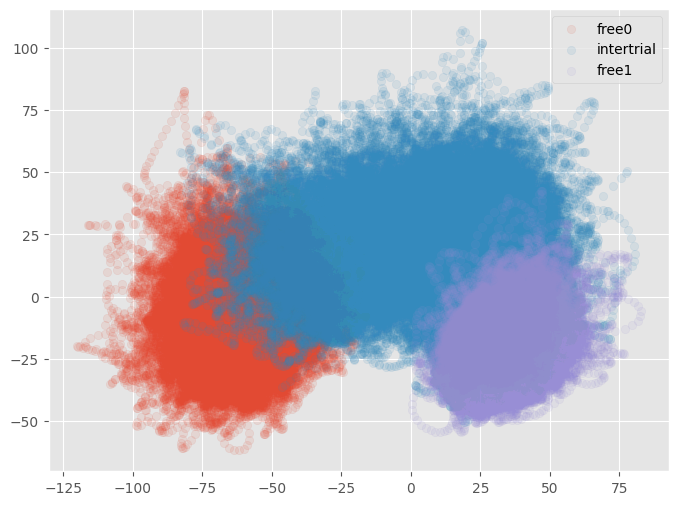

In [90]:
fig, ax = plt.subplots(figsize=(8, 6))
# color code based on length of trial type:free0_len, intertrials_len, free1_len
i = 0
for trial_type, length in zip(["free0", "intertrial", "free1"], [free0_len, intertrials_len, free1_len]):
    ax.scatter(pca_data_orig[i:i+length, 0], pca_data_orig[i:i+length, 1], alpha=0.1, label=trial_type)
    i = i + length
ax.legend(loc="upper right")
plt.show()

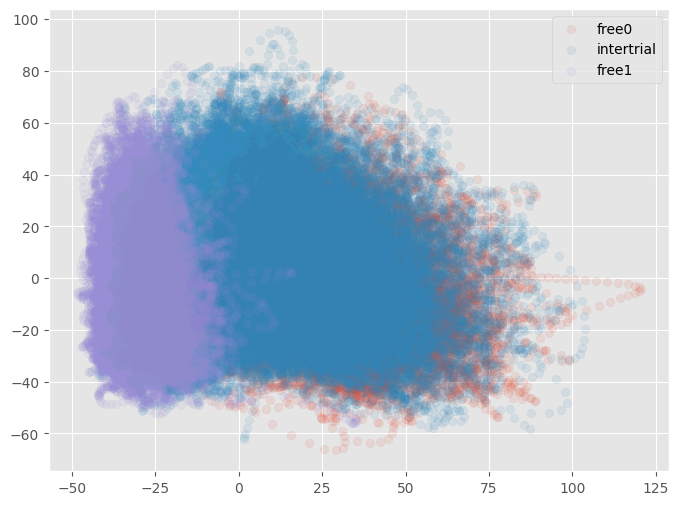

In [91]:
fig, ax = plt.subplots(figsize=(8, 6))
# color code based on length of trial type:free0_len, intertrials_len, free1_len
i = 0
for trial_type, length in zip(["free0", "intertrial", "free1"], [free0_len, intertrials_len, free1_len]):
    ax.scatter(pca_data[i:i+length, 0], pca_data[i:i+length, 1], alpha=0.1, label=trial_type)
    i = i + length
ax.legend(loc="upper right")
plt.show()

In [ ]:
# Detect neurons that start/stop firing globally across all windows
# Define threshold relative to each neuron's mean

# Compute mean firing rate for each neuron across all windows
neuron_means = X_mean.mean(dim=0)  # shape: (n_neurons,)

# Define threshold as a fraction of each neuron's mean (e.g., 50%)
threshold_multiplier = 0.5
thresholds = neuron_means * threshold_multiplier  # shape: (n_neurons,)

# Determine binary firing state for each window-neuron pair
# True = firing (above threshold), False = silent (below threshold)
firing_states = (X_mean > thresholds.unsqueeze(0)).cpu().numpy()  # (n_windows, n_neurons)

# Detect state transitions for each neuron
transitions = []  # list of dicts: {neuron_idx, window_idx, transition_type}

for neuron_idx in range(firing_states.shape[1]):
    neuron_firing = firing_states[:, neuron_idx].astype(int)
    
    # Compute differences: 1 = START (0→1), -1 = STOP (1→0)
    state_changes = np.diff(neuron_firing)
    
    # Find START transitions (0→1)
    start_window_indices = np.where(state_changes == 1)[0] + 1
    for win_idx in start_window_indices:
        transitions.append({
            'neuron_idx': neuron_idx,
            'window_idx': win_idx,
            'transition_type': 'START'
        })
    
    # Find STOP transitions (1→0)
    stop_window_indices = np.where(state_changes == -1)[0] + 1
    for win_idx in stop_window_indices:
        transitions.append({
            'neuron_idx': neuron_idx,
            'window_idx': win_idx,
            'transition_type': 'STOP'
        })

transitions_df = pd.DataFrame(transitions)
print(f"Total transitions detected: {len(transitions_df)}")
print(f"START transitions: {(transitions_df['transition_type'] == 'START').sum()}")
print(f"STOP transitions: {(transitions_df['transition_type'] == 'STOP').sum()}")
print(f"Unique neurons with transitions: {transitions_df['neuron_idx'].nunique()}")
print(f"Percentage of neurons with transitions: {100 * transitions_df['neuron_idx'].nunique() / firing_states.shape[1]:.1f}%")
print(f"\nTransitions dataframe info:")
print(transitions_df.head())


In [ ]:
# Visualize distribution of transitions across windows

fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: All transitions (histogram)
ax = axes[0, 0]
ax.hist(transitions_df['window_idx'], bins=20, edgecolor='black', alpha=0.7, color='steelblue')
ax.set_xlabel('Window Index')
ax.set_ylabel('Count of Transitions')
ax.set_title('Distribution of All Transitions Across Windows')
ax.grid(True, alpha=0.3)

# Plot 2: START vs STOP separately
ax = axes[0, 1]
start_windows = transitions_df[transitions_df['transition_type'] == 'START']['window_idx']
stop_windows = transitions_df[transitions_df['transition_type'] == 'STOP']['window_idx']
ax.hist([start_windows, stop_windows], bins=20, label=['START', 'STOP'], 
        edgecolor='black', alpha=0.7, color=['green', 'red'])
ax.set_xlabel('Window Index')
ax.set_ylabel('Count')
ax.set_title('START vs STOP Transitions by Window')
ax.legend()
ax.grid(True, alpha=0.3)

# Plot 3: Overlay transitions on trial type boundaries
ax = axes[1, 0]
ax.hist(transitions_df['window_idx'], bins=20, edgecolor='black', alpha=0.7, color='steelblue')
boundaries = dt.trial_change_boundaries(meta_df, col='trial_type')
for b in boundaries:
    ax.axvline(b, color='red', ls='--', lw=2, alpha=0.7)
ax.set_xlabel('Window Index')
ax.set_ylabel('Count of Transitions')
ax.set_title('Transitions with Trial Type Boundaries')
ax.grid(True, alpha=0.3)

# Plot 4: Percentage of neurons showing each transition type
ax = axes[1, 1]
neurons_with_start = transitions_df[transitions_df['transition_type'] == 'START']['neuron_idx'].nunique()
neurons_with_stop = transitions_df[transitions_df['transition_type'] == 'STOP']['neuron_idx'].nunique()
neurons_with_both = len(set(transitions_df[transitions_df['transition_type'] == 'START']['neuron_idx']) & 
                         set(transitions_df[transitions_df['transition_type'] == 'STOP']['neuron_idx']))
neurons_with_either = transitions_df['neuron_idx'].nunique()
total_neurons = firing_states.shape[1]

categories = ['START only', 'STOP only', 'Both', 'Any transition', 'No transition']
counts = [
    neurons_with_start - neurons_with_both,
    neurons_with_stop - neurons_with_both,
    neurons_with_both,
    neurons_with_either,
    total_neurons - neurons_with_either
]
percentages = [100 * c / total_neurons for c in counts]

bars = ax.bar(categories, percentages, edgecolor='black', alpha=0.7, 
              color=['green', 'red', 'orange', 'purple', 'gray'])
ax.set_ylabel('Percentage of Neurons')
ax.set_title('Percentage of Neurons by Transition Type')
ax.set_ylim([0, 100])
for i, (bar, pct) in enumerate(zip(bars, percentages)):
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2., height,
            f'{pct:.1f}%\n(n={counts[i]})',
            ha='center', va='bottom', fontsize=9)
plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, ha='right')
ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

# Print statistics
print(f"\nDetailed neuron statistics:")
print(f"  Neurons with START: {neurons_with_start} ({100*neurons_with_start/total_neurons:.1f}%)")
print(f"  Neurons with STOP: {neurons_with_stop} ({100*neurons_with_stop/total_neurons:.1f}%)")
print(f"  Neurons with both: {neurons_with_both} ({100*neurons_with_both/total_neurons:.1f}%)")
print(f"  Neurons with any transition: {neurons_with_either} ({100*neurons_with_either/total_neurons:.1f}%)")
print(f"  Neurons with no transition: {total_neurons - neurons_with_either} ({100*(total_neurons - neurons_with_either)/total_neurons:.1f}%)")


In [ ]:
# Access transition indices for further analysis

# Get all neuron indices with START transitions
neurons_with_start_transitions = transitions_df[transitions_df['transition_type'] == 'START']['neuron_idx'].unique()

# Get all neuron indices with STOP transitions
neurons_with_stop_transitions = transitions_df[transitions_df['transition_type'] == 'STOP']['neuron_idx'].unique()

# Get all neuron indices with any transition
all_transition_neurons = transitions_df['neuron_idx'].unique()

print(f"Neurons with START transitions (first 20): {neurons_with_start_transitions[:20]}")
print(f"Neurons with STOP transitions (first 20): {neurons_with_stop_transitions[:20]}")

# Example: Filter transitions for a specific neuron
example_neuron = neurons_with_start_transitions[0] if len(neurons_with_start_transitions) > 0 else all_transition_neurons[0]
neuron_transitions = transitions_df[transitions_df['neuron_idx'] == example_neuron]
print(f"\nExample transitions for neuron {example_neuron}:")
print(neuron_transitions)

# Summary table by transition type
print("\n\nTransition counts by type:")
print(transitions_df.groupby('transition_type').size())


In [3]:
def plot_transition_times(
    df_silent: pd.DataFrame,
    X: torch.Tensor,
    window_size_s: float,
    meta_df: pd.DataFrame,
    trial_type_col: str = "trial_type",
    figsize: tuple = (14, 10),
    title: str = "Neuron activity transitions and firing rate raster",
):
    """
    Plot distribution of transition times and a firing rate raster
    sorted by neuron type (stable at top, transition neurons at bottom).

    Parameters
    ----------
    df_silent :     output of detect_silent_neurons
    X :             (nW, w, N) window tensor
    window_size_s : window size in seconds
    meta_df :       window metadata
    trial_type_col: column in meta_df identifying trial type
    """
    X_mean = X.mean(dim=1).cpu().numpy()           # (nW, N)
    nW, N = X_mean.shape
    time_minutes = np.arange(nW) * window_size_s / 60.0
    session_duration_min = time_minutes[-1]
    bins = np.linspace(0, session_duration_min, 30)

    # Epoch boundaries — preserve first-appearance order
    types_in_order = list(pd.unique(meta_df[trial_type_col]))
    epoch_boundaries = {}
    cumulative = 0
    for name in types_in_order:
        n_windows = (meta_df[trial_type_col] == name).sum()
        start = cumulative * window_size_s / 60.0
        cumulative += n_windows
        end = cumulative * window_size_s / 60.0
        epoch_boundaries[name] = (start, end)

    type_colors = {
        "stable":        "steelblue",
        "dropout":       "tomato",
        "emerge":        "mediumseagreen",
        "transient":     "darkorange",
        "always_silent": "lightgrey",
    }
    epoch_cmap = plt.cm.Pastel1(np.linspace(0, 1, len(epoch_boundaries)))

    def add_epoch_shading(ax):
        for (name, (t0, t1)), c in zip(epoch_boundaries.items(), epoch_cmap):
            ax.axvspan(t0, t1, alpha=0.25, color=c, label=name, zorder=0)

    def to_minutes(series):
        return series.dropna().astype(float) * window_size_s / 60.0

    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(2, 3, hspace=0.4, wspace=0.35,
                          height_ratios=[1, 1.8])

    # ── 1. Dropout times ─────────────────────────────────────────────────
    ax = fig.add_subplot(gs[0, 0])
    times = to_minutes(
        df_silent.loc[df_silent["type"].isin(["dropout", "transient"]),
                      "first_silent_window"]
    )
    add_epoch_shading(ax)
    if len(times) > 0:
        ax.hist(times, bins=bins, color=type_colors["dropout"],
                alpha=0.85, edgecolor="white", zorder=3)
    ax.set_xlabel("Time (minutes)")
    ax.set_ylabel("N neurons")
    ax.set_title(f"Dropout onset (n={len(times)})")
    ax.set_xlim(0, session_duration_min)
    ax.legend(fontsize=7)

    # ── 2. Recovery / emergence times ────────────────────────────────────
    ax = fig.add_subplot(gs[0, 1])
    times = to_minutes(
        df_silent.loc[df_silent["type"].isin(["emerge", "transient"]),
                      "first_active_after_silence"]
    )
    add_epoch_shading(ax)
    if len(times) > 0:
        ax.hist(times, bins=bins, color=type_colors["emerge"],
                alpha=0.85, edgecolor="white", zorder=3)
    ax.set_xlabel("Time (minutes)")
    ax.set_ylabel("N neurons")
    ax.set_title(f"Emergence (n={len(times)})")
    ax.set_xlim(0, session_duration_min)
    ax.legend(fontsize=7)

    # ── 3. Transient neurons ─────────────────────────────────────────────
    ax = fig.add_subplot(gs[0, 2])
    transient_df = df_silent[df_silent["type"] == "transient"]
    drop_t  = to_minutes(transient_df["first_silent_window"])
    recov_t = to_minutes(transient_df["first_active_after_silence"])
    add_epoch_shading(ax)
    if len(drop_t) > 0:
        ax.hist(drop_t, bins=bins, color=type_colors["dropout"],
                alpha=0.7, edgecolor="white", label="dropout", zorder=3)
    if len(recov_t) > 0:
        ax.hist(recov_t, bins=bins, color=type_colors["emerge"],
                alpha=0.7, edgecolor="white", label="recovery", zorder=3)
    ax.set_xlabel("Time (minutes)")
    ax.set_ylabel("N neurons")
    ax.set_title(f"Transient (n={len(transient_df)})")
    ax.set_xlim(0, session_duration_min)
    ax.legend(fontsize=7)

    # ── 4. Firing rate raster ─────────────────────────────────────────────
    ax_raster = fig.add_subplot(gs[1, :])

    type_order = ["stable", "always_silent", "emerge", "dropout", "transient"]

    def sort_key(row):
        base = type_order.index(row["type"]) if row["type"] in type_order else len(type_order)
        t = row["first_silent_window"] or row["first_active_after_silence"] or 0
        return (base, t)

    sorted_df = df_silent.copy()
    sorted_df["_sort"] = sorted_df.apply(sort_key, axis=1)
    sorted_df = sorted_df.sort_values("_sort").reset_index(drop=True)
    sorted_idxs = sorted_df["neuron_idx"].values

    X_raster = X_mean[:, sorted_idxs].T                   # (N, nW)

    im = ax_raster.imshow(
        X_raster, aspect="auto", cmap="viridis",
        extent=[time_minutes[0], time_minutes[-1], N, 0],
        interpolation="nearest",
    )
    plt.colorbar(im, ax=ax_raster, label="Mean firing rate (Hz)", fraction=0.02)

    # Epoch boundary lines
    for (name, (t0, t1)), c in zip(epoch_boundaries.items(), epoch_cmap):
        ax_raster.axvline(t0, color=c, lw=0.8, ls="--", alpha=0.7)
        ax_raster.text((t0 + t1) / 2, N * 1.01, name,
                       fontsize=7, ha="center", va="bottom", color=c)

    # Horizontal lines between neuron types + labels
    cumulative = 0
    for ntype in type_order:
        n_type = (sorted_df["type"] == ntype).sum()
        if n_type == 0:
            continue
        cumulative += n_type
        ax_raster.axhline(cumulative, color="white", lw=0.8,
                          ls="--", alpha=0.7)
        ax_raster.text(
            time_minutes[-1] * 1.001, cumulative - n_type / 2,
            f"{ntype}\n(n={n_type})",
            fontsize=7, va="center",
            color=type_colors.get(ntype, "grey"),
        )
    ax_raster.grid(False)
    ax_raster.set_xlabel("Time (minutes)")
    ax_raster.set_ylabel("Neuron")
    ax_raster.set_title("Firing rate raster")
    ax_raster.set_xlim(0, session_duration_min)

    fig.suptitle(f"{title}  |  window={window_size_s}s", fontsize=11)
    plt.tight_layout()
    plt.show()
def detect_silent_neurons(
    X: torch.Tensor,
    threshold: float,
    window_size_s: float,
    min_silent_s: float = 120.0,
) -> pd.DataFrame:
    """
    Detect neurons that are silent (mean rate < threshold) for at least
    min_silent_s seconds, using the already-windowed tensor X.

    Each window's mean firing rate is compared to threshold. A neuron is
    flagged if it has min_silent_windows consecutive windows below threshold.

    Parameters
    ----------
    X :             (nW, w, N) window tensor — mean over w gives rate per window
    threshold :     firing rate threshold in Hz
    window_size_s : duration of each window in seconds
    min_silent_s :  minimum consecutive silent duration to flag (default 120s)

    Returns
    -------
    df : DataFrame with one row per neuron:
         - neuron_idx
         - is_silent_period : bool — True if any silent period >= min_silent_s
         - first_silent_window : int or None — window index where silence starts
         - last_active_window : int or None — last window before silence
         - first_active_after_silence : int or None — window where it recovers (if any)
         - type : 'stable' | 'dropout' | 'emerge' | 'transient' | 'always_silent'
    """
    min_silent_windows = int(np.ceil(min_silent_s / window_size_s))

    # Mean over time bins within each window -> (nW, N)
    X_mean = X.mean(dim=1).cpu().numpy()        # (nW, N)
    nW, N = X_mean.shape

    below = X_mean < threshold                  # (nW, N) bool

    # For each neuron find runs of consecutive True in below
    # Use cumsum trick: pad with False on both ends, find diff
    # This is vectorised across neurons

    # Pad: (nW+2, N)
    pad = np.zeros((nW + 2, N), dtype=bool)
    pad[1:-1] = below

    diff = np.diff(pad.astype(np.int8), axis=0)    # (nW+1, N)
    # diff == +1: start of silent run (below goes True)
    # diff == -1: end of silent run (below goes False)

    records = []

    for n in range(N):
        starts = np.where(diff[:, n] == 1)[0]      # window indices where silence starts
        ends   = np.where(diff[:, n] == -1)[0]     # window indices where silence ends

        # run lengths
        run_lengths = ends - starts                 # number of consecutive silent windows

        # keep only runs >= min_silent_windows
        long_runs = run_lengths >= min_silent_windows
        long_starts = starts[long_runs]
        long_ends   = ends[long_runs]

        starts_silent = below[:min_silent_windows, n].all() if nW >= min_silent_windows else False
        ends_silent   = below[-min_silent_windows:, n].all() if nW >= min_silent_windows else False

        if len(long_starts) == 0:
            neuron_type = "always_silent" if below[:, n].all() else "stable"
            first_silent  = None
            last_active   = None
            first_recover = None

        elif ends_silent and not starts_silent:
            # Active at start, silent at end — dropout
            neuron_type   = "dropout"
            first_silent  = int(long_starts[0])
            last_active   = int(long_starts[0]) - 1 if long_starts[0] > 0 else None
            first_recover = None

        elif starts_silent and not ends_silent:
            # Silent at start, active at end — emerge
            neuron_type   = "emerge"
            first_silent  = 0
            last_active   = None
            first_recover = int(long_ends[0])

        else:
            # Has long silent period(s) but active at both ends — transient
            neuron_type   = "transient"
            first_silent  = int(long_starts[0])
            last_active   = int(long_starts[0]) - 1 if long_starts[0] > 0 else None
            first_recover = int(long_ends[0]) if len(long_ends) > 0 else None

        records.append({
            "neuron_idx":                n,
            "type":                      neuron_type,
            "is_silent_period":          len(long_starts) > 0,
            "first_silent_window":       first_silent,
            "last_active_window":        last_active,
            "first_active_after_silence": first_recover,
            "n_long_silent_runs":        int(long_runs.sum()),
        })

    df = pd.DataFrame(records)
    print(df["type"].value_counts().to_string())
    return df

M062_2025_03_19_14_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger'] could not be converted to int.
fields: ['values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 47999 in trial: free and id: 721, inserting NaN.
Extending index to 47989 in trial: free and id: 721, inserting NaN.
Extending index to 47990 in trial: free and id: 721, inserting NaN.
Extending index to 47991 in trial: free and id: 721, inserting NaN.
Extending index to 47992 in trial: free and id: 721, inserting NaN.
Extending index to 47993 in trial: free and id: 721, inserting NaN.
Extending index to 47994 in trial: free and id: 721, inserting NaN.
Extending index to 47995 in trial: free and id: 721, inserting NaN.
Extending index to 47996 in trial: free and id: 721, inserting NaN.
Extending index to 47997 in trial: free and id: 721, inserting NaN.
Extending 

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


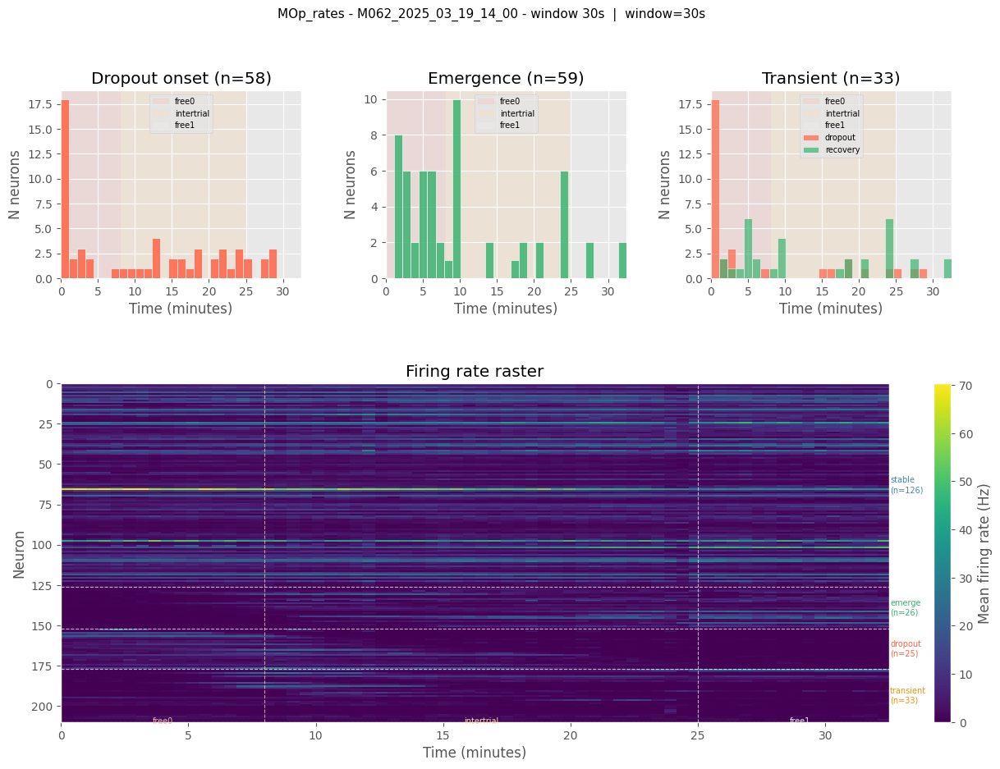

 windows: 66 , bins per window: 3000, features: 95 
trial_type
intertrial    34
free0         16
free1         16
Name: count, dtype: int64
type
stable       79
dropout       7
transient     6
emerge        3
Stable: 79 / 95


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


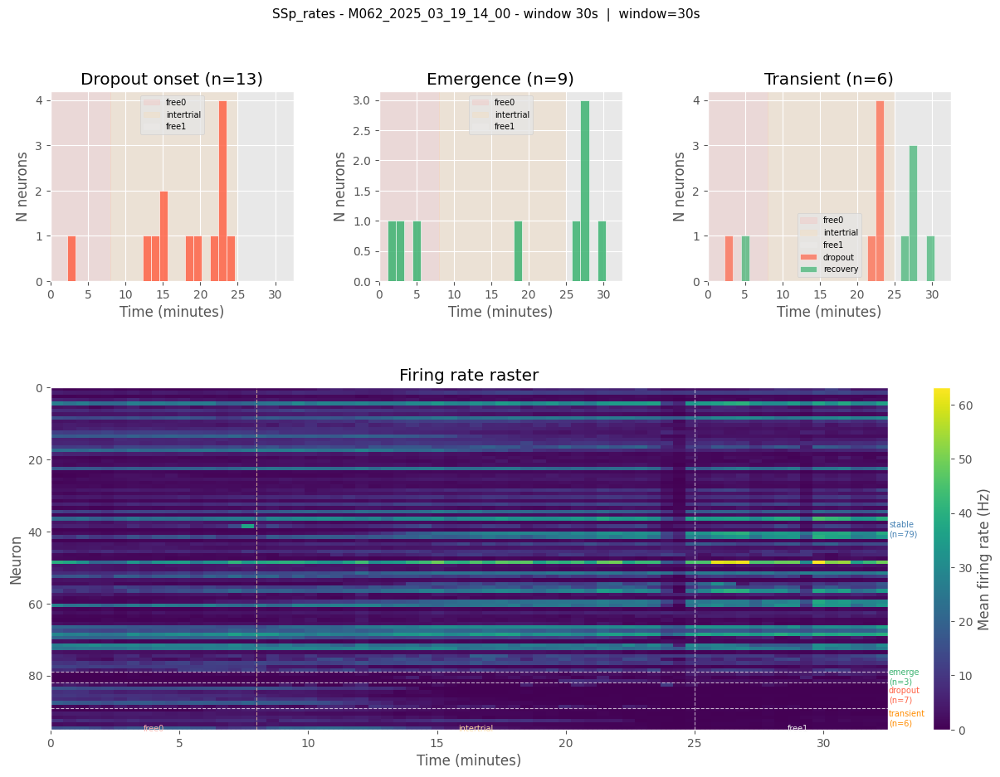

 windows: 66 , bins per window: 3000, features: 198 
trial_type
intertrial    34
free0         16
free1         16
Name: count, dtype: int64
type
stable       170
emerge        25
transient      3
Stable: 170 / 198


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


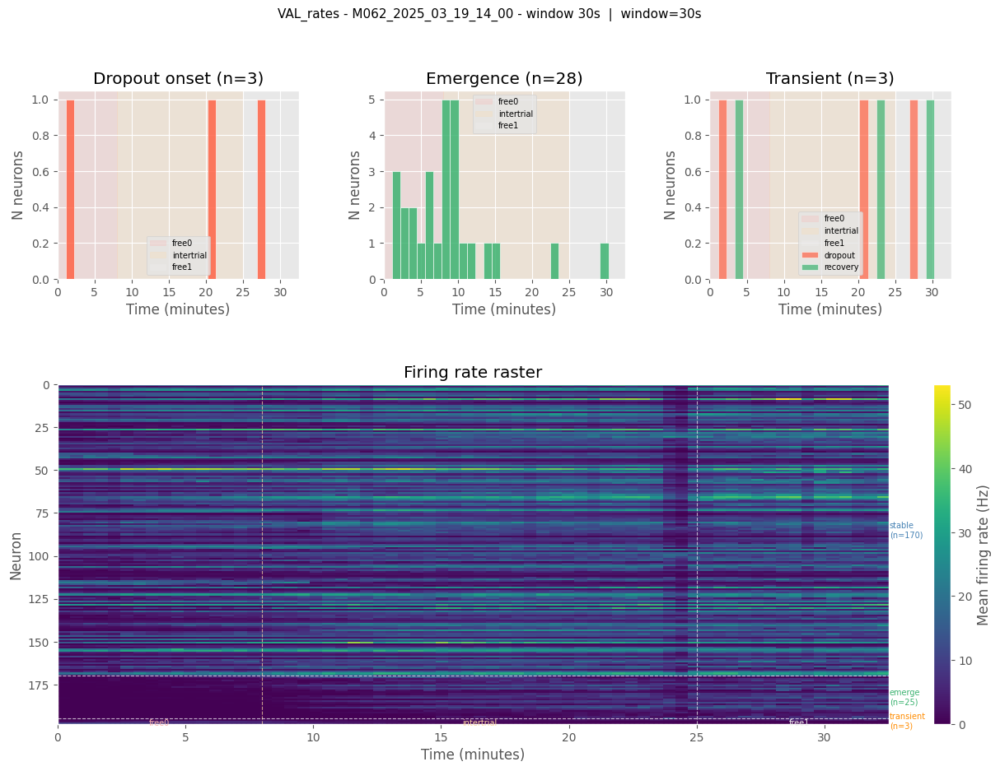

 windows: 66 , bins per window: 3000, features: 307 
trial_type
intertrial    34
free0         16
free1         16
Name: count, dtype: int64
type
stable       154
emerge        74
transient     49
dropout       30
Stable: 154 / 307


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


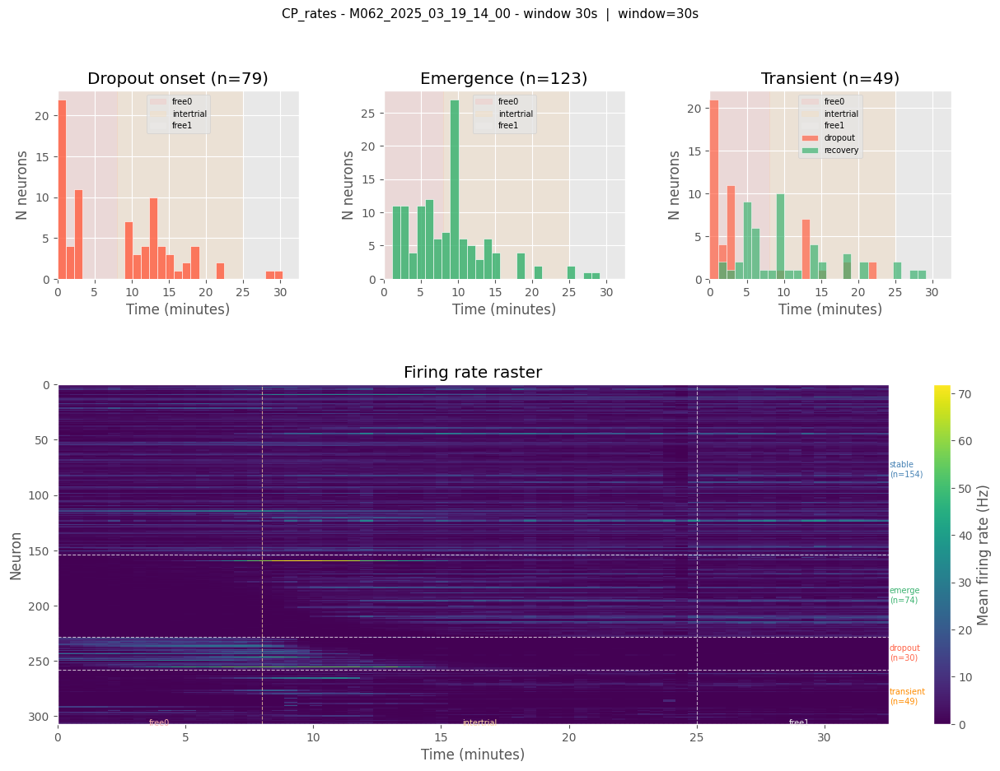

M062_2025_03_20_14_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger'] could not be converted to int.
fields: ['values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 47989 in trial: free and id: 711, inserting NaN.
Extending index to 47990 in trial: free and id: 711, inserting NaN.
Extending index to 47991 in trial: free and id: 711, inserting NaN.
Extending index to 47992 in trial: free and id: 711, inserting NaN.
Extending index to 47993 in trial: free and id: 711, inserting NaN.
Extending index to 47994 in trial: free and id: 711, inserting NaN.
Extending index to 47995 in trial: free and id: 711, inserting NaN.
Extending index to 47996 in trial: free and id: 711, inserting NaN.
Extending index to 47997 in trial: free and id: 711, inserting NaN.
Extending index to 47998 in trial: free and id: 711, inserting NaN.
Extending 

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


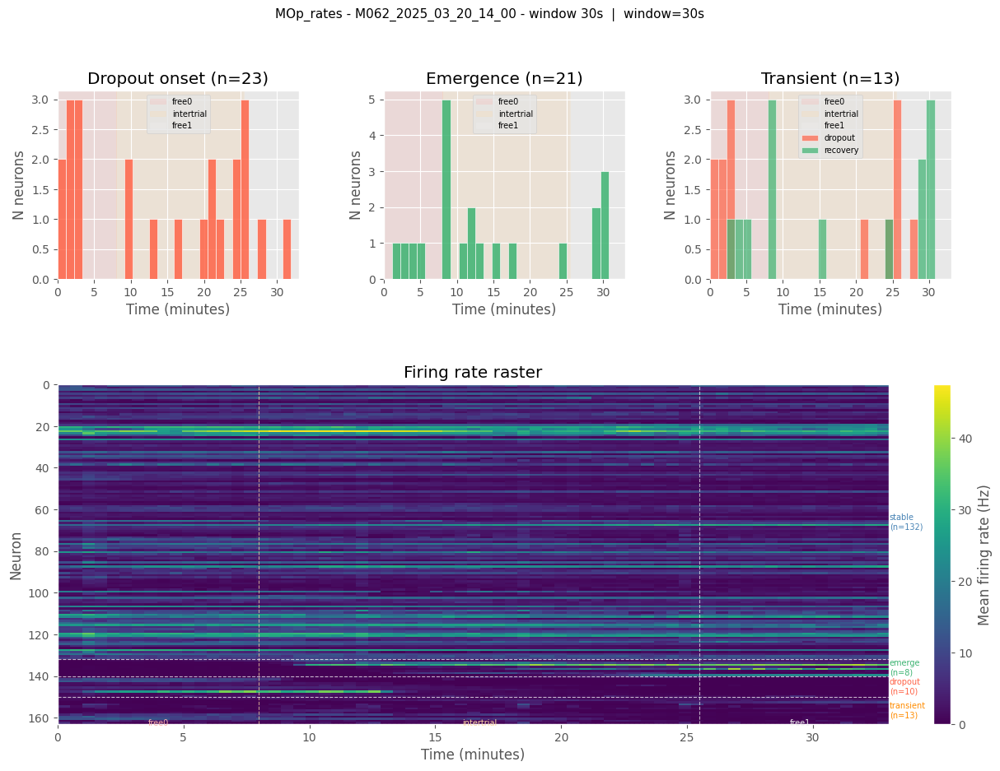

 windows: 67 , bins per window: 3000, features: 118 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       112
transient      4
emerge         2
Stable: 112 / 118


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


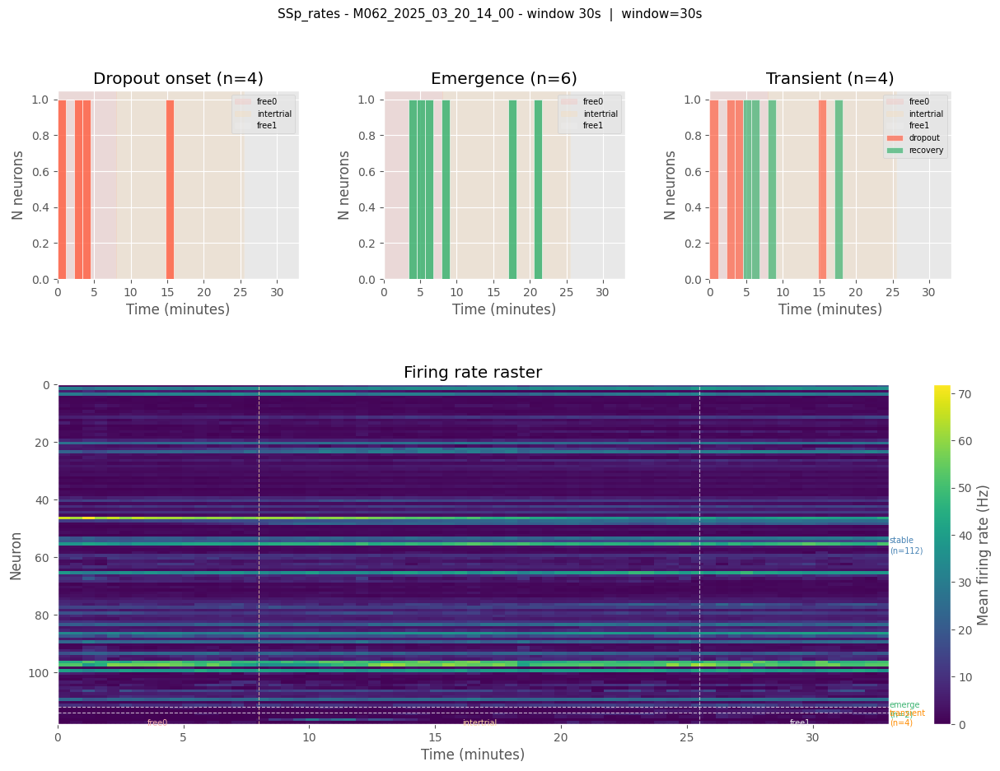

 windows: 67 , bins per window: 3000, features: 155 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       139
emerge         8
transient      8
Stable: 139 / 155


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


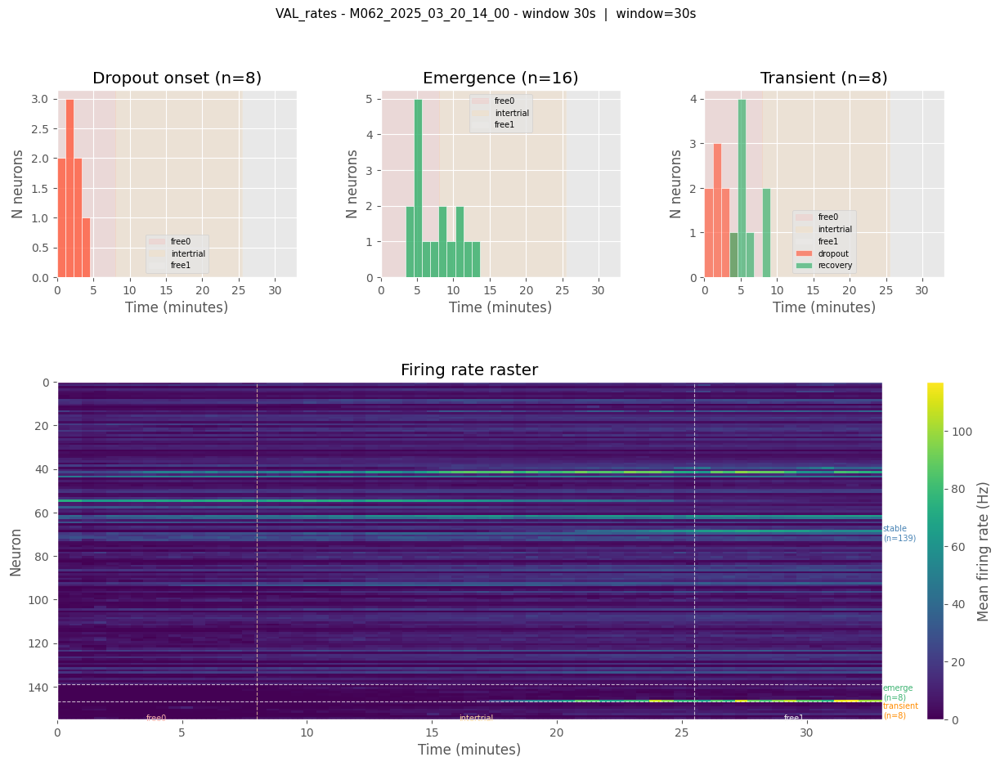

 windows: 67 , bins per window: 3000, features: 356 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       241
emerge        54
transient     37
dropout       24
Stable: 241 / 356


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


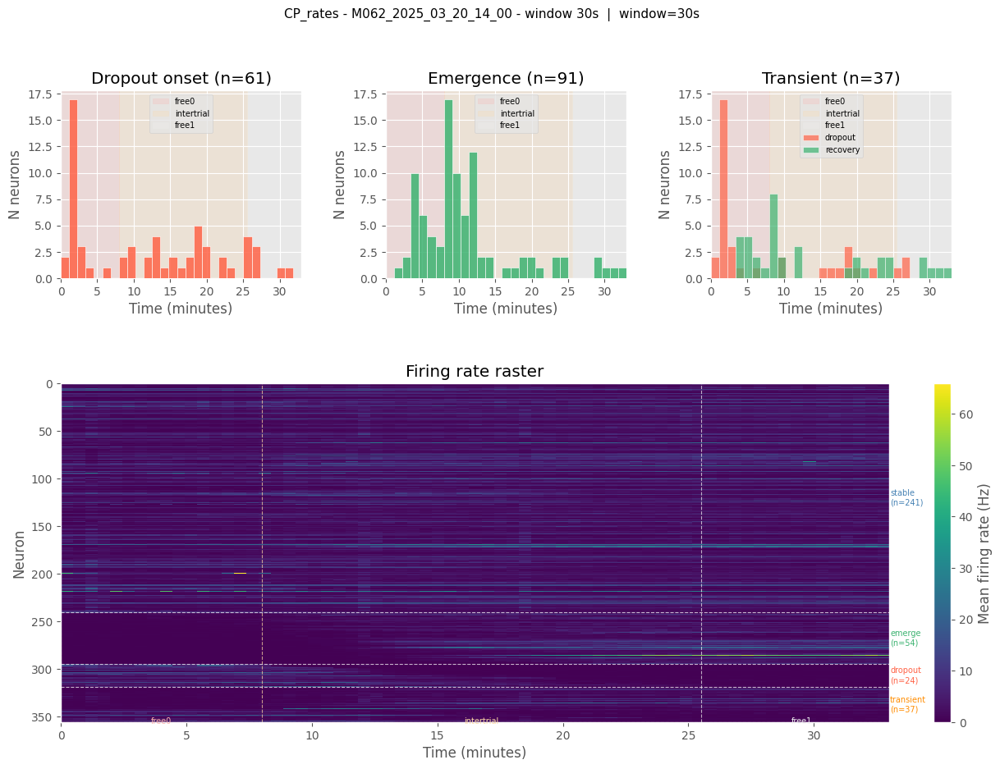

M062_2025_03_21_14_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger'] could not be converted to int.
fields: ['values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
fields: ['values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 47999 in trial: free and id: 707, inserting NaN.
Extending index to 47989 in trial: free and id: 707, inserting NaN.
Extending index to 47990 in trial: free and id: 707, inserting NaN.
Extending index to 47991 in trial: free and id: 707, inserting NaN.
Extending index to 47992 in trial: free and id: 707, inserting NaN.
Extending index to 47993 in trial: free and id: 707, inserting NaN.
Extending index to 47994 in trial: free and id: 707, inserting NaN.
Extending index to 47995 in trial: free and id: 707, inserting NaN.
Exte

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


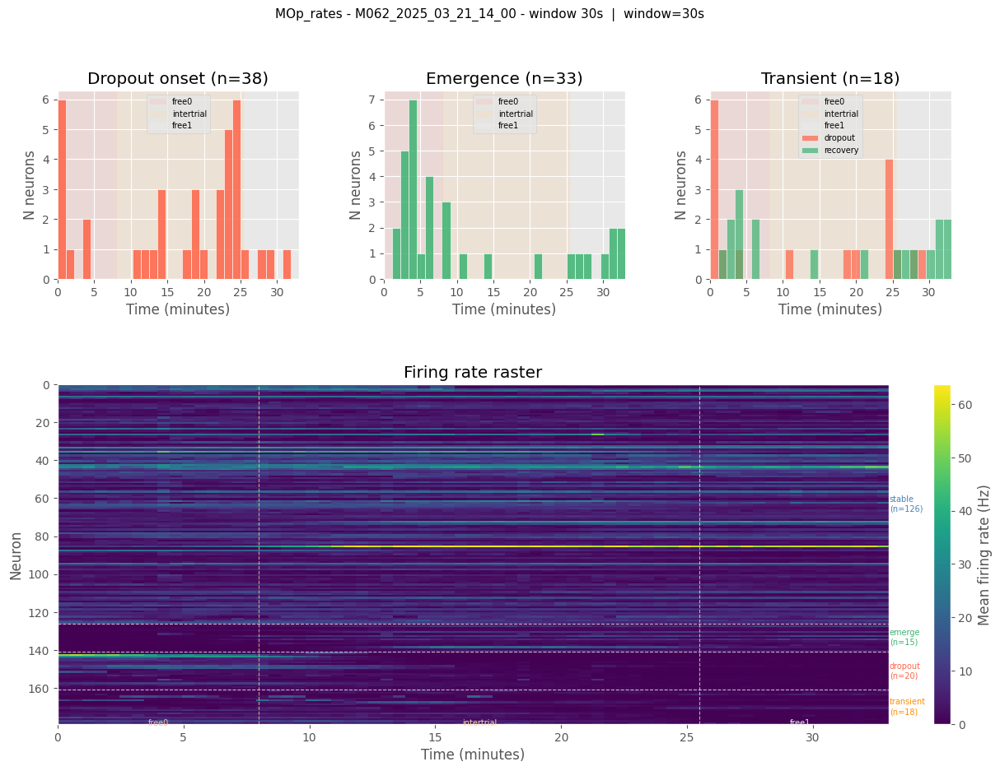

 windows: 67 , bins per window: 3000, features: 66 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       65
transient     1
Stable: 65 / 66


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


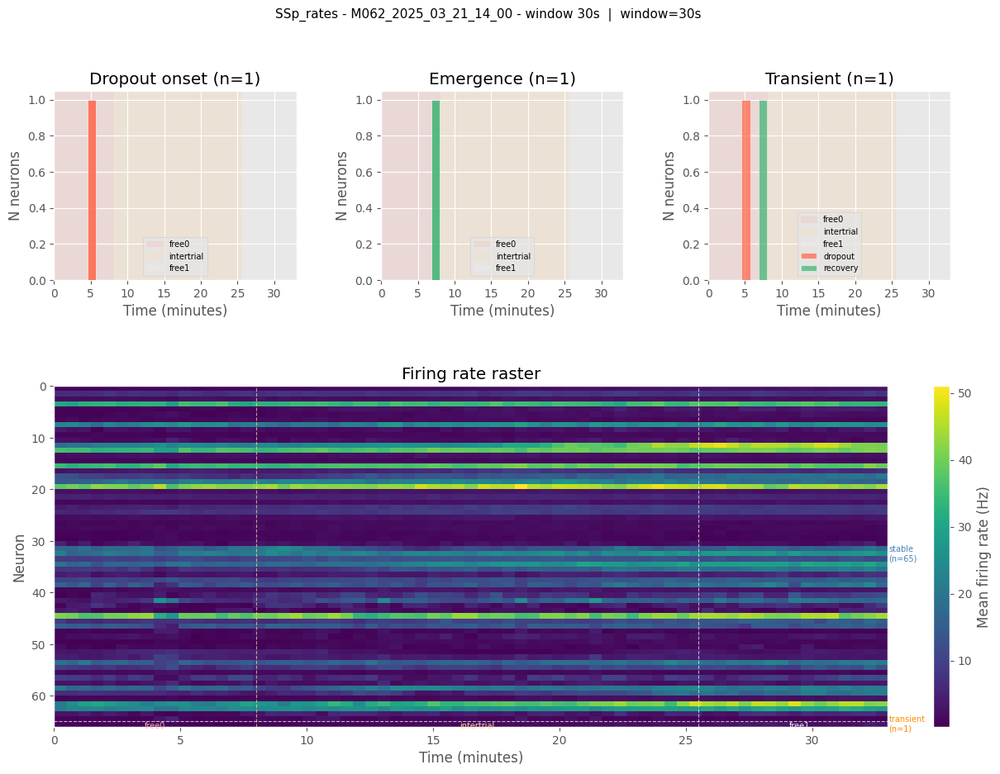

 windows: 67 , bins per window: 3000, features: 122 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       115
emerge         5
dropout        1
transient      1
Stable: 115 / 122


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


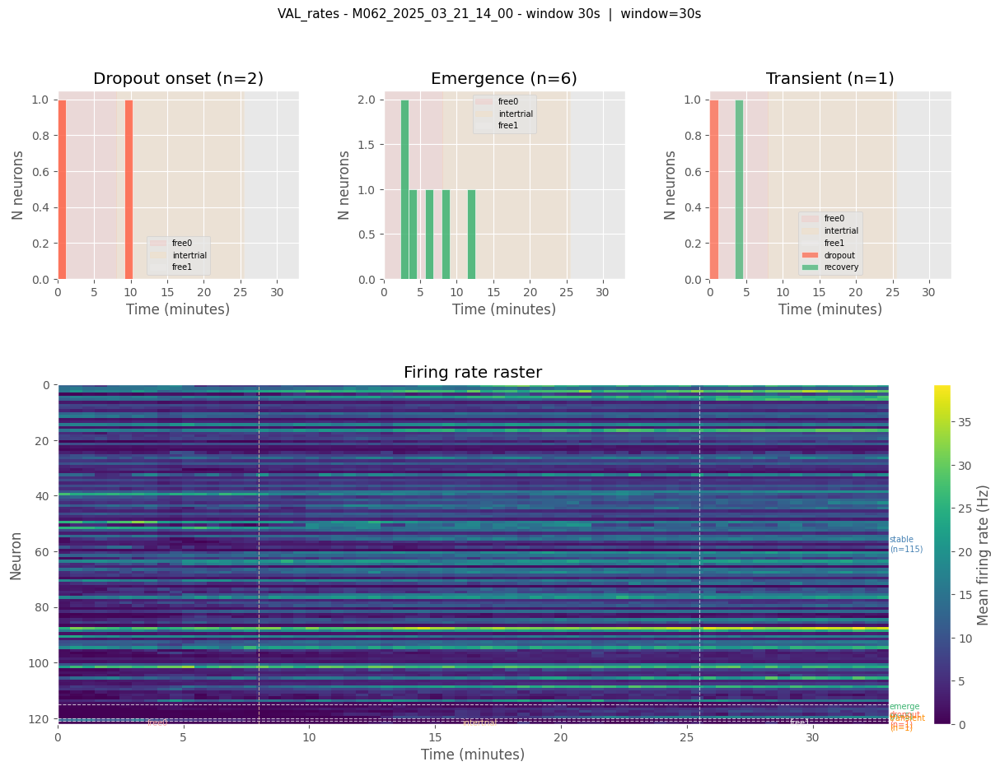

 windows: 67 , bins per window: 3000, features: 280 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       226
emerge        37
transient     14
dropout        3
Stable: 226 / 280


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


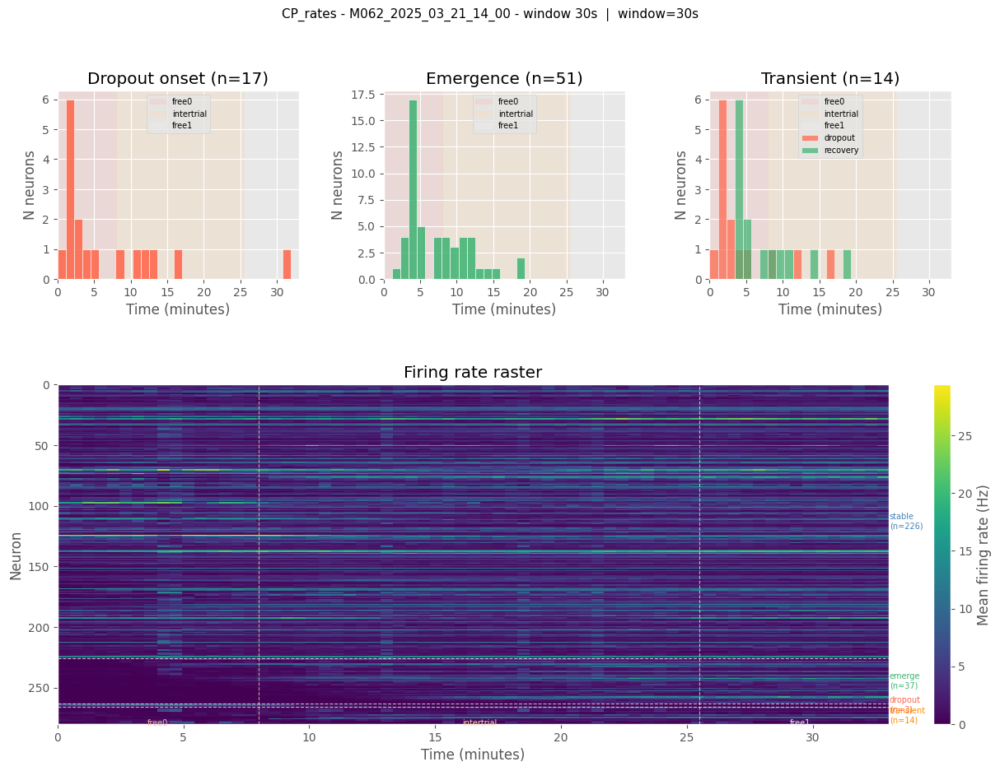

M061_2025_03_04_10_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger'] could not be converted to int.
fields: ['idx_motion'] could not be converted to int.
fields: ['values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 53999 in trial: free and id: 679, inserting NaN.
Extending index to 53989 in trial: free and id: 679, inserting NaN.
Extending index to 53990 in trial: free and id: 679, inserting NaN.
Extending index to 53991 in trial: free and id: 679, inserting NaN.
Extending index to 53992 in trial: free and id: 679, inserting NaN.
Extending index to 53993 in trial: free and id: 679, inserting NaN.
Extending index to 53994 in trial: free and id: 679, inserting NaN.
Extending index to 53995 in trial: free and id: 679, inserting NaN.
Extending index to 53996 in trial: free and id: 679, inserting NaN.
Extending index to 53997

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


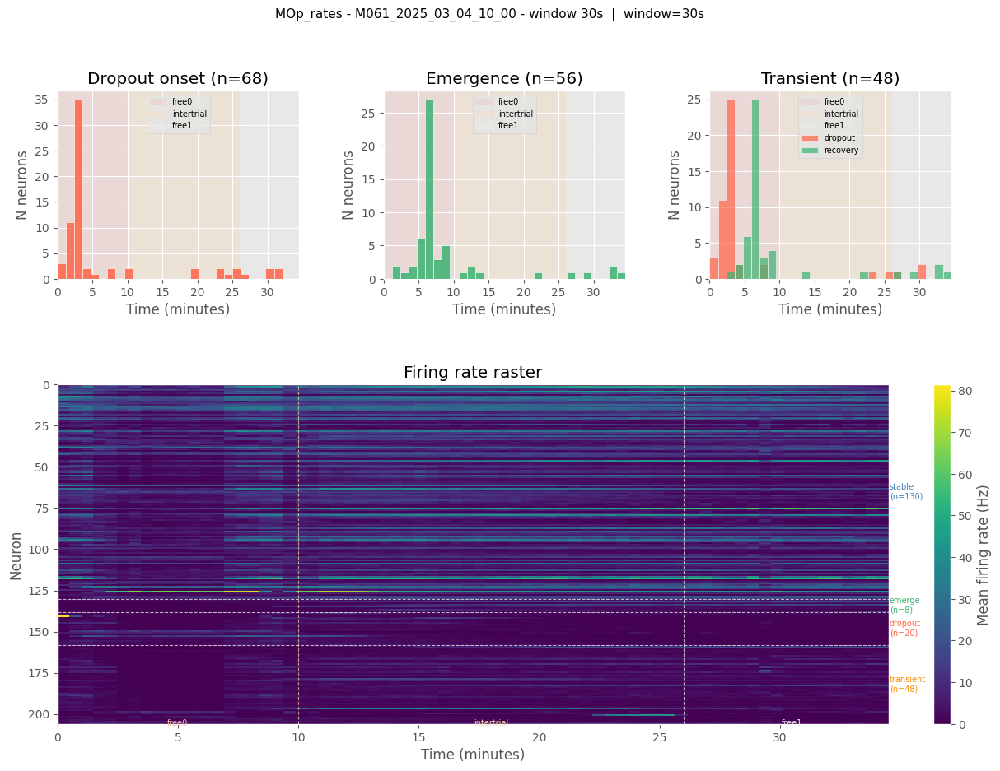

 windows: 70 , bins per window: 3000, features: 59 
trial_type
intertrial    32
free0         20
free1         18
Name: count, dtype: int64
type
stable       28
dropout      24
transient     7
Stable: 28 / 59


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


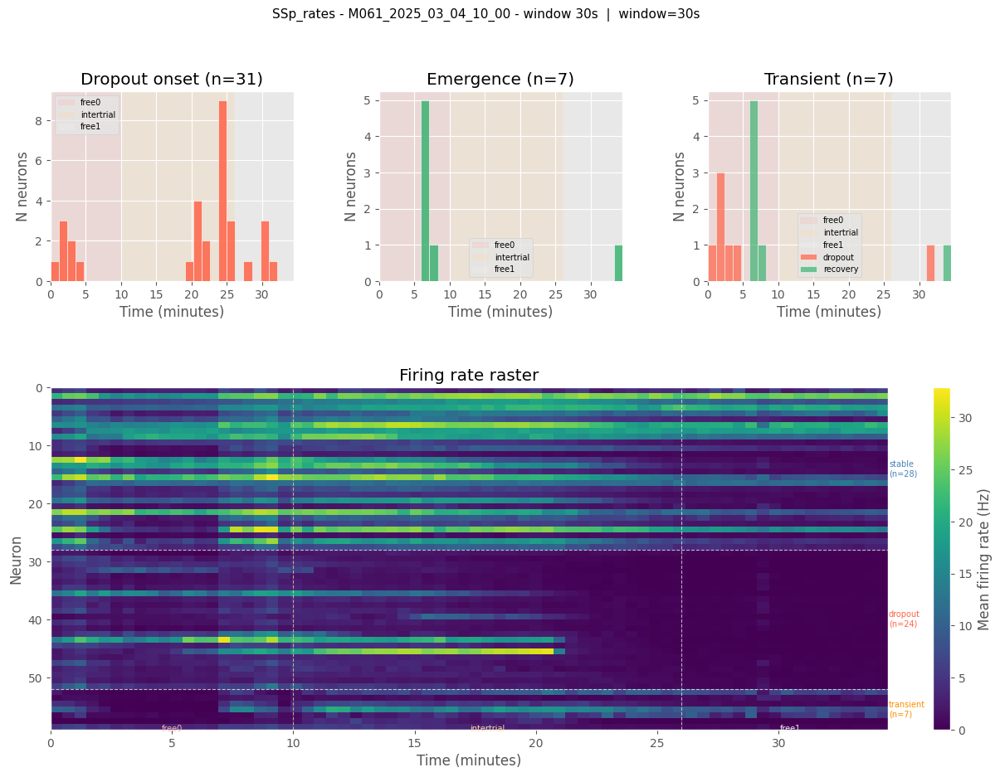

 windows: 70 , bins per window: 3000, features: 240 
trial_type
intertrial    32
free0         20
free1         18
Name: count, dtype: int64
type
stable       204
transient     21
emerge         9
dropout        6
Stable: 204 / 240


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


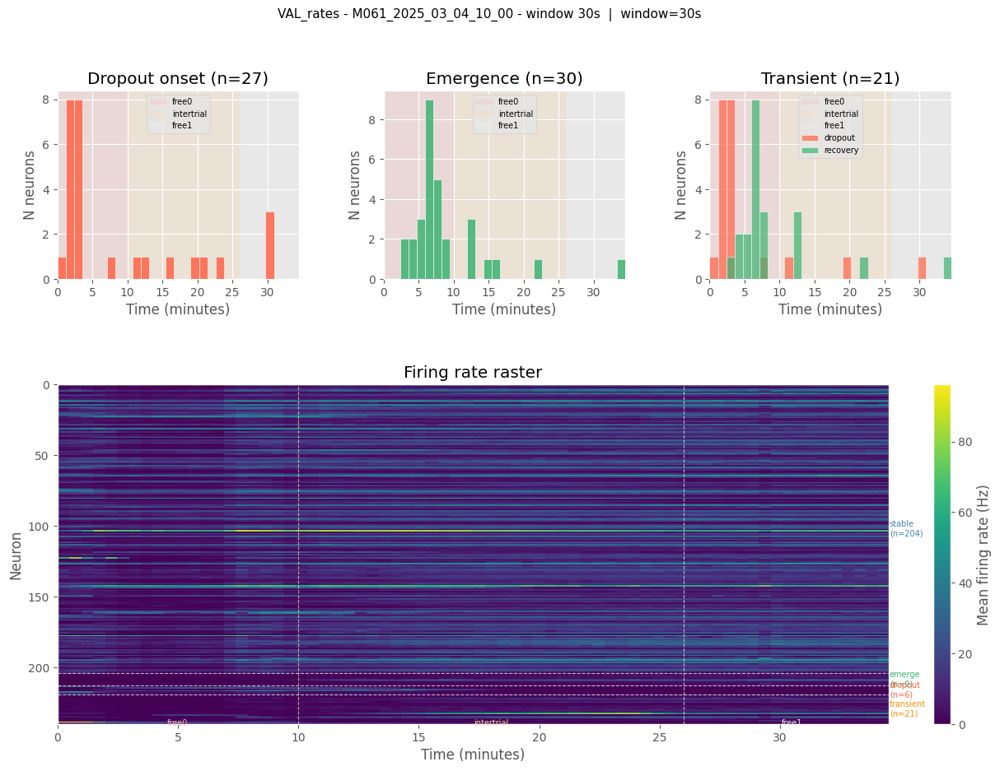

 windows: 70 , bins per window: 3000, features: 225 
trial_type
intertrial    32
free0         20
free1         18
Name: count, dtype: int64
type
stable       129
transient     54
emerge        32
dropout       10
Stable: 129 / 225


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


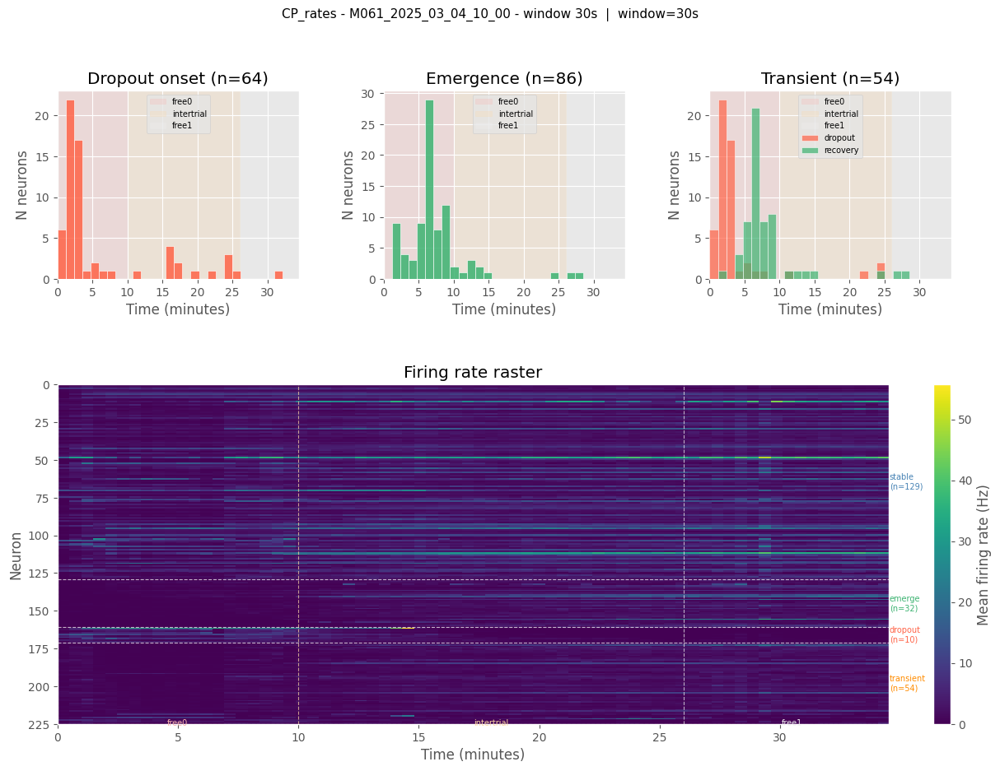

M061_2025_03_05_14_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger'] could not be converted to int.
fields: ['idx_motion'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 53999 in trial: free and id: 660, inserting NaN.
Extending index to 53989 in trial: free and id: 660, inserting NaN.
Extending index to 53990 in trial: free and id: 660, inserting NaN.
Extending index to 53991 in trial: free and id: 660, inserting NaN.
Extending index to 53992 in trial: free and id: 660, inserting NaN.
Extending index to 53993 in trial: free and id: 660, inserting NaN.
Extending index to 53994 in trial: free and id: 660, inserting NaN.
Extending index to 53995 in trial: free and id: 660, inserting NaN.
Extending index to 53996 in trial: free and id: 660, inserting NaN.
Extending index to 53997 in trial: free and id: 660, inserting NaN.
Extending index to 53998 in trial: free and id: 660, inserting NaN.
Extending index to 53999 in tr

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


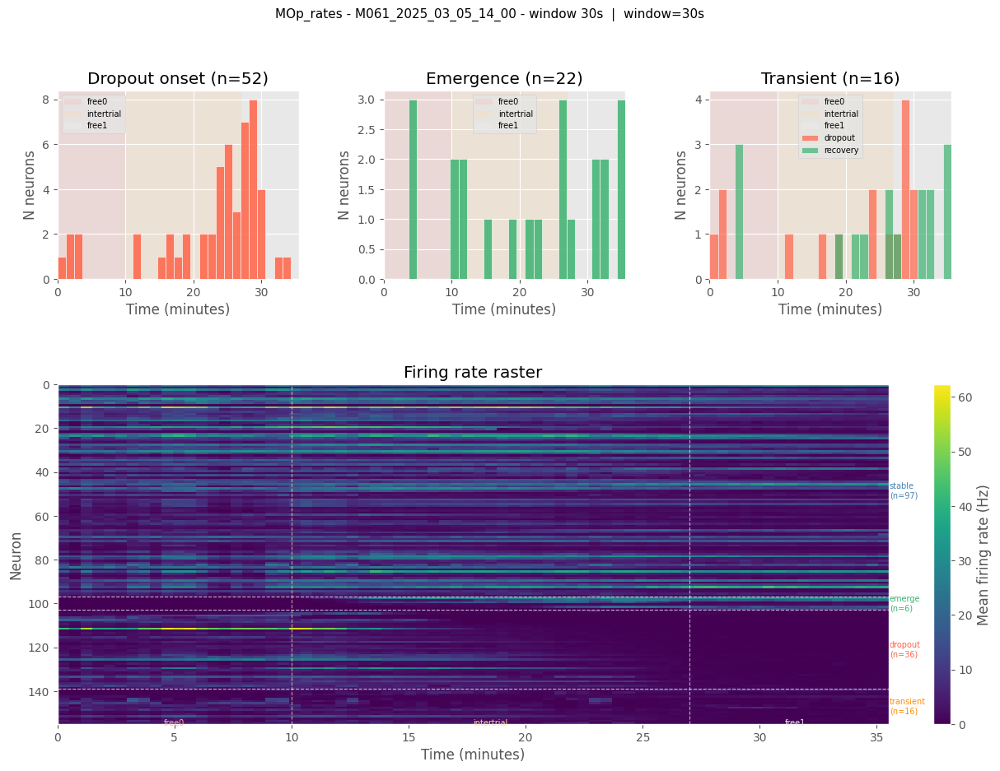

 windows: 72 , bins per window: 3000, features: 118 
trial_type
intertrial    34
free0         20
free1         18
Name: count, dtype: int64
type
stable       72
dropout      32
emerge       10
transient     4
Stable: 72 / 118


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


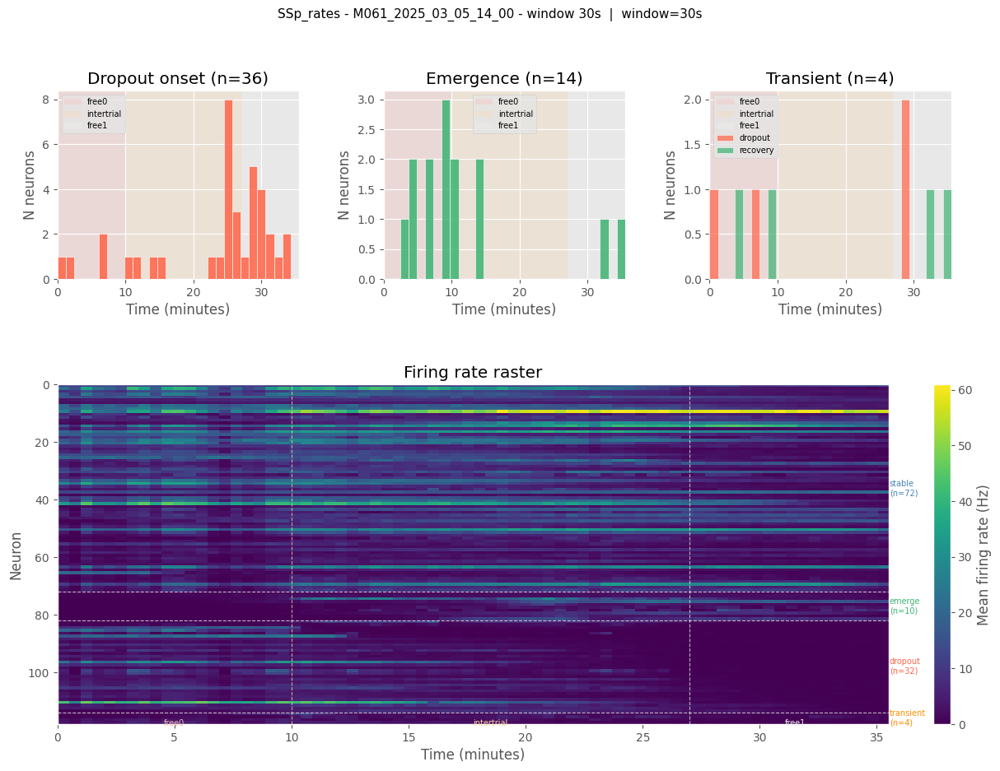

 windows: 72 , bins per window: 3000, features: 219 
trial_type
intertrial    34
free0         20
free1         18
Name: count, dtype: int64
type
stable       190
emerge        21
transient      7
dropout        1
Stable: 190 / 219


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


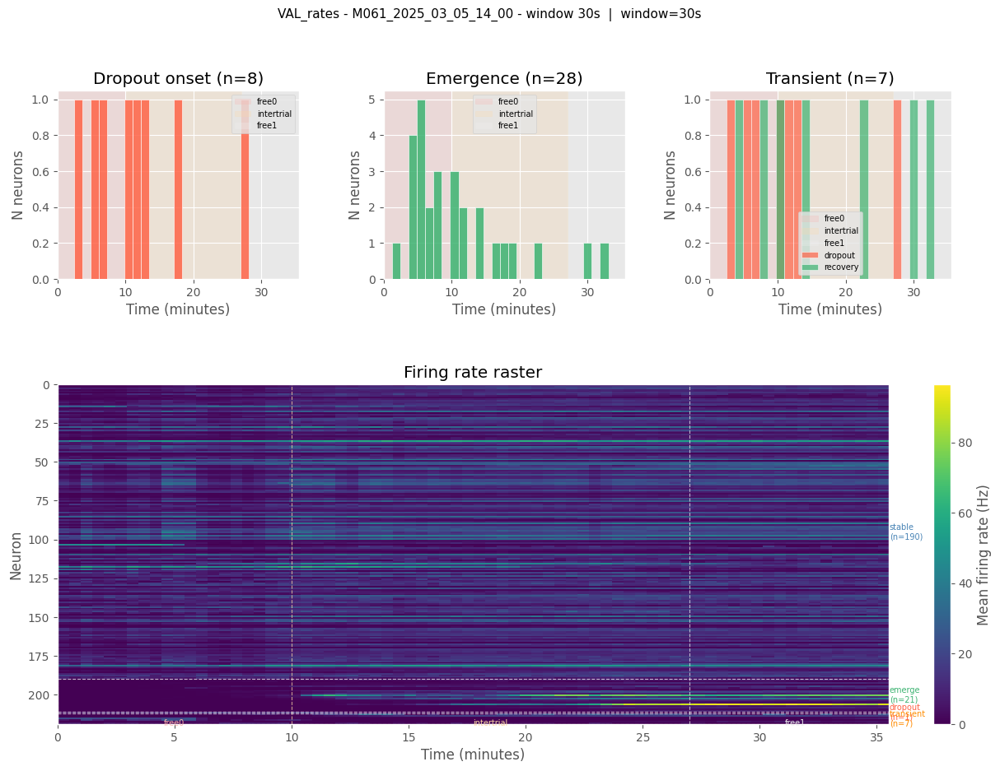

 windows: 72 , bins per window: 3000, features: 195 
trial_type
intertrial    34
free0         20
free1         18
Name: count, dtype: int64
type
stable       109
emerge        59
transient     20
dropout        7
Stable: 109 / 195


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


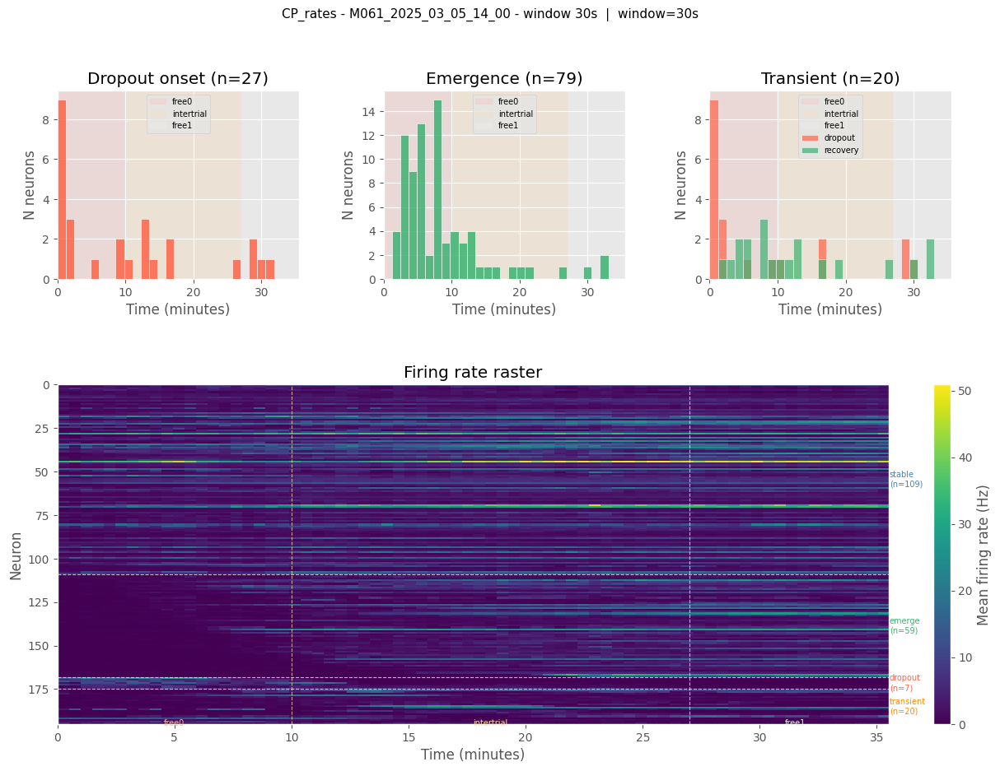

M061_2025_03_06_14_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 53999 in trial: free and id: 668, inserting NaN.
Extending index to 53989 in trial: free and id: 668, inserting NaN.
Extending index to 53990 in trial: free and id: 668, inserting NaN.
Extending index to 53991 in trial: free and id: 668, inserting NaN.
Extending index to 53992 in trial: free and id: 668, inserting NaN.
Extending index to 53993 in trial: free and id: 668, inserting NaN.
Extending index to 53994 in trial: free and id: 668, inserting NaN.
Extending index to 53995 in trial: free and id: 668, inserting NaN.
Extending index to 53996 in trial: free and id: 668, inserting NaN.
Extending index to 53997 in trial: free and id: 668, inserting NaN.
Extending index to 53998 in trial: free and id: 668, inserting NaN.
Extending index to 53999 in trial: free and id: 668, inserting NaN.
Combined every 1

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


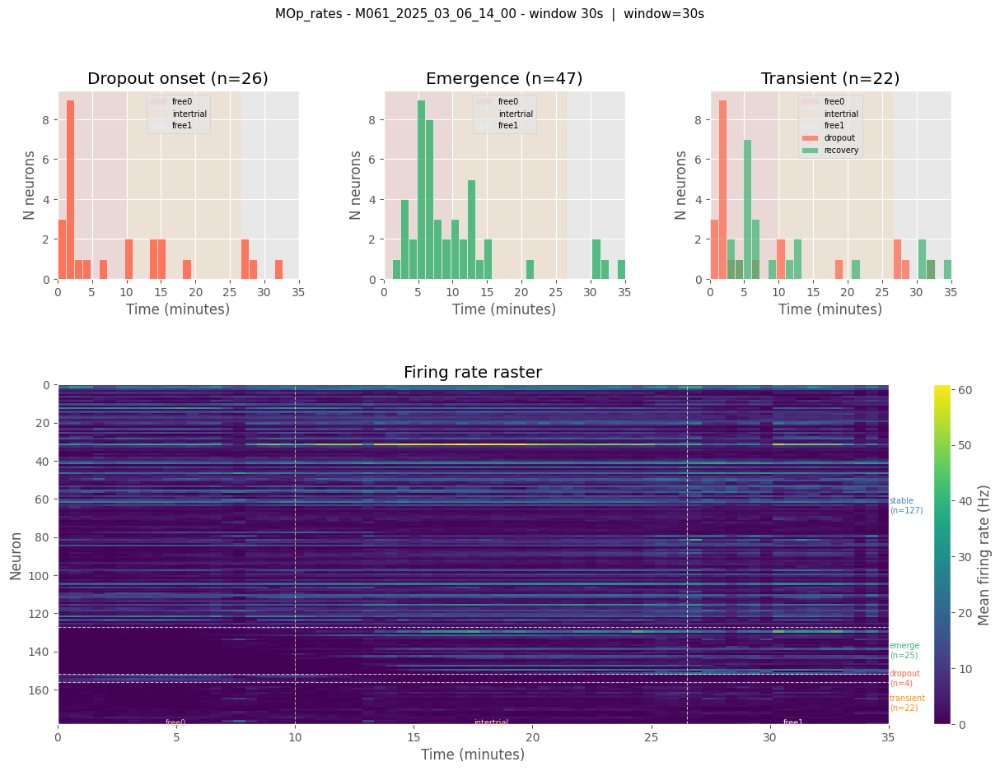

 windows: 71 , bins per window: 3000, features: 69 
trial_type
intertrial    33
free0         20
free1         18
Name: count, dtype: int64
type
stable       62
transient     4
emerge        2
dropout       1
Stable: 62 / 69


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


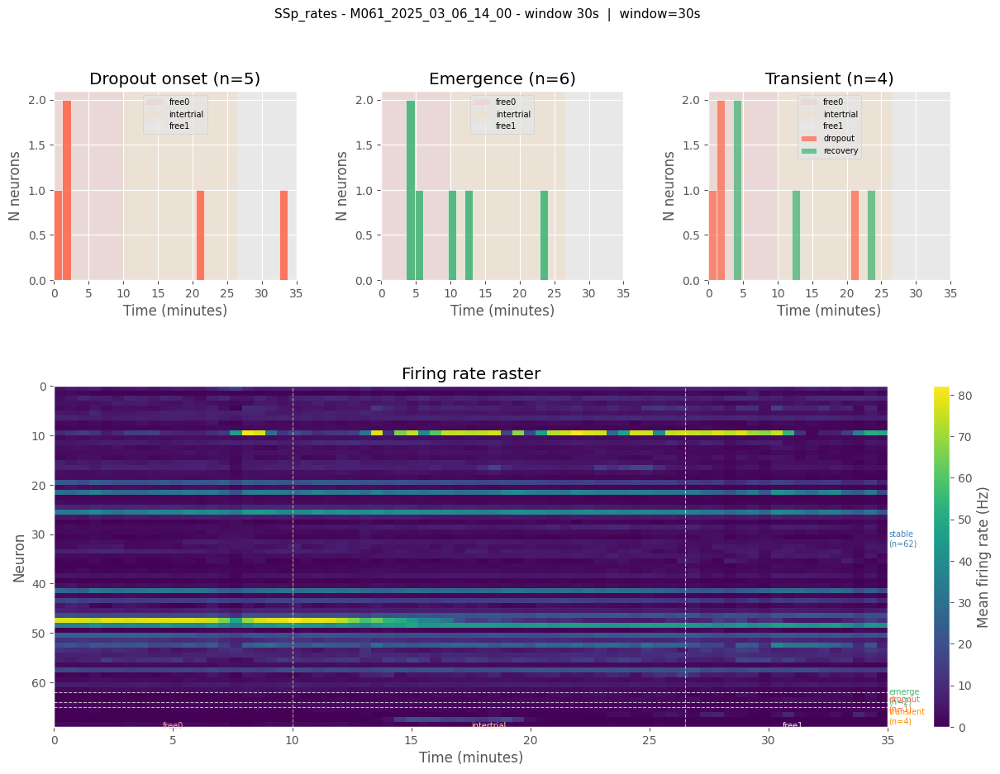

 windows: 71 , bins per window: 3000, features: 168 
trial_type
intertrial    33
free0         20
free1         18
Name: count, dtype: int64
type
stable       153
emerge         8
dropout        5
transient      2
Stable: 153 / 168


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


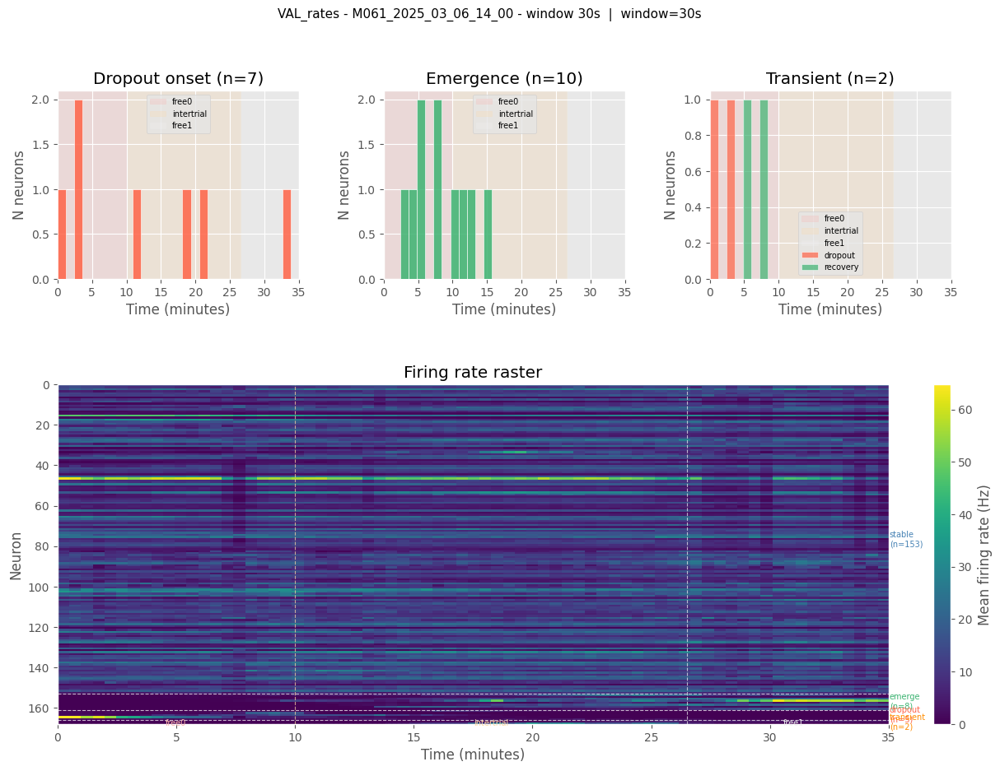

 windows: 71 , bins per window: 3000, features: 172 
trial_type
intertrial    33
free0         20
free1         18
Name: count, dtype: int64
type
stable       67
emerge       57
transient    27
dropout      21
Stable: 67 / 172


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


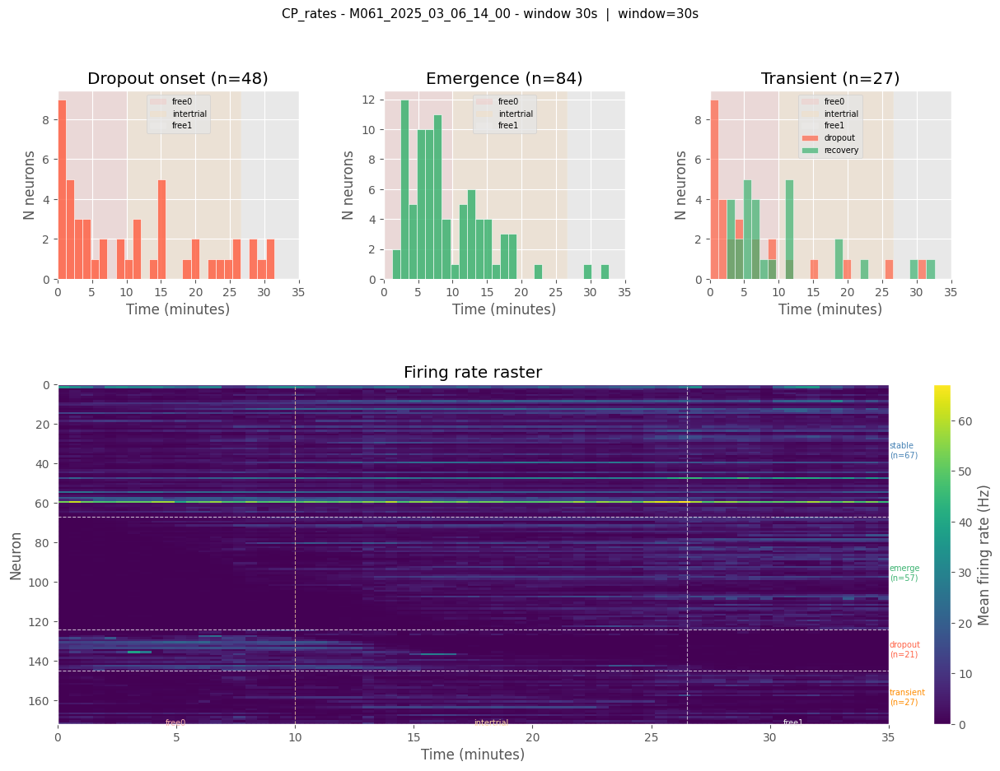

M063_2025_03_12_14_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger'] could not be converted to int.
fields: ['values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 47989 in trial: free and id: 710, inserting NaN.
Extending index to 47990 in trial: free and id: 710, inserting NaN.
Extending index to 47991 in trial: free and id: 710, inserting NaN.
Extending index to 47992 in trial: free and id: 710, inserting NaN.
Extending index to 47993 in trial: free and id: 710, inserting NaN.
Extending index to 47994 in trial: free and id: 710, inserting NaN.
Extending index to 47995 in trial: free and id: 710, inserting NaN.
Extending index to 47996 in trial: free and id: 710, inserting NaN.
Extending index to 47997 in trial: free and id: 710, inserting NaN.
Extending index to 47998 in trial: free and id: 710, inserting NaN.
Extending 

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


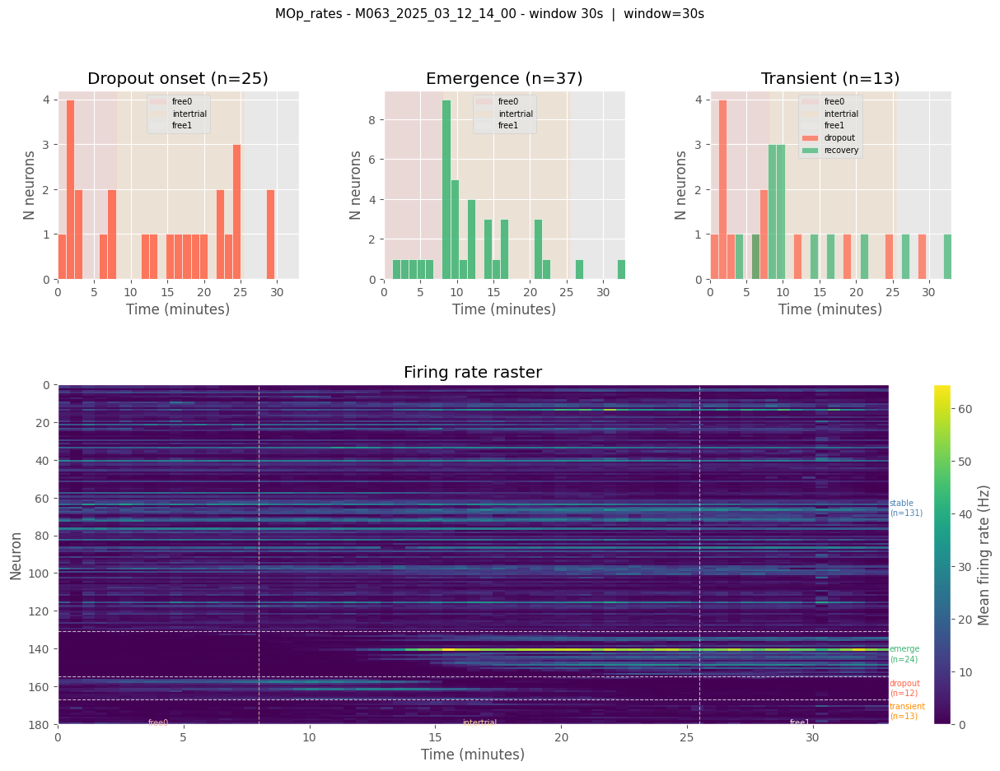

 windows: 67 , bins per window: 3000, features: 94 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       79
dropout       8
emerge        4
transient     3
Stable: 79 / 94


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


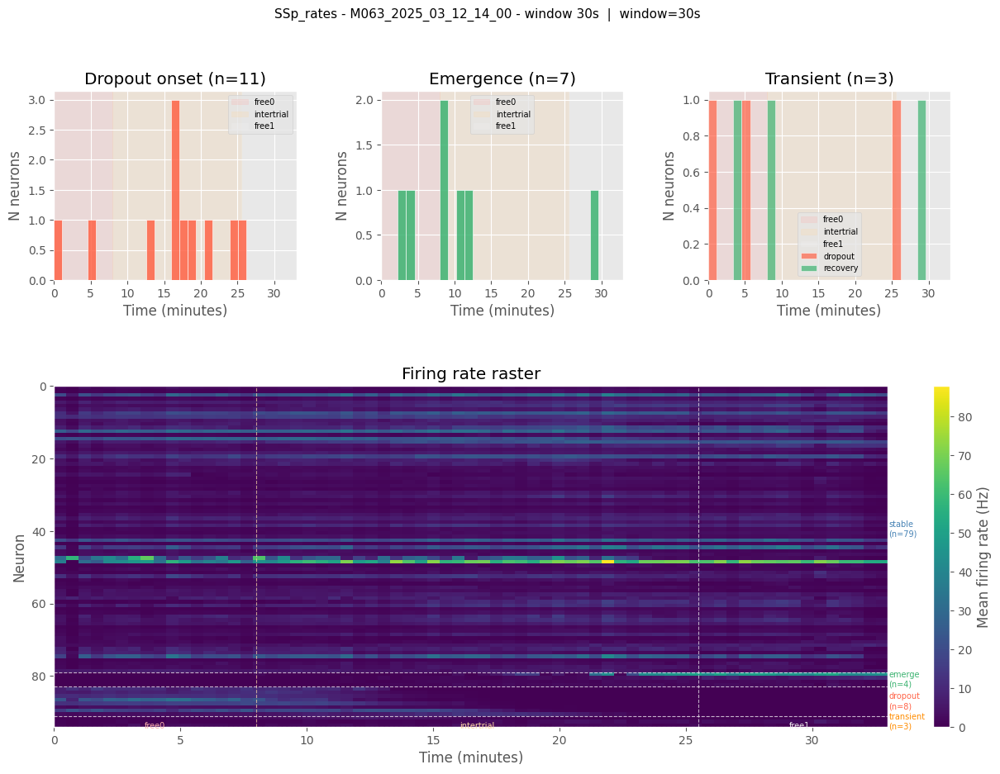

 windows: 67 , bins per window: 3000, features: 198 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       172
emerge        13
dropout        8
transient      5
Stable: 172 / 198


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


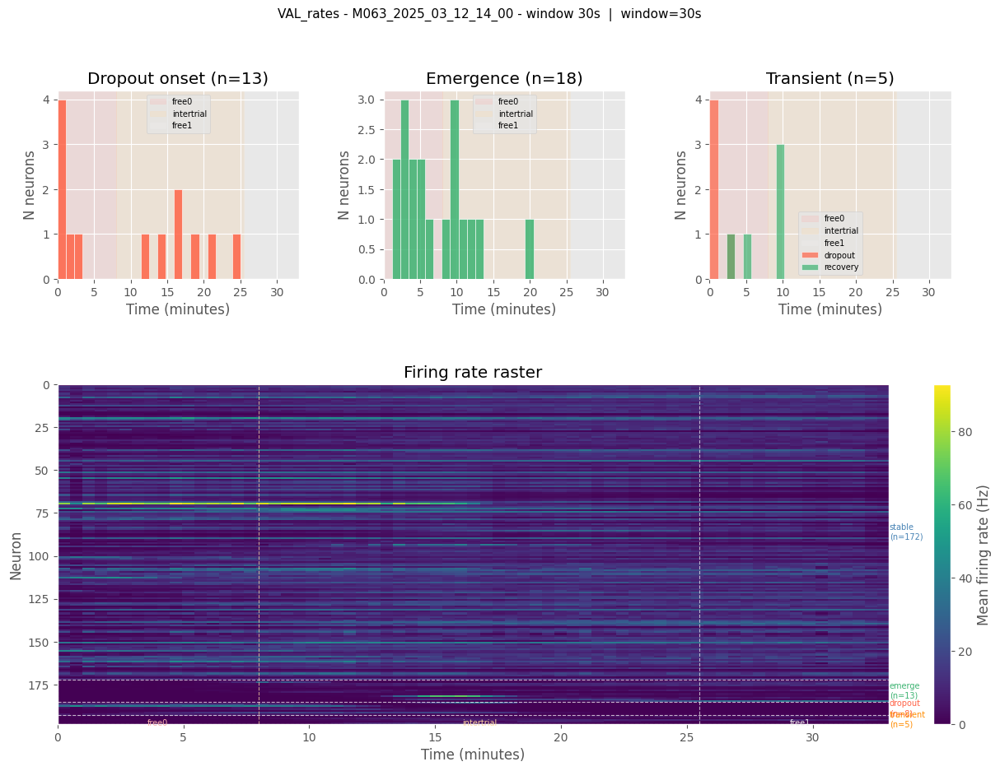

 windows: 67 , bins per window: 3000, features: 302 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       175
emerge        63
transient     33
dropout       31
Stable: 175 / 302


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


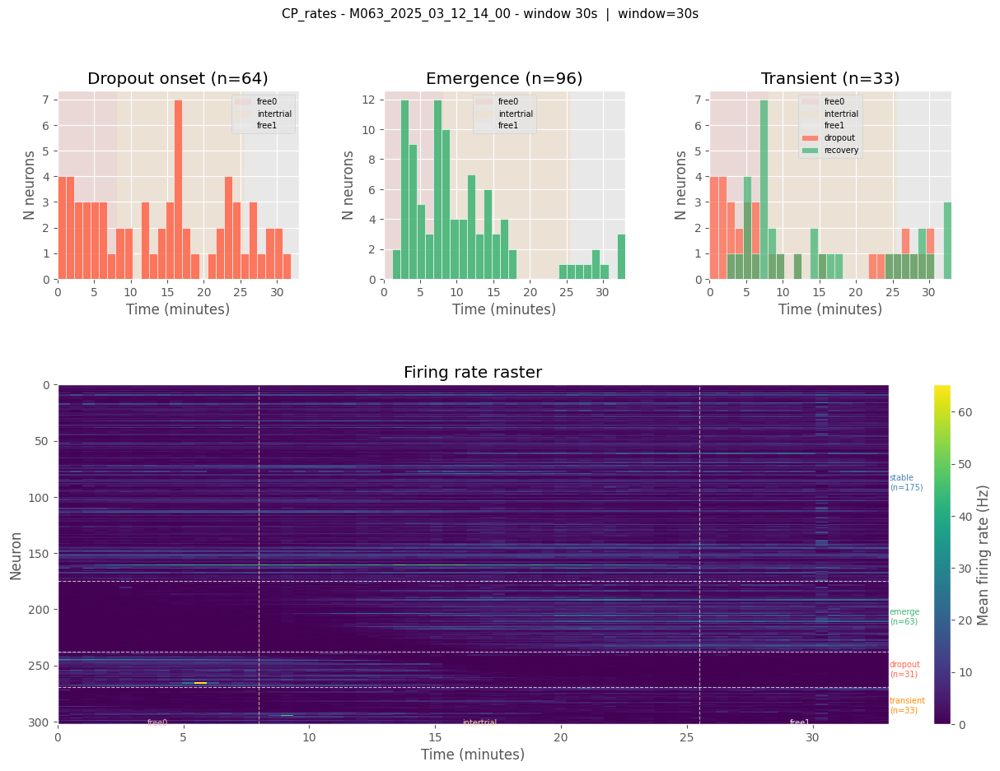

M063_2025_03_13_14_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger'] could not be converted to int.
fields: ['idx_motion'] could not be converted to int.
fields: ['values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 47999 in trial: free and id: 721, inserting NaN.
Extending index to 47989 in trial: free and id: 721, inserting NaN.
Extending index to 47990 in trial: free and id: 721, inserting NaN.
Extending index to 47991 in trial: free and id: 721, inserting NaN.
Extending index to 47992 in trial: free and id: 721, inserting NaN.
Extending index to 47993 in trial: free and id: 721, inserting NaN.
Extending index to 47994 in trial: free and id: 721, inserting NaN.
Extending index to 47995 in trial: free and id: 721, inserting NaN.
Extending index to 47996 in trial: free and id: 721, inserting NaN.
Extending index to 47997

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


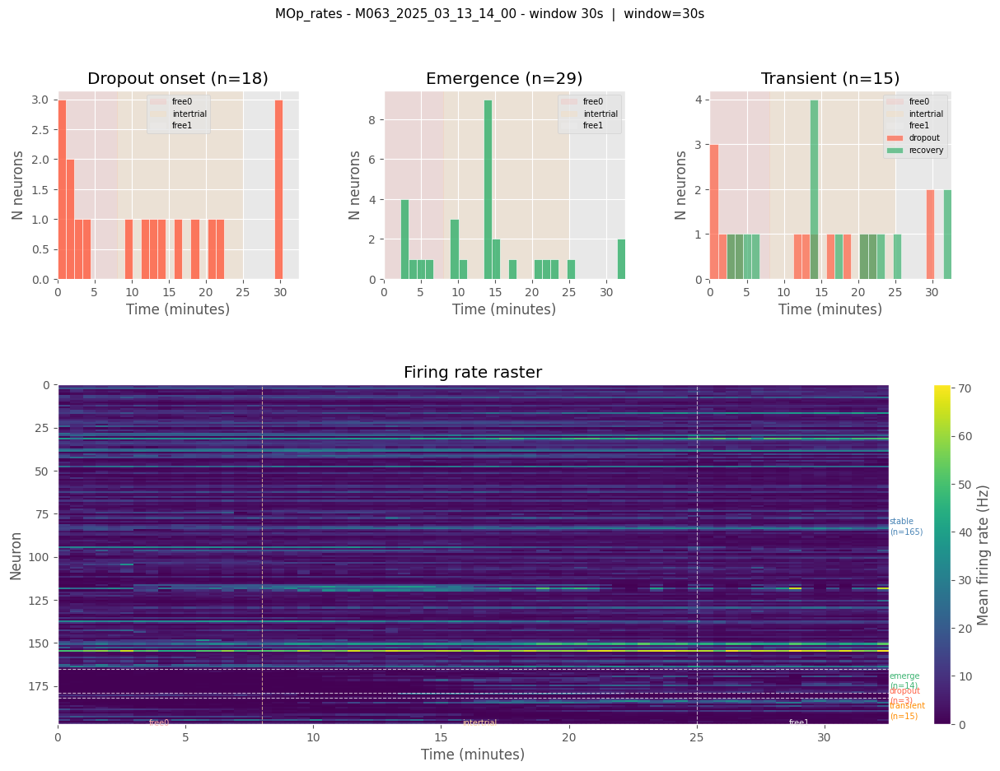

 windows: 66 , bins per window: 3000, features: 131 
trial_type
intertrial    34
free0         16
free1         16
Name: count, dtype: int64
type
stable       123
transient      7
dropout        1
Stable: 123 / 131


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


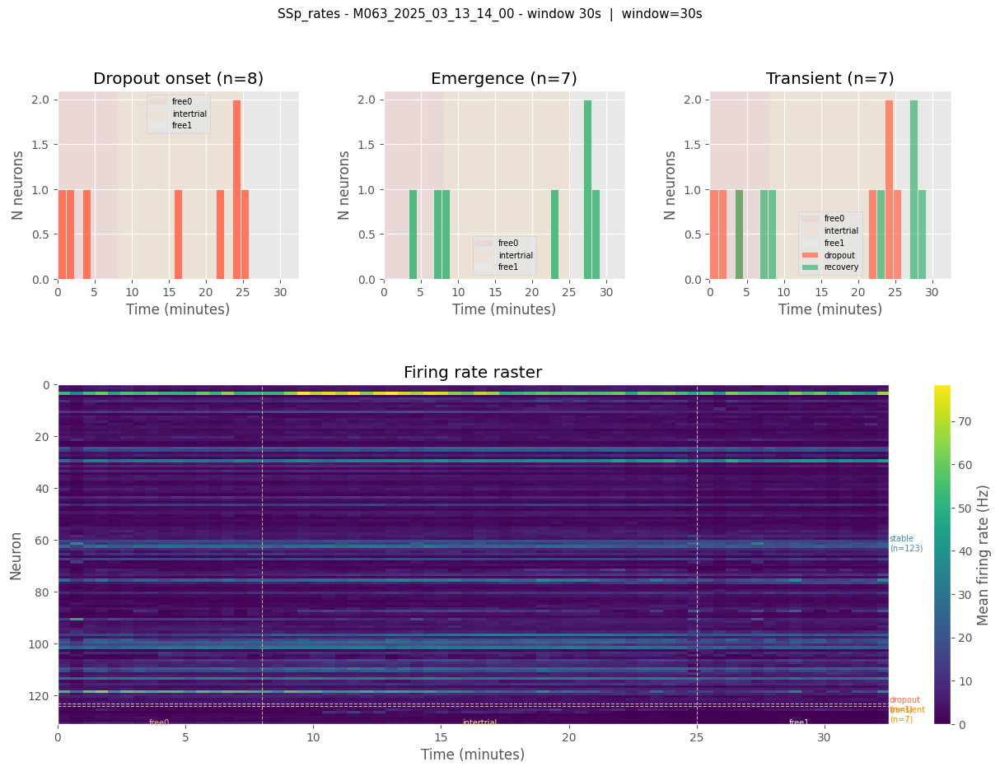

 windows: 66 , bins per window: 3000, features: 188 
trial_type
intertrial    34
free0         16
free1         16
Name: count, dtype: int64
type
stable       172
transient      7
dropout        7
emerge         2
Stable: 172 / 188


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


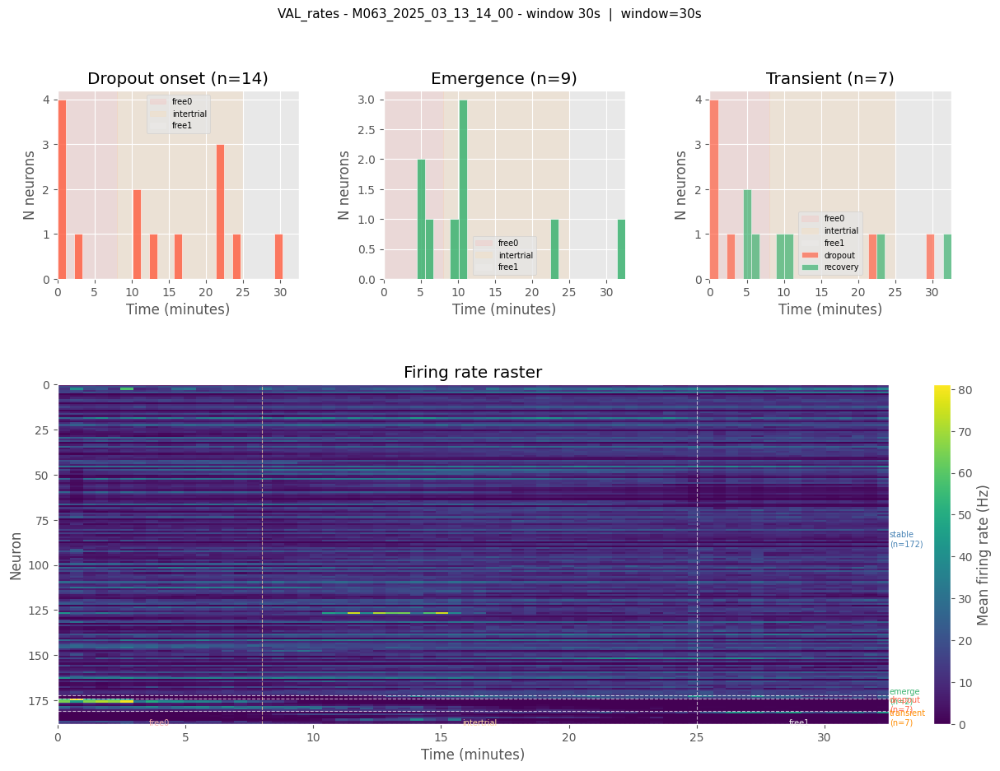

 windows: 66 , bins per window: 3000, features: 408 
trial_type
intertrial    34
free0         16
free1         16
Name: count, dtype: int64
type
stable       289
transient     46
emerge        46
dropout       27
Stable: 289 / 408


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


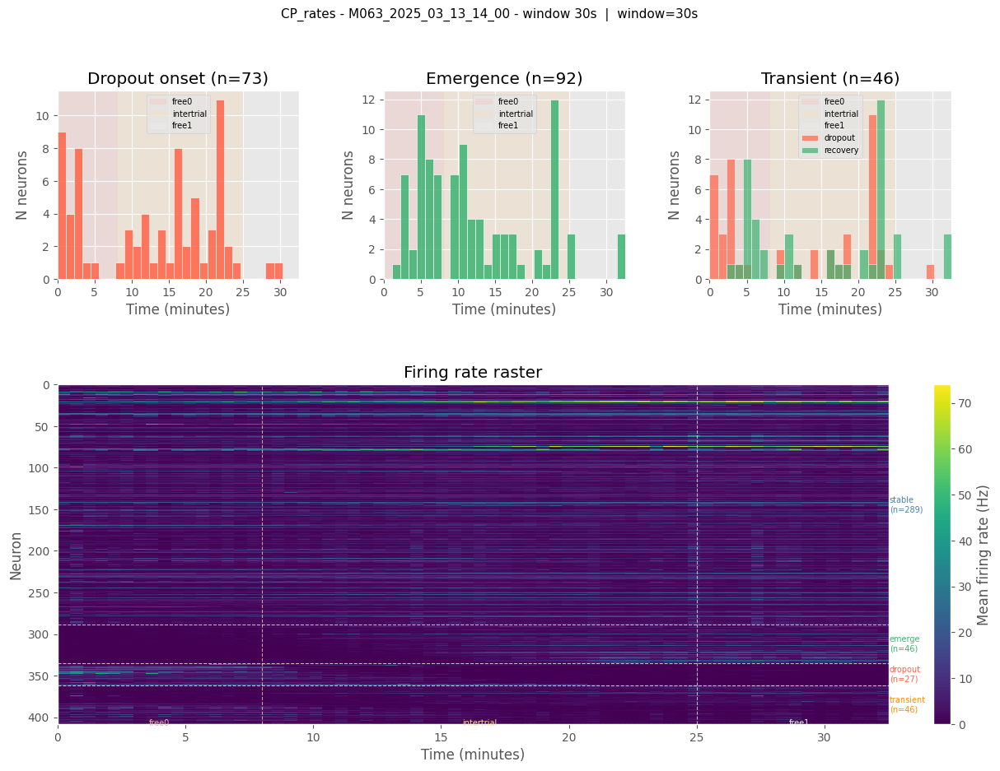

M063_2025_03_14_15_30
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger'] could not be converted to int.
fields: ['idx_motion', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
fields: ['idx_motion', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 53999 in trial: free and id: 676, inserting NaN.
Extending index to 53989 in trial: free and id: 676, inserting NaN.
Extending index to 53990 in trial: free and id: 676, inserting NaN.
Extending index to 53991 in trial: free and id: 676, inserting NaN.
Extending index to 53992 in trial: free and id: 676, inserting NaN.
Extending index to 53993 in trial: free and id: 676, inserting NaN.
Extending index to 53994 in trial: free and id: 676, inserting NaN.
Extending index to 53995 in trial: free and 

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


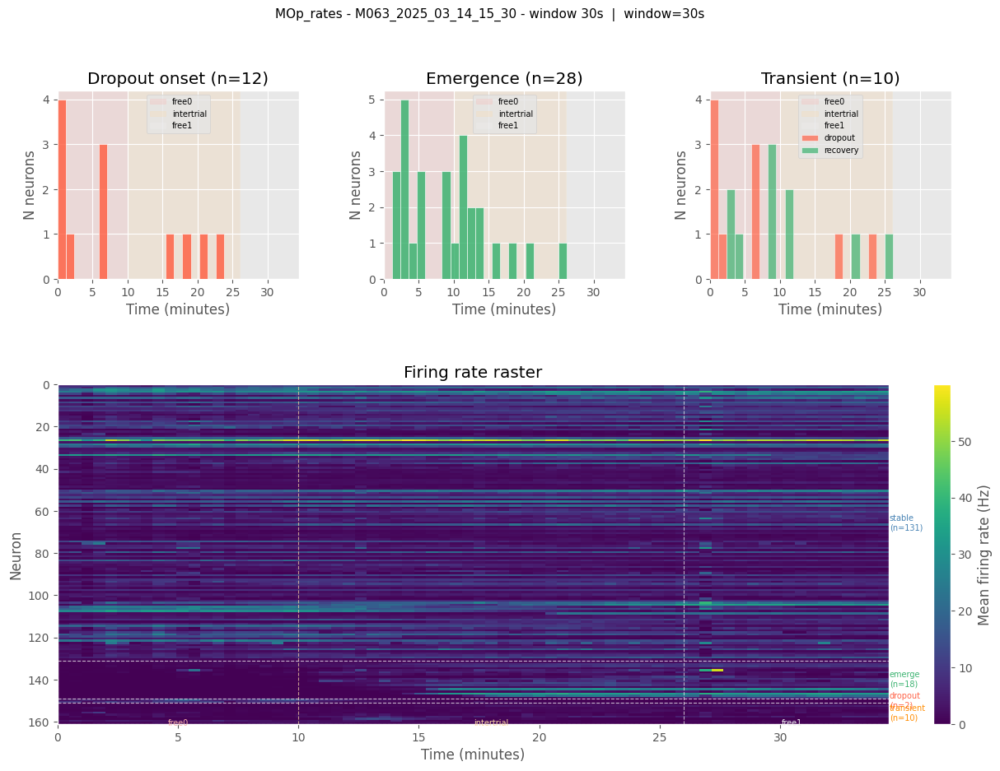

 windows: 70 , bins per window: 3000, features: 92 
trial_type
intertrial    32
free0         20
free1         18
Name: count, dtype: int64
type
stable       72
emerge       10
transient     6
dropout       4
Stable: 72 / 92


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


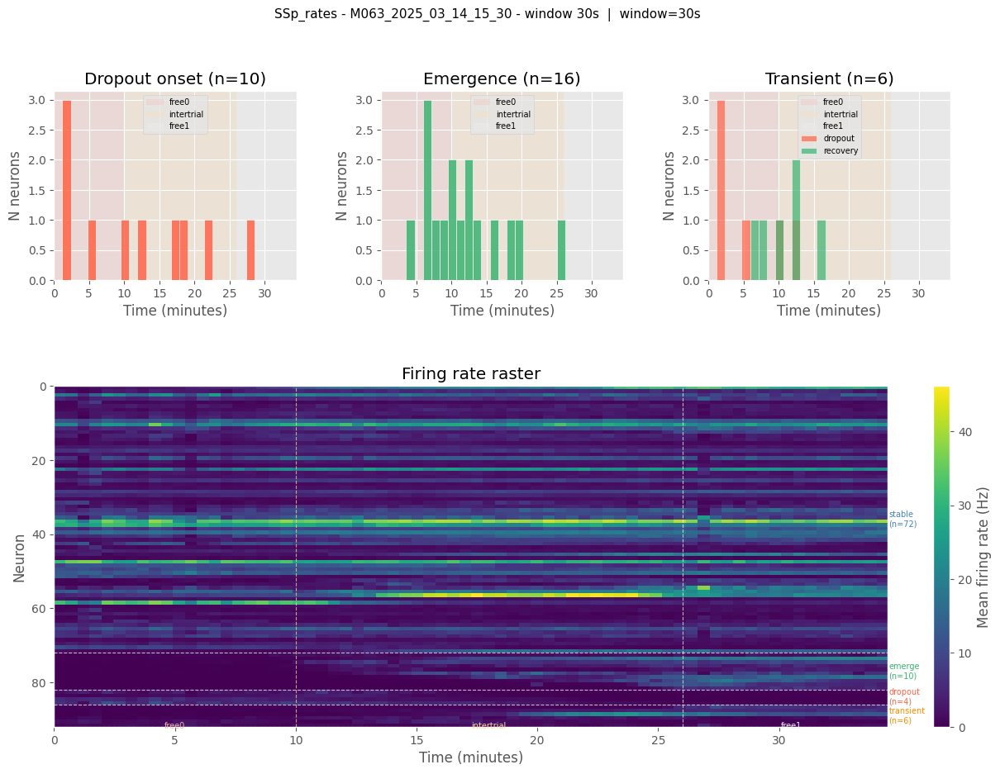

 windows: 70 , bins per window: 3000, features: 260 
trial_type
intertrial    32
free0         20
free1         18
Name: count, dtype: int64
type
stable       230
emerge        12
transient      9
dropout        9
Stable: 230 / 260


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


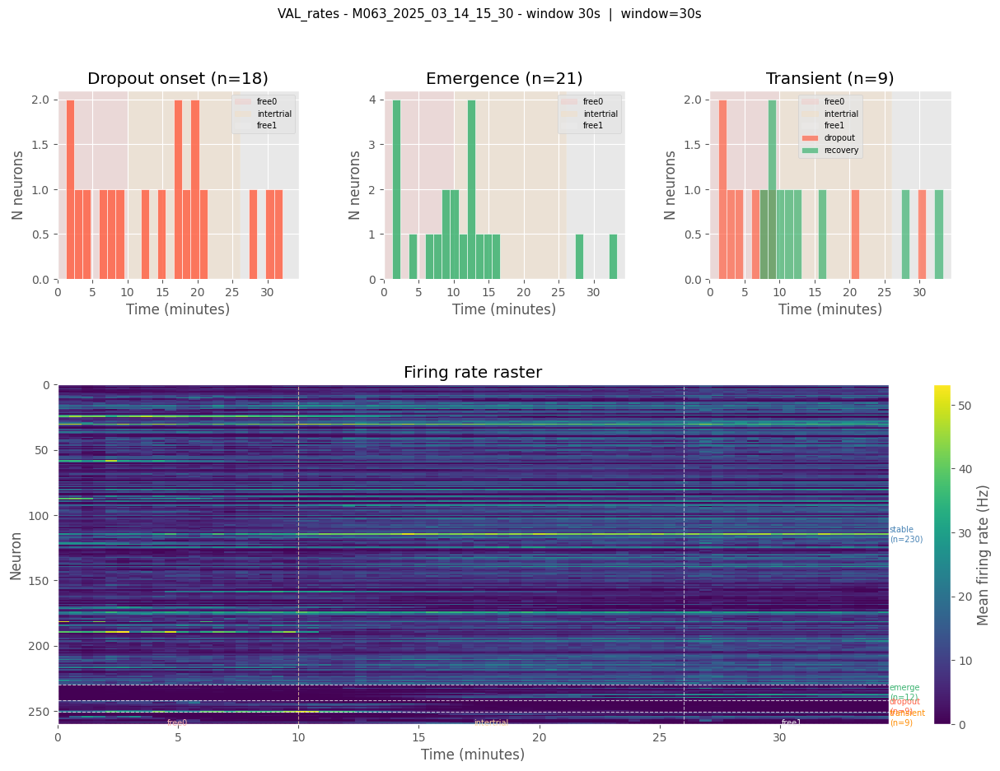

 windows: 70 , bins per window: 3000, features: 329 
trial_type
intertrial    32
free0         20
free1         18
Name: count, dtype: int64
type
stable       205
emerge        56
transient     45
dropout       23
Stable: 205 / 329


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


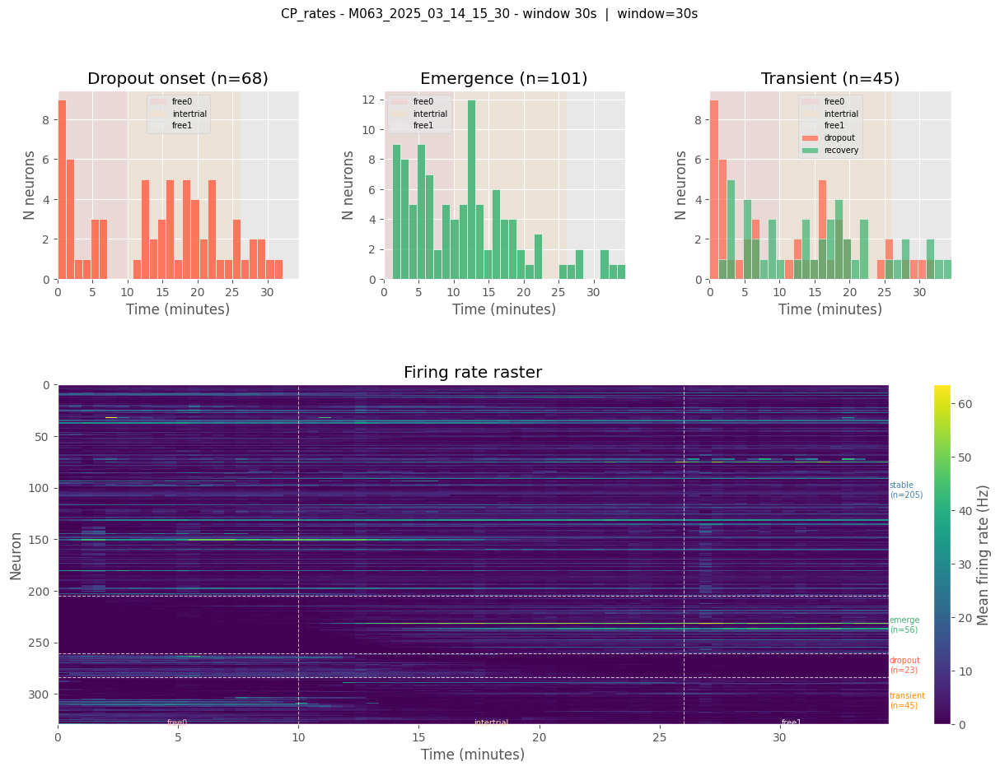

M078_2025_08_05_15_30
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 113999 in trial: free and id: 529, inserting NaN.
Extending index to 113999 in trial: free and id: 529, inserting NaN.
Combined every 1 bins
Resulting VAL_spikes ephys data shape is (NxT): (143, 120000)
Resulting all_spikes ephys data shape is (NxT): (24, 120000)
Resulting SSp_spikes ephys data sha

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


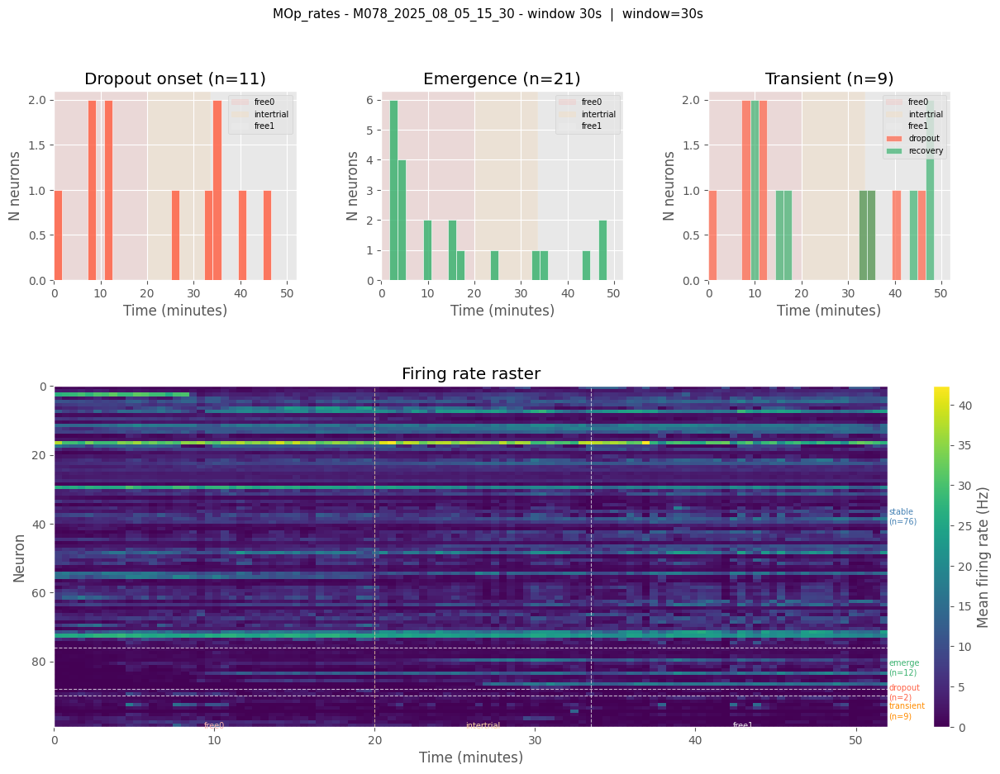

 windows: 105 , bins per window: 3000, features: 114 
trial_type
free0         40
free1         38
intertrial    27
Name: count, dtype: int64
type
stable       87
emerge       17
transient     9
dropout       1
Stable: 87 / 114


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


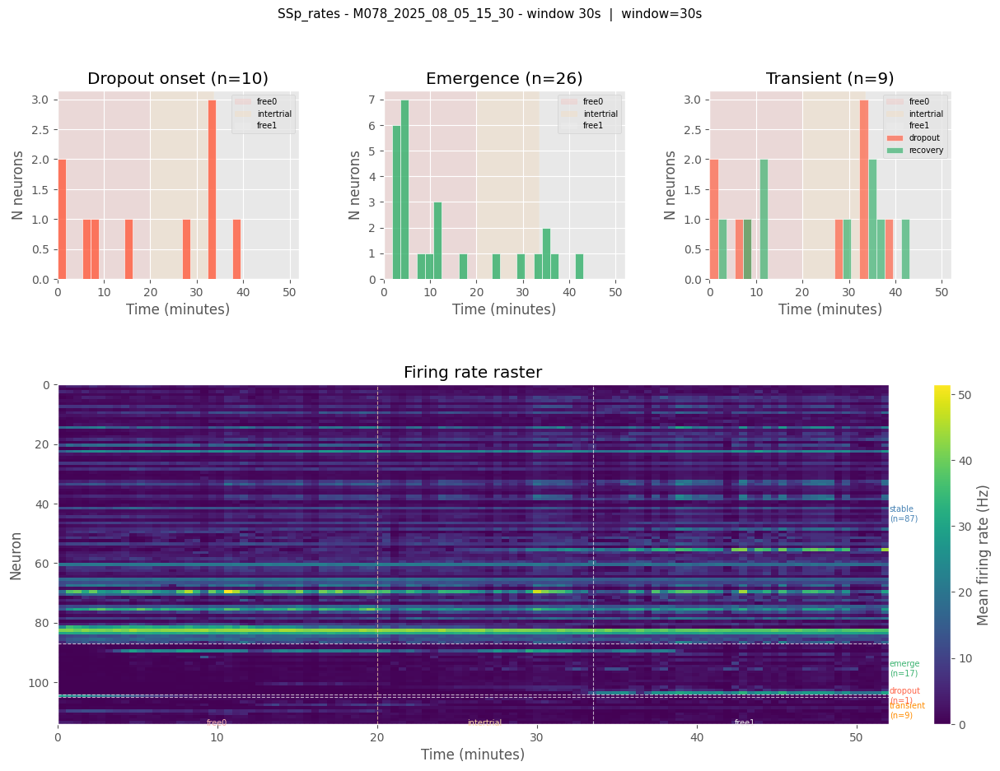

 windows: 105 , bins per window: 3000, features: 143 
trial_type
free0         40
free1         38
intertrial    27
Name: count, dtype: int64
type
stable       130
emerge        10
transient      3
Stable: 130 / 143


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


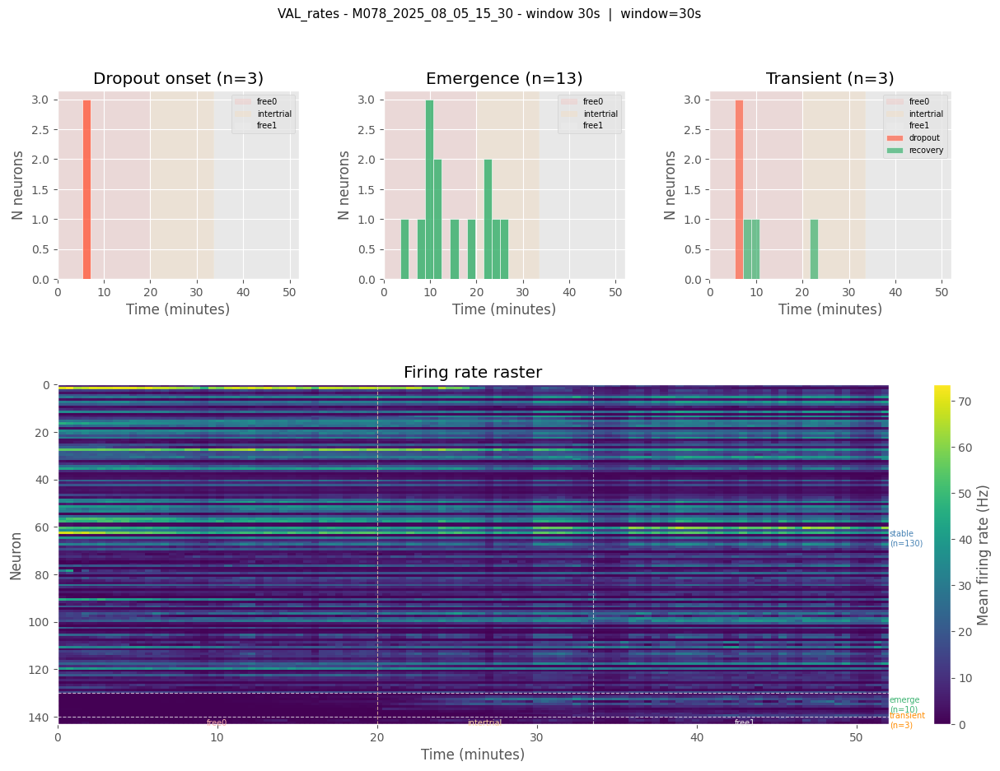

 windows: 105 , bins per window: 3000, features: 280 
trial_type
free0         40
free1         38
intertrial    27
Name: count, dtype: int64
type
stable       131
emerge        87
transient     32
dropout       30
Stable: 131 / 280


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


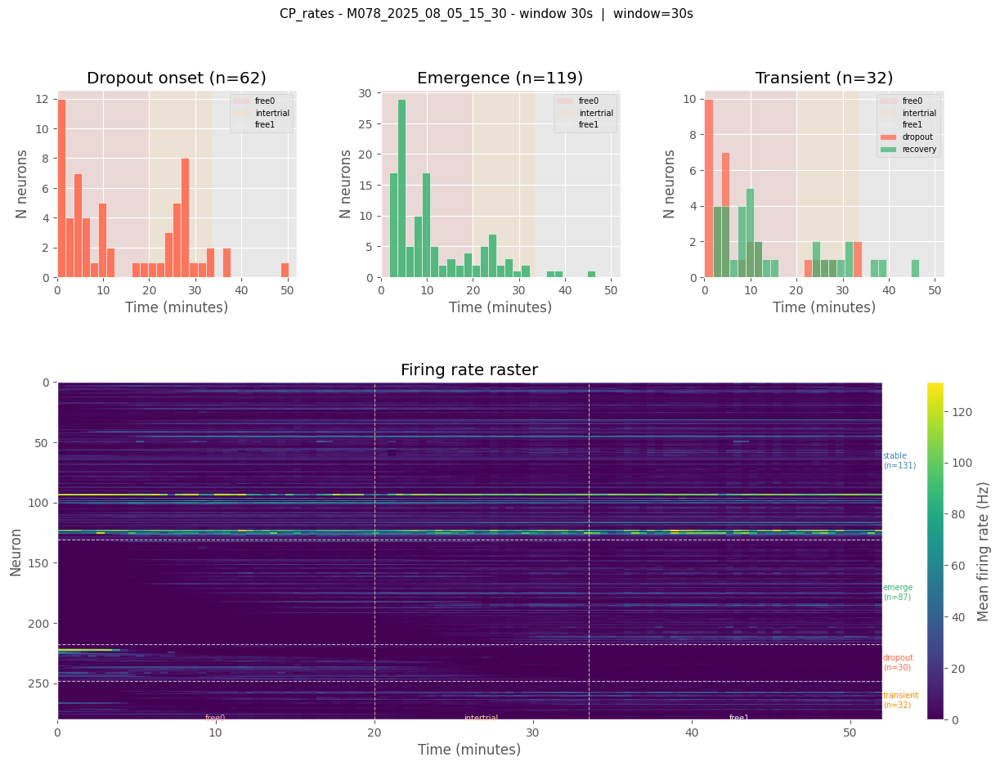

M078_2025_08_06_15_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_duration', 'values_Sol_direction'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_duration', 'values_Sol_direction'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_duration', 'idx_Sol_duration', 'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on'] could not be converted to int.
fields: ['values_before_camera_trigger', 'idx_motion', 'values_Sol_duration', 'values_Sol_direction'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 41999 in trial: free and id: 1003, inserting NaN.
Extending index to 41999 in trial: free and id: 1003, inserting NaN.
Combined every 1 bins
Resulting SSp_spikes ephys data shape is (NxT): (90, 48000)
Resulting all_spikes ephys data shape is (NxT): (54, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (192, 48000)
Resulting MOs_spik

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


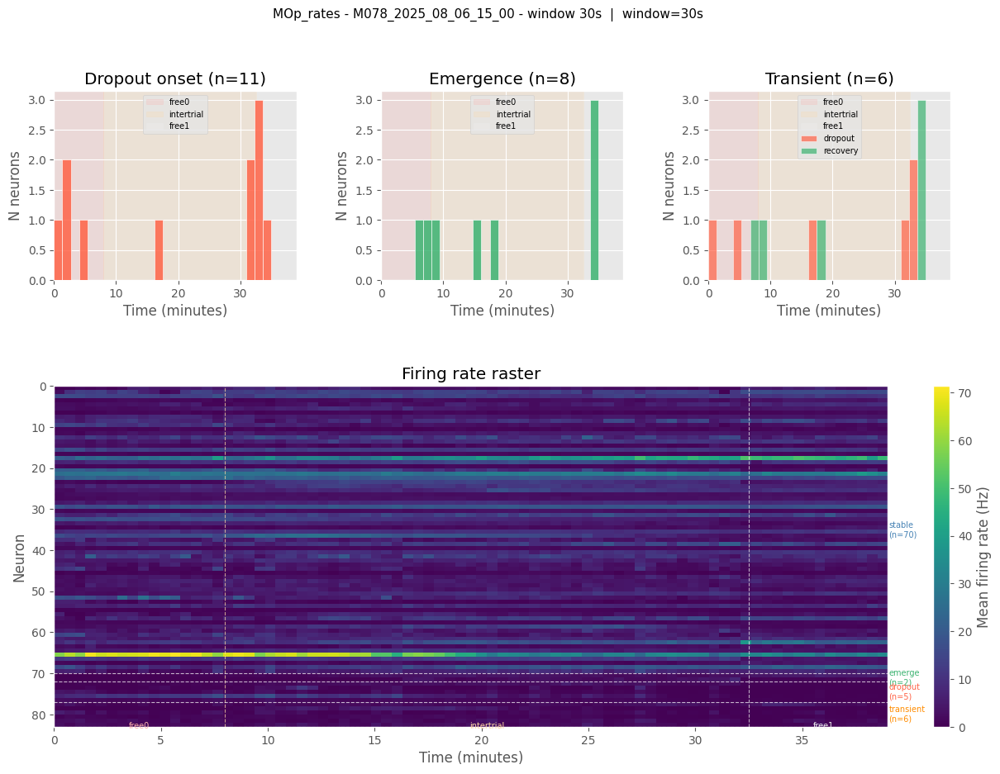

 windows: 79 , bins per window: 3000, features: 90 
trial_type
intertrial    49
free0         16
free1         14
Name: count, dtype: int64
type
stable       60
emerge       17
dropout       7
transient     6
Stable: 60 / 90


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


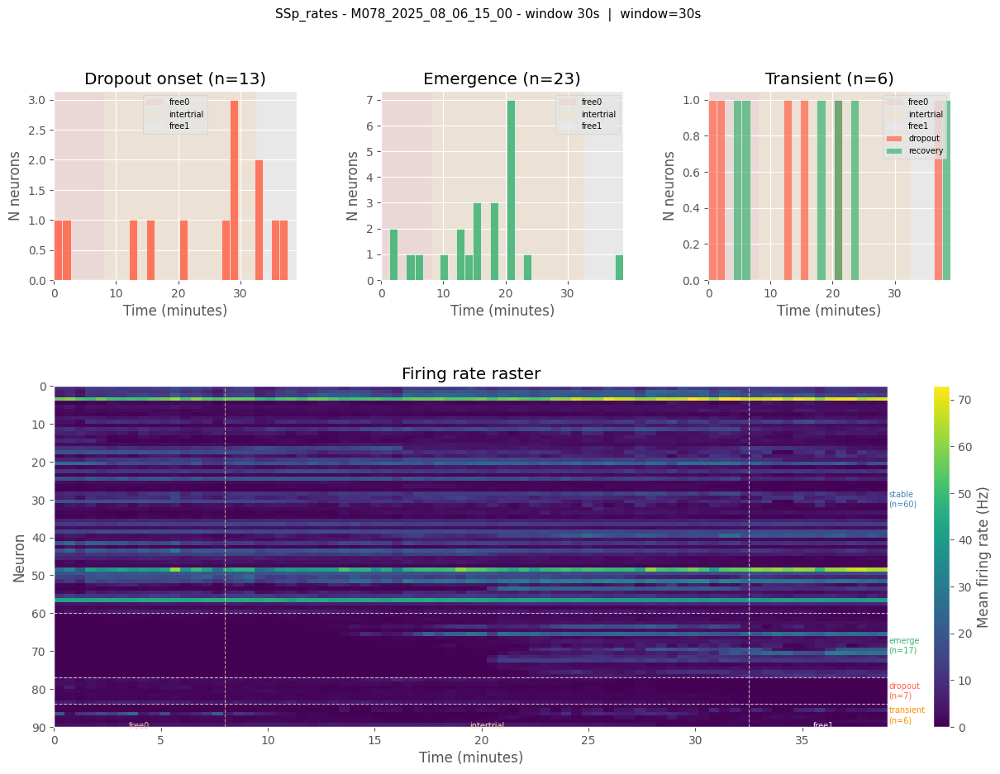

 windows: 79 , bins per window: 3000, features: 192 
trial_type
intertrial    49
free0         16
free1         14
Name: count, dtype: int64
type
stable       179
emerge         9
dropout        2
transient      2
Stable: 179 / 192


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


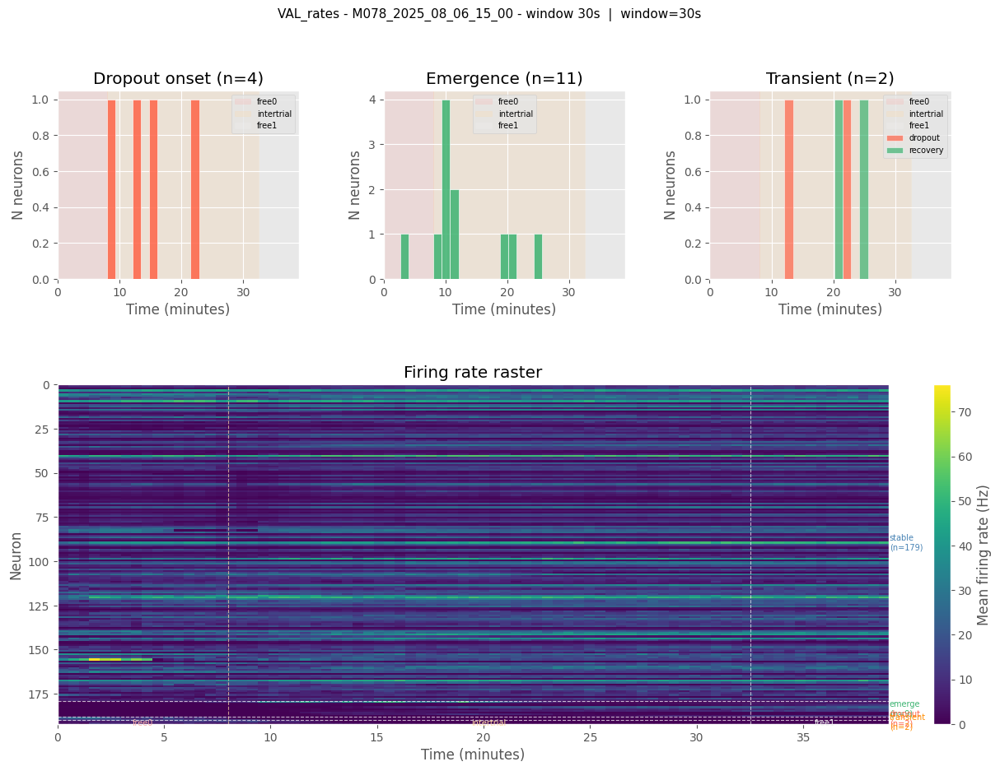

 windows: 79 , bins per window: 3000, features: 151 
trial_type
intertrial    49
free0         16
free1         14
Name: count, dtype: int64
type
emerge       76
stable       50
transient    19
dropout       6
Stable: 50 / 151


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


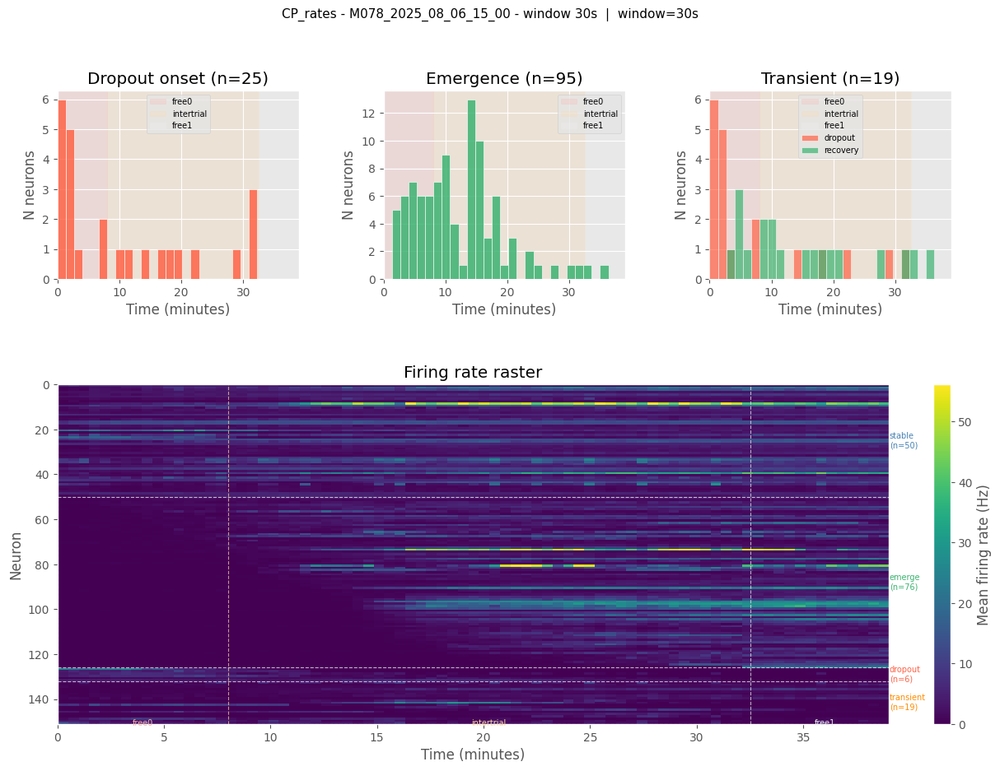

M078_2025_08_07_13_30
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_duration', 'values_Sol_direction'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_duration', 'values_Sol_direction'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_duration', 'idx_Sol_duration', 'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 113999 in trial: free and id: 536, inserting NaN.
Extending index to 113999 in trial: free and id: 536, inserting NaN.
Combined every 1 bins
Resulting SSp_spikes ephys data shape is (NxT): (83, 120000)
Resulting VAL_spikes ephys data shape is (NxT): (264, 120000)
Resulting all_spikes ephys data shape is (NxT): (81, 120000)
Resulting MOs_spikes ephys data shape is (NxT): (157, 120000)
Resulting CP_spikes ephys data shape is (NxT): (153, 120000)
Resulting MOp_spikes ephy

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


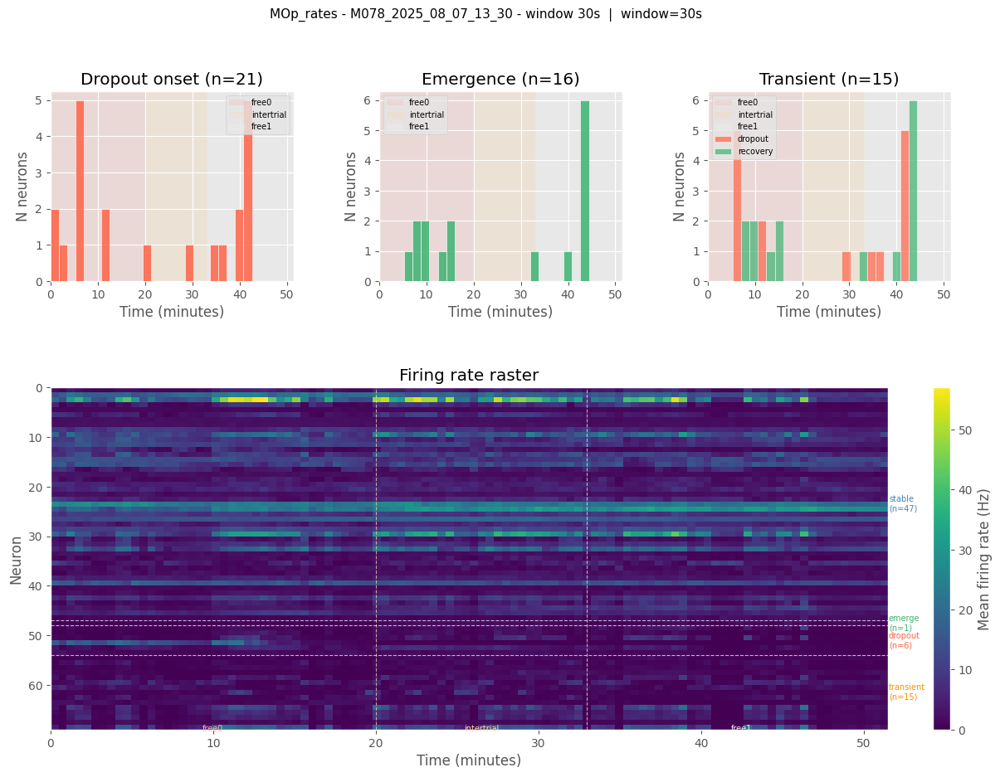

 windows: 104 , bins per window: 3000, features: 83 
trial_type
free0         40
free1         38
intertrial    26
Name: count, dtype: int64
type
stable       50
transient    19
emerge        8
dropout       6
Stable: 50 / 83


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


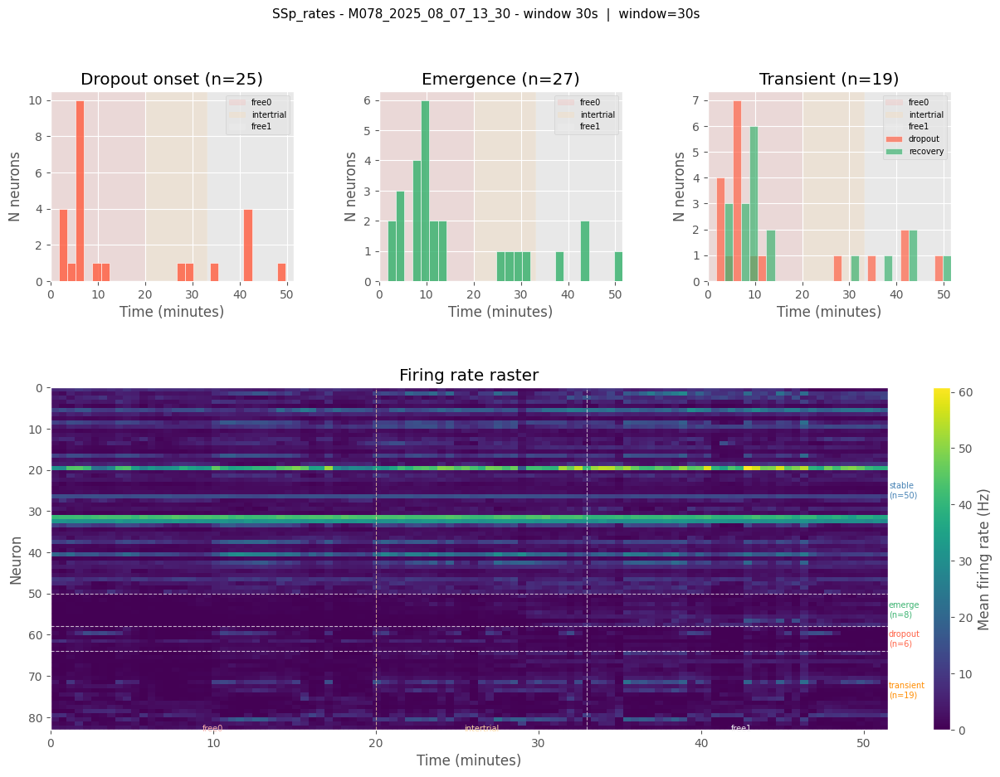

 windows: 104 , bins per window: 3000, features: 264 
trial_type
free0         40
free1         38
intertrial    26
Name: count, dtype: int64
type
stable       226
transient     15
dropout       13
emerge        10
Stable: 226 / 264


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


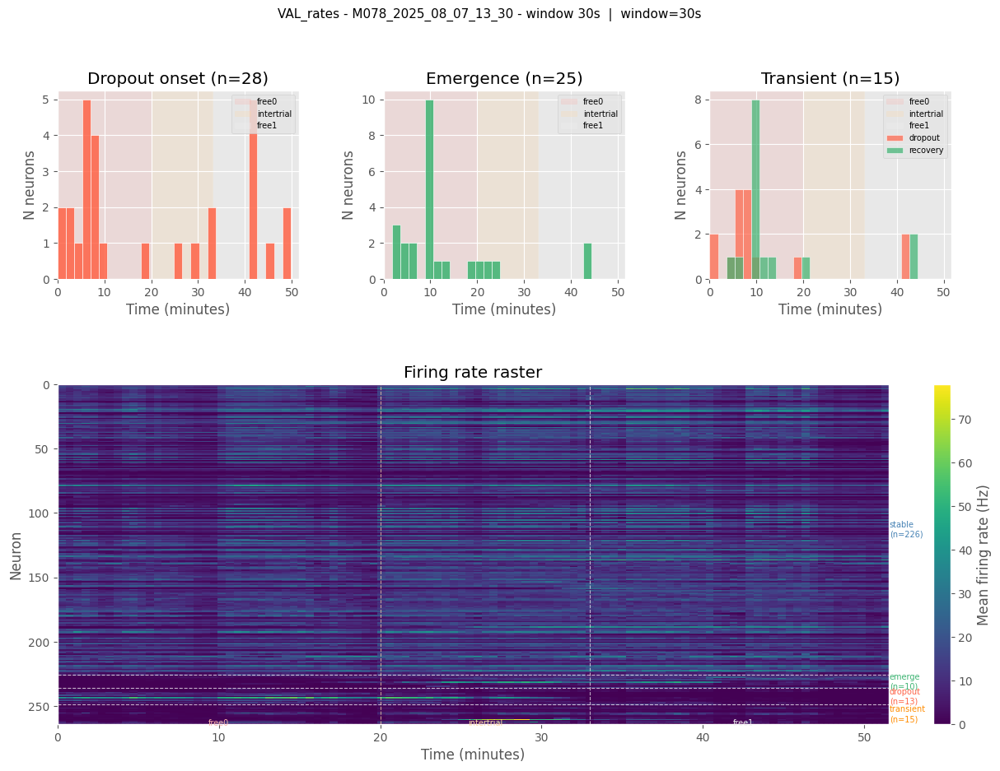

 windows: 104 , bins per window: 3000, features: 153 
trial_type
free0         40
free1         38
intertrial    26
Name: count, dtype: int64
type
stable       109
transient     19
dropout       13
emerge        12
Stable: 109 / 153


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


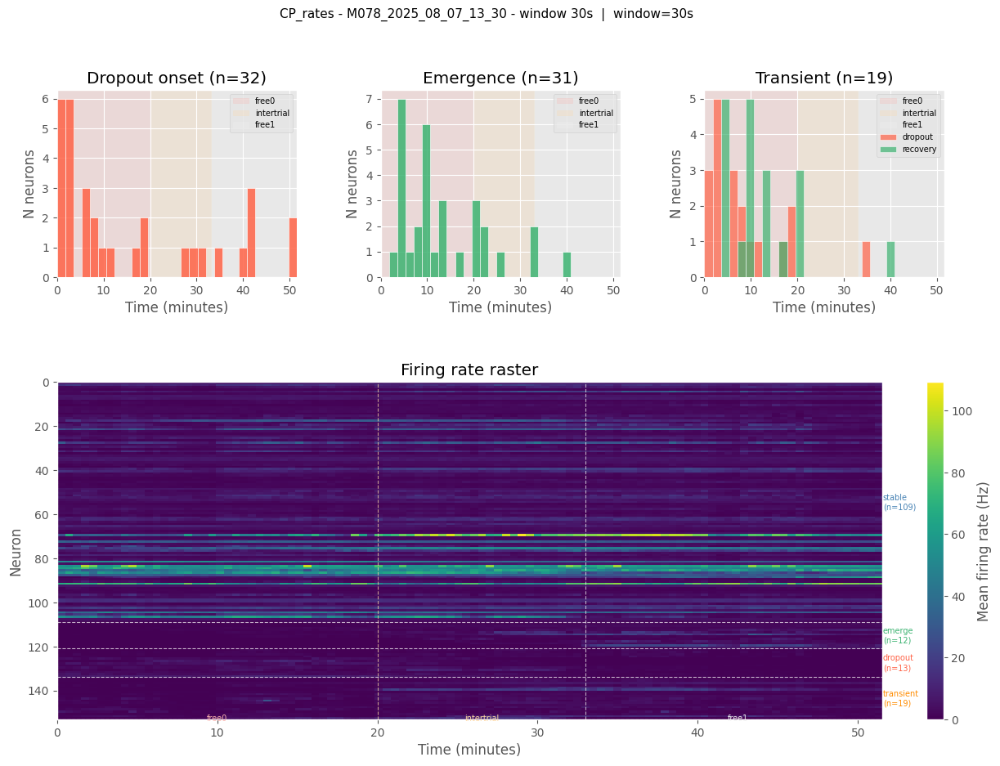

M078_2025_08_08_10_30
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 41999 in trial: free and id: 1000, inserting NaN.
Extending index to 41999 in trial: free and id: 1000, inserting NaN.


/data/miniconda3/envs/eq/lib/python3.10/site-packages/pyaldata/utils.py:155: UserWarning: hip_center might be a time-varying field. It matches the length of VAL_spikes on 99.9000999000999% of trials
  warnings.warn(
/data/miniconda3/envs/eq/lib/python3.10/site-packages/pyaldata/utils.py:155: UserWarning: left_ankle might be a time-varying field. It matches the length of VAL_spikes on 99.9000999000999% of trials
  warnings.warn(
/data/miniconda3/envs/eq/lib/python3.10/site-packages/pyaldata/utils.py:155: UserWarning: left_ankle_angle might be a time-varying field. It matches the length of VAL_spikes on 99.9000999000999% of trials
  warnings.warn(
/data/miniconda3/envs/eq/lib/python3.10/site-packages/pyaldata/utils.py:155: UserWarning: left_elbow might be a time-varying field. It matches the length of VAL_spikes on 99.9000999000999% of trials
  warnings.warn(
/data/miniconda3/envs/eq/lib/python3.10/site-packages/pyaldata/utils.py:155: UserWarning: left_elbow_angle might be a time-varying

Combined every 1 bins
Resulting VAL_spikes ephys data shape is (NxT): (191, 48000)
Resulting all_spikes ephys data shape is (NxT): (57, 48000)
Resulting SSp_spikes ephys data shape is (NxT): (20, 48000)
Resulting MOs_spikes ephys data shape is (NxT): (134, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (10, 48000)
Resulting CP_spikes ephys data shape is (NxT): (102, 48000)
 windows: 80 , bins per window: 3000, features: 10 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
stable       6
emerge       2
transient    1
dropout      1
Stable: 6 / 10


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


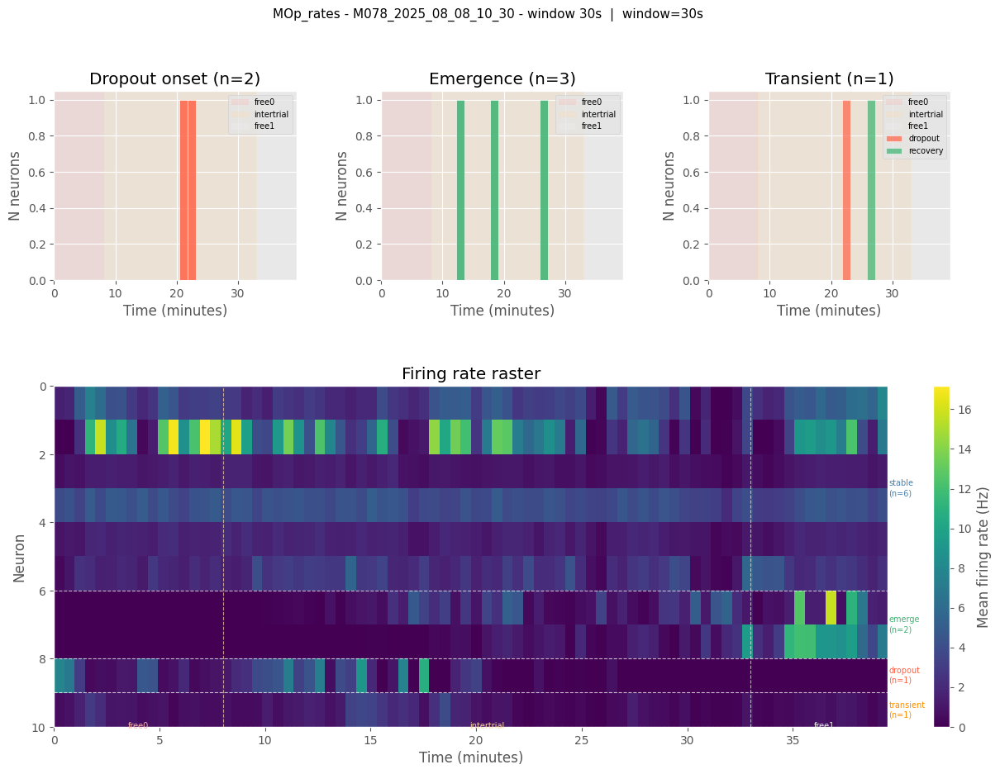

 windows: 80 , bins per window: 3000, features: 20 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
transient    11
stable        8
dropout       1
Stable: 8 / 20


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


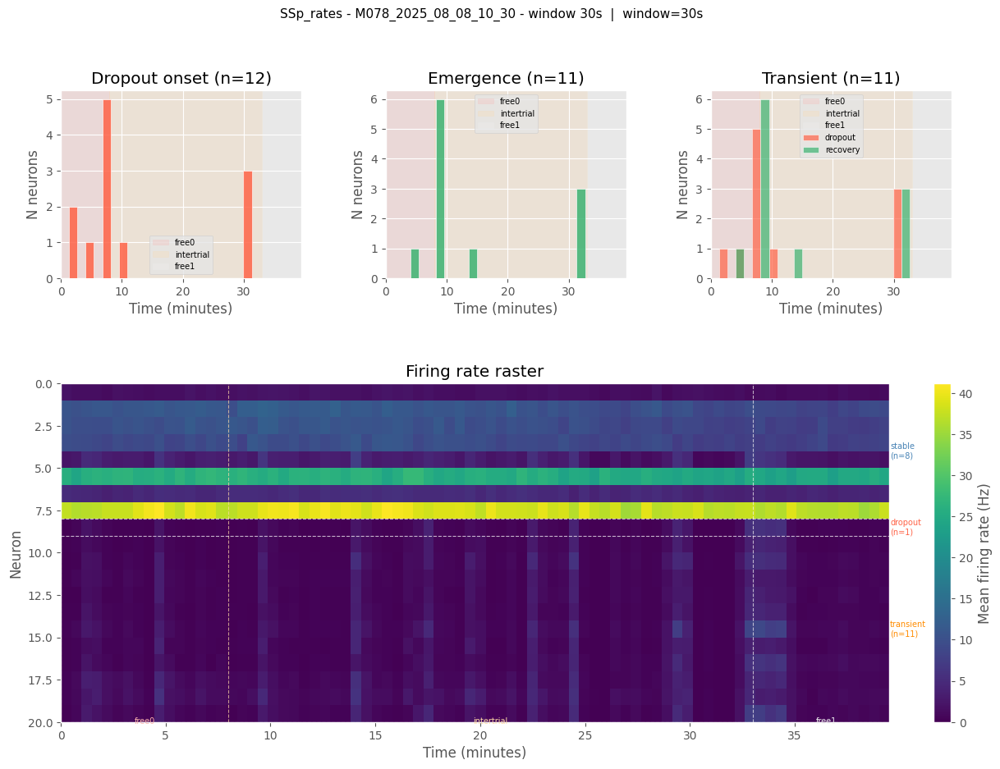

 windows: 80 , bins per window: 3000, features: 191 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
stable       162
transient     14
emerge        11
dropout        4
Stable: 162 / 191


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


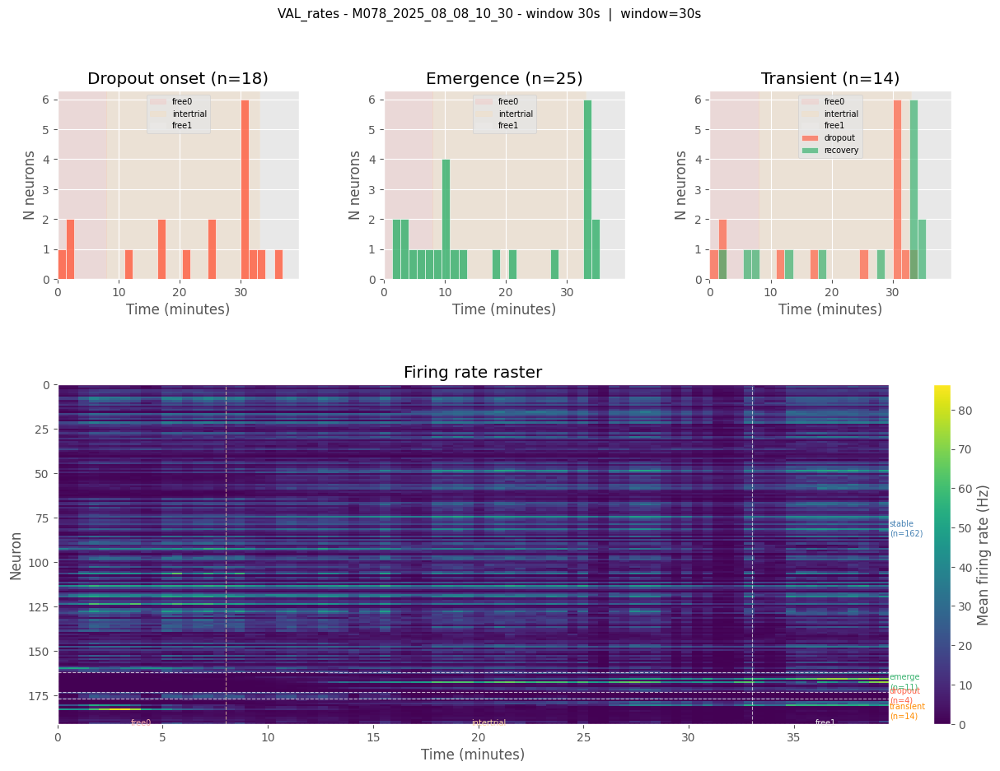

 windows: 80 , bins per window: 3000, features: 102 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
stable       69
transient    21
dropout       8
emerge        4
Stable: 69 / 102


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


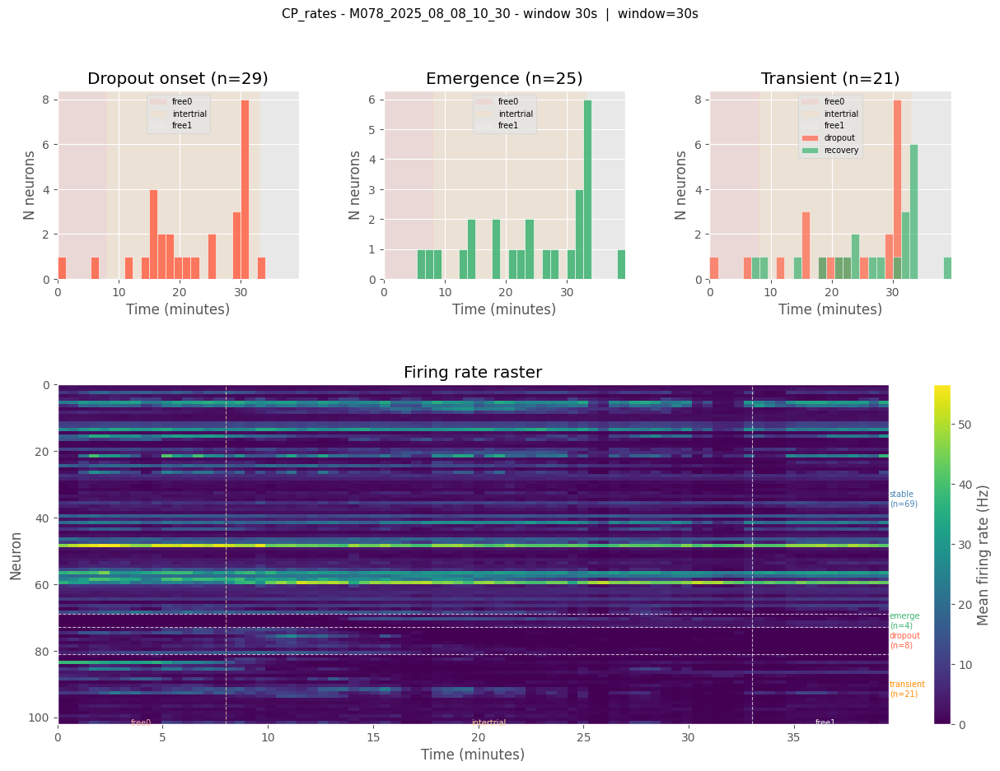

M086_2025_12_09_16_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 83999 in trial: free and id: 403, inserting NaN.
Extending index to 83999 in trial: free and id: 403, inserting NaN.
Combined every 1 bins
Resulting CP_spikes ephys data shape is (NxT): (200, 90000)
Resulting all_spikes ephys data shape is (NxT): (129, 90000)
Resulting MOp_spikes ephys data shape is (NxT): (158, 90000)
Resulting SSp_spikes ephys data shape is (NxT): (154, 90000)
Resulting VAL_spikes ephys data shape is (NxT): (131, 90000)
 windows: 77 , bins per window

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


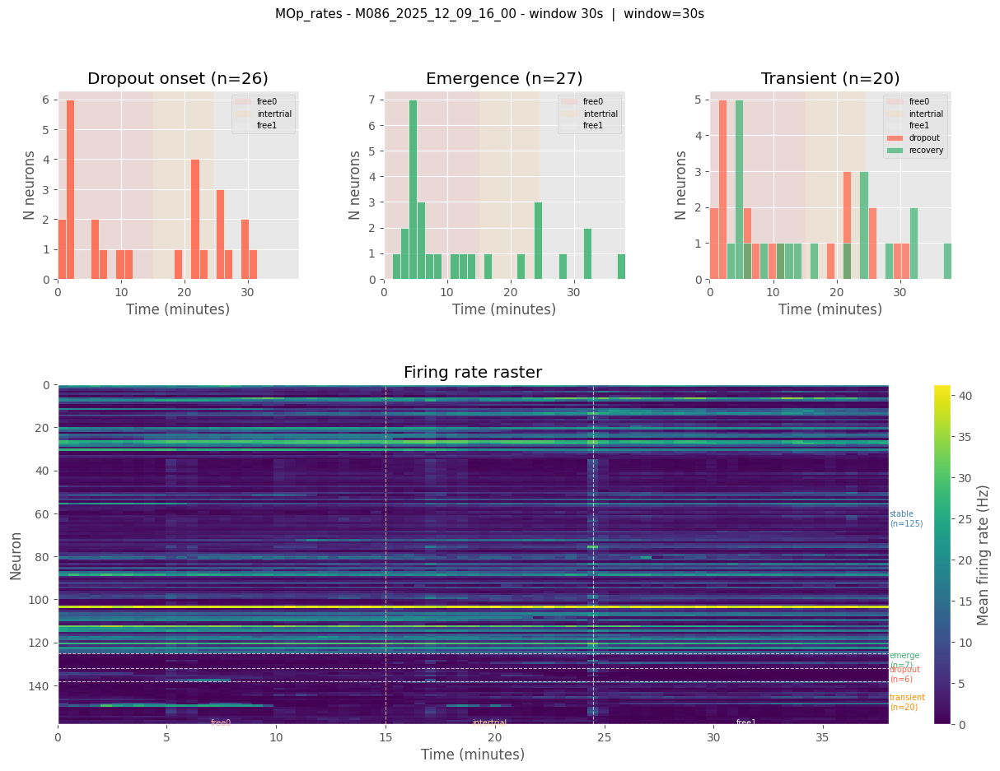

 windows: 77 , bins per window: 3000, features: 154 
trial_type
free0         30
free1         28
intertrial    19
Name: count, dtype: int64
type
stable       119
emerge        22
transient     11
dropout        2
Stable: 119 / 154


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


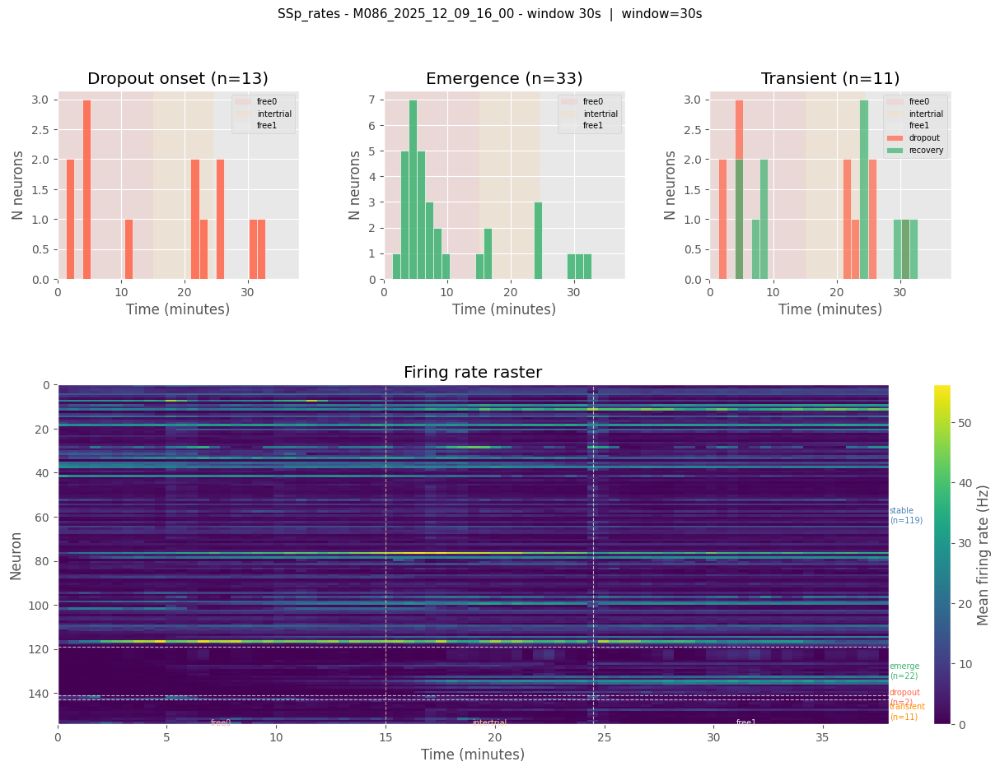

 windows: 77 , bins per window: 3000, features: 131 
trial_type
free0         30
free1         28
intertrial    19
Name: count, dtype: int64
type
stable       100
emerge        29
transient      2
Stable: 100 / 131


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


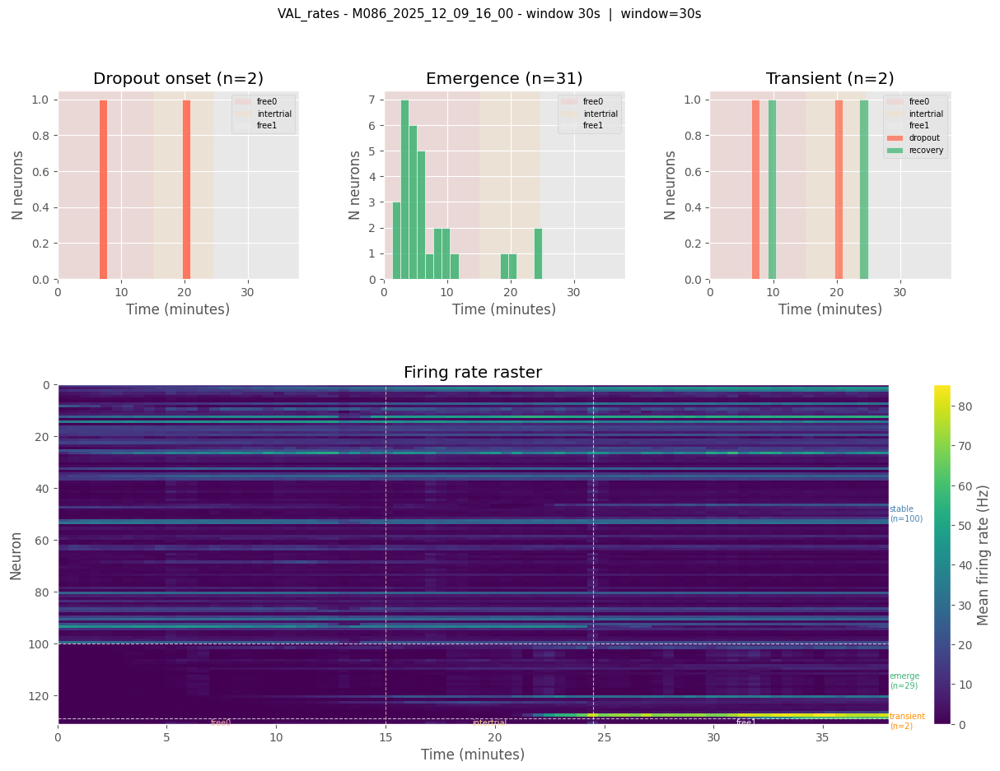

 windows: 77 , bins per window: 3000, features: 200 
trial_type
free0         30
free1         28
intertrial    19
Name: count, dtype: int64
type
stable       167
transient     17
emerge         9
dropout        7
Stable: 167 / 200


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


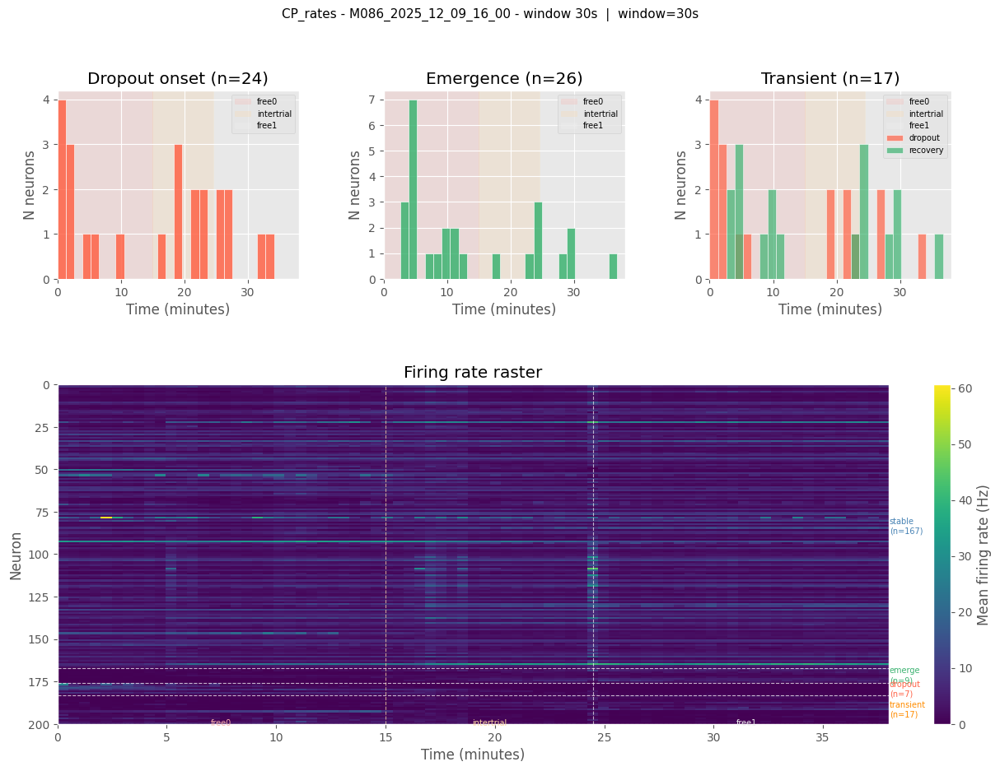

M086_2025_12_10_15_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 47999 in trial: free and id: 707, inserting NaN.
Extending index to 47999 in trial: free and id: 707, inserting NaN.
Combined every 1 bins
Resulting all_spikes ephys data shape is (NxT): (96, 48000)
Resulting CP_spikes ephys data shape is (NxT): (199, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (199, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (72, 48000)
Resulting SSp_spikes ephys data shape 

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


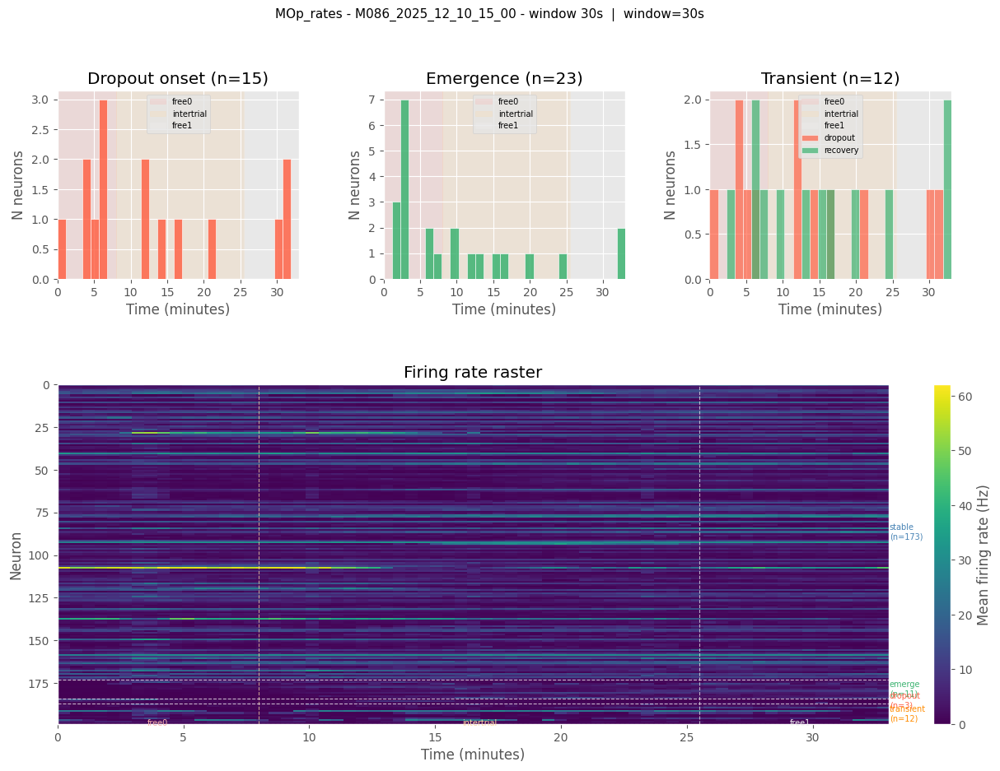

 windows: 67 , bins per window: 3000, features: 149 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       133
transient     10
emerge         4
dropout        2
Stable: 133 / 149


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


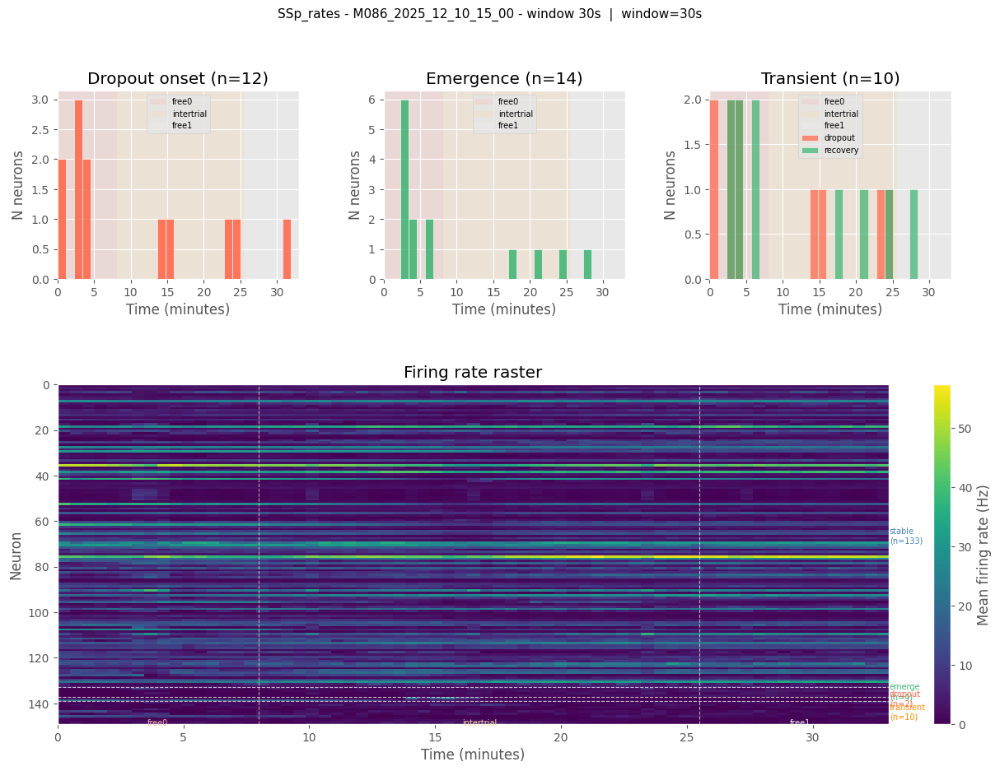

 windows: 67 , bins per window: 3000, features: 72 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable     61
dropout    10
emerge      1
Stable: 61 / 72


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


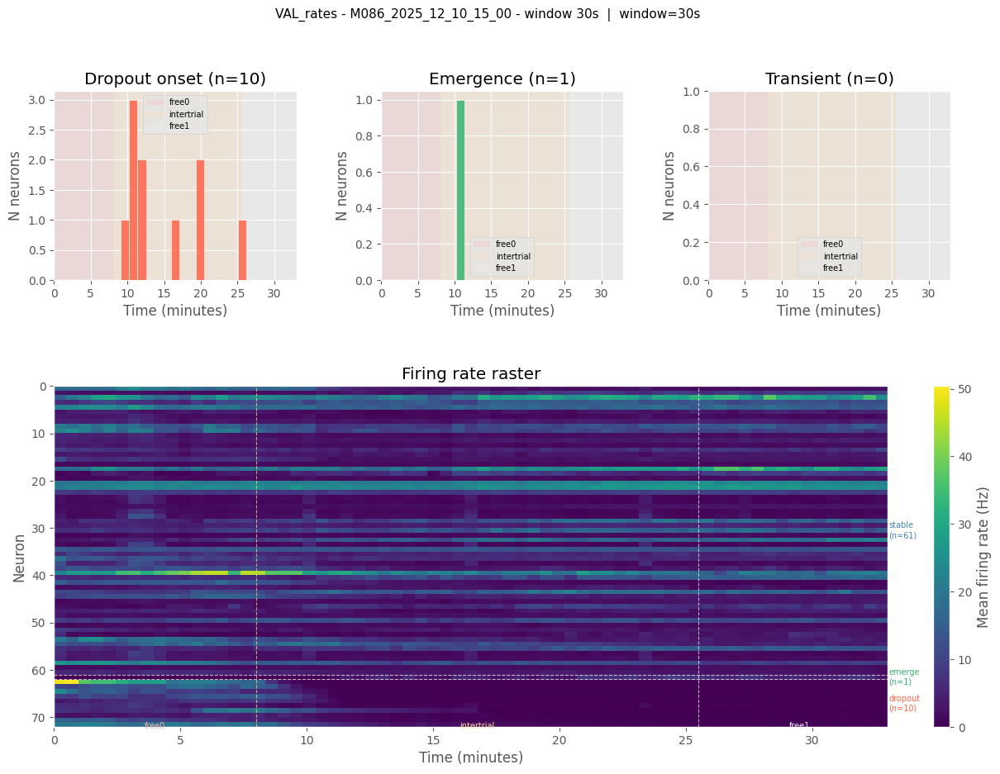

 windows: 67 , bins per window: 3000, features: 199 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       160
emerge        21
transient     10
dropout        8
Stable: 160 / 199


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


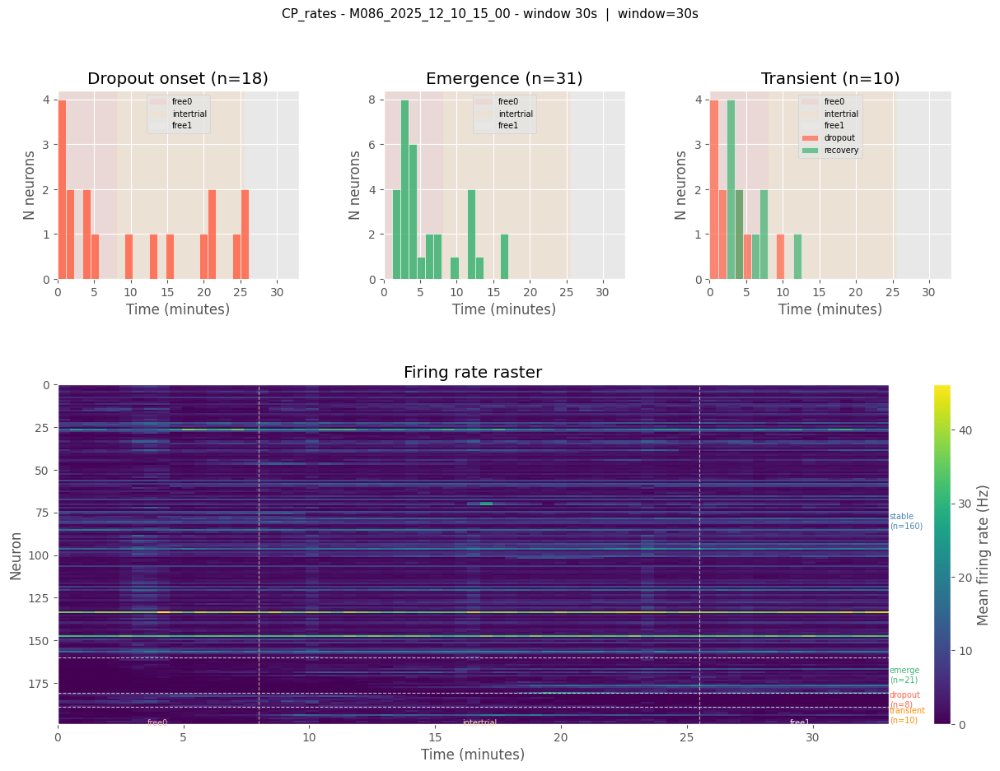

M086_2025_12_11_15_00M103_2026_02_17_14_00


UnboundLocalError: local variable 'full_df' referenced before assignment

In [32]:

window_size_s = 30
for session_idx in range(len(sessions)):
    prep_df = dt.load_sessions([sessions[session_idx]], prep=True, only_trials=False)[0]
    # prep_df = dt.add_no_mua_field(prep_df)

    prep_df_no_trials = pyal.select_trials(prep_df,"trial_name!='trial'" )

    for field in ["MOp_rates", "SSp_rates","VAL_rates","CP_rates"]:
        # Build windows by concatenating within each trial type (e.g., trial vs intertrial)
        meta_df, X = dt.build_window_tensor_concat_by_trial_type(
            prep_df_no_trials,
            window_size_s=window_size_s,
            field=field,
            trial_type_col="trial_name",   # your type column
            bin_size_col="bin_size",
        )
        print(f" windows: {X.shape[0]} , bins per window: {X.shape[1]}, features: {X.shape[2]} ")
        print(meta_df["trial_type"].value_counts())
        meta_df = meta_df.reset_index(drop=True)

        # Choose device
        device = "cuda" if torch.cuda.is_available() else "cpu"
        X = X.to(device)


        df_silent = detect_silent_neurons(
            X=X,                        # (nW, w, N) already on device or cpu
            threshold=0.5,
            window_size_s=window_size_s,
            min_silent_s=120.0,
        )

        # Stable neuron mask
        stable_mask = df_silent["type"] == "stable"
        print(f"Stable: {stable_mask.sum()} / {len(stable_mask)}")

        # Apply to X
        # X_stable = X[:, :, stable_mask.values]
        # plot_transition_times(
        #     df_silent=df_silent,
        #     window_size_s=window_size_s,
        #     meta_df=meta_df,
        #     title =f"{sessions[session_idx]} - {field} - window {window_size_s}s"
        # )
        plot_transition_times(
            df_silent=df_silent,
            X=X,
            window_size_s=window_size_s,
            meta_df=meta_df,
            title = f"{field} - {sessions[session_idx]} - window {window_size_s}s"
        )


M103_2026_02_17_14_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 47999 in trial: free and id: 693, inserting NaN.
Extending index to 47999 in trial: free and id: 693, inserting NaN.
Combined every 1 bins
Resulting all_spikes ephys data shape is (NxT): (8, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (185, 48000)
Resulting CP_spikes ephys data shape is (NxT): (283, 48000)
Resulting SSp_spikes ephys data shape is (NxT): (99, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (235, 48000)
 windows: 68 , bins per window: 3

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


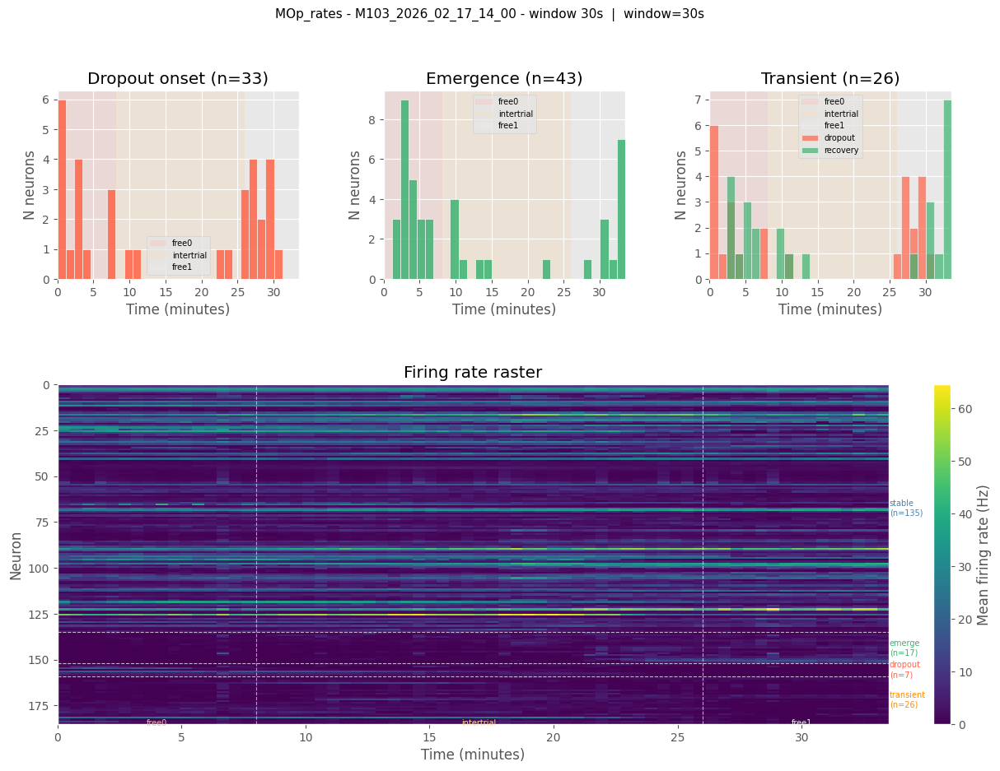

 windows: 68 , bins per window: 3000, features: 99 
trial_type
intertrial    36
free0         16
free1         16
Name: count, dtype: int64
type
stable       82
dropout       8
transient     6
emerge        3
Stable: 82 / 99


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


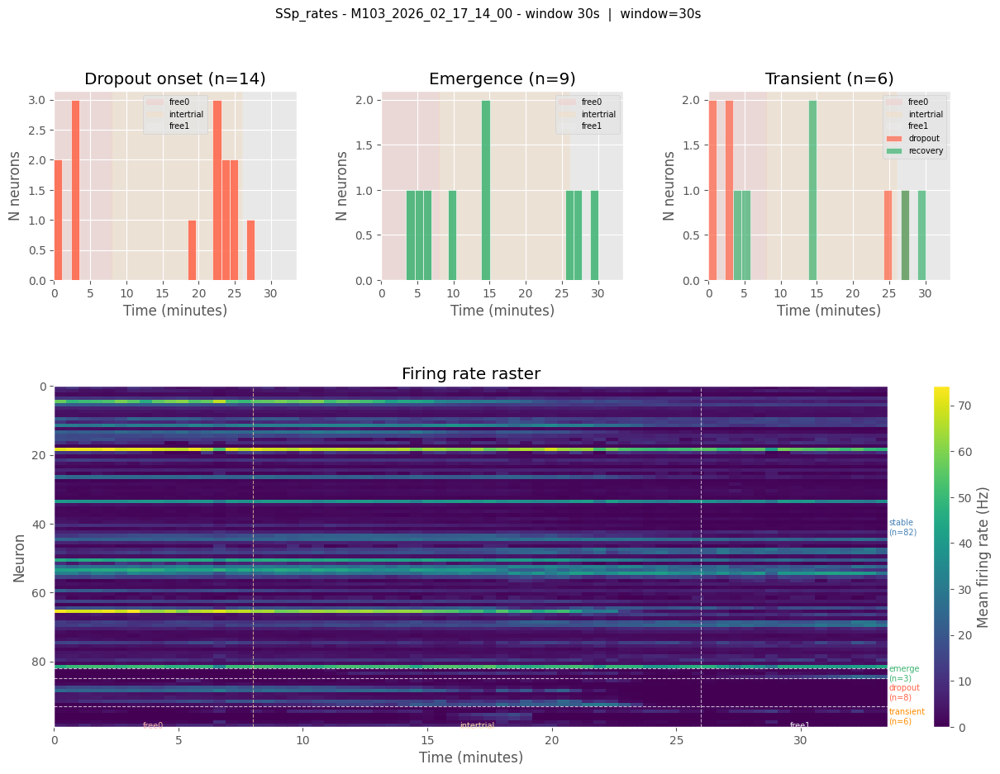

 windows: 68 , bins per window: 3000, features: 235 
trial_type
intertrial    36
free0         16
free1         16
Name: count, dtype: int64
type
stable       179
dropout       24
transient     21
emerge        11
Stable: 179 / 235


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


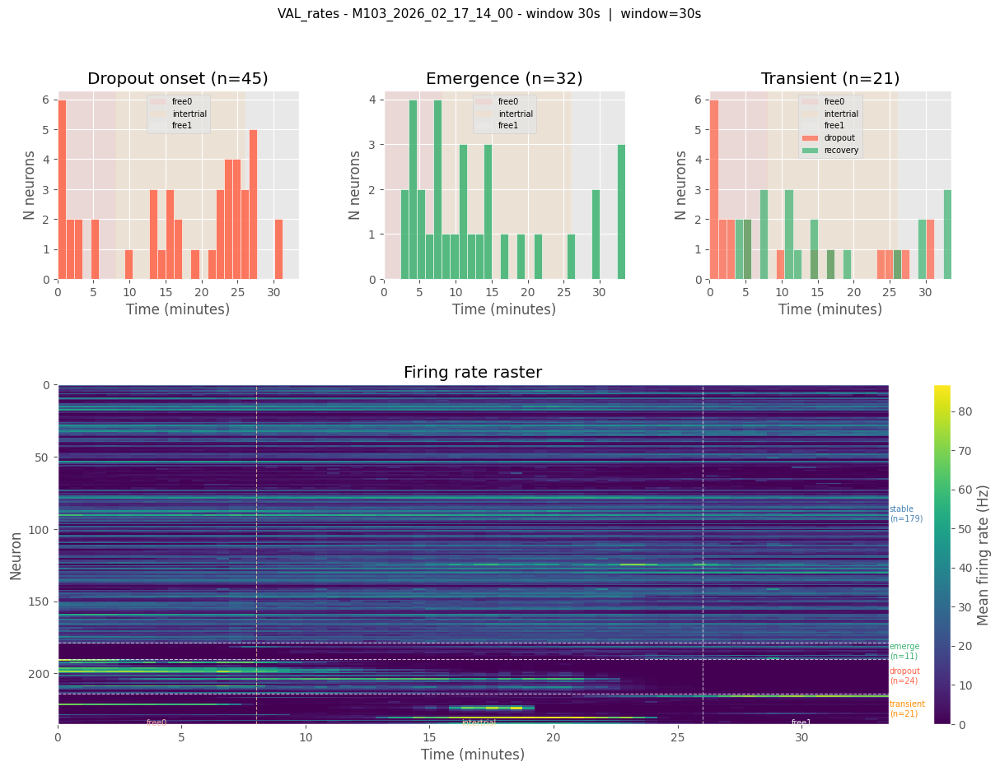

 windows: 68 , bins per window: 3000, features: 283 
trial_type
intertrial    36
free0         16
free1         16
Name: count, dtype: int64
type
stable       165
emerge        66
transient     27
dropout       25
Stable: 165 / 283


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


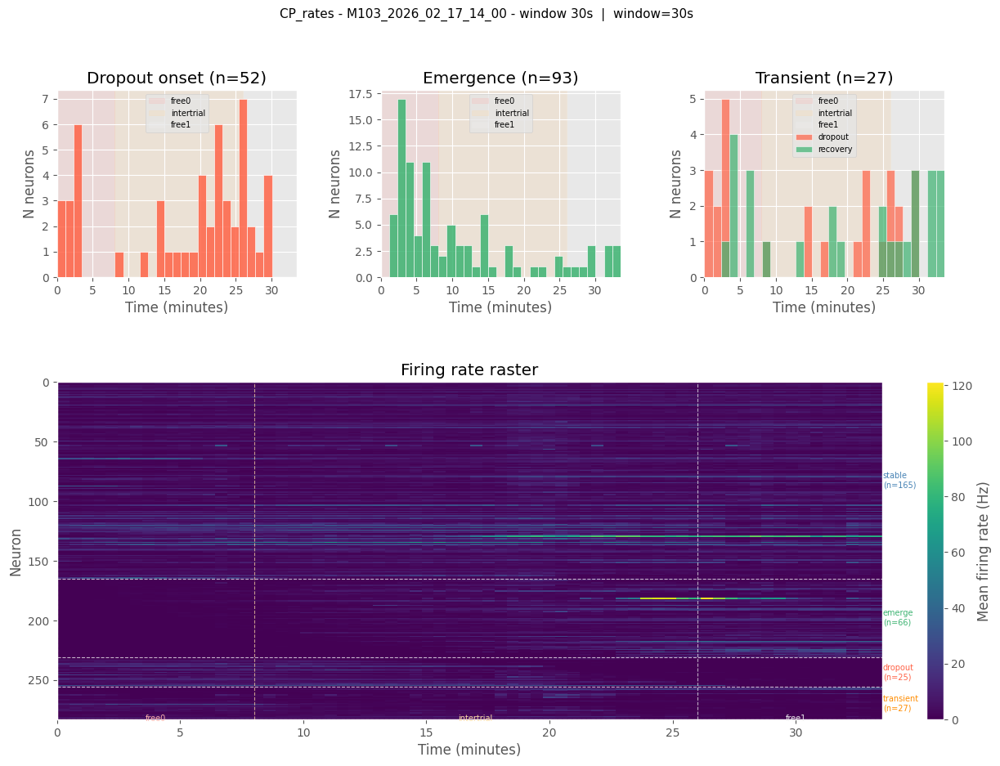

M103_2026_02_17_14_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 47999 in trial: free and id: 693, inserting NaN.
Extending index to 47999 in trial: free and id: 693, inserting NaN.
Combined every 1 bins
Resulting all_spikes ephys data shape is (NxT): (8, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (185, 48000)
Resulting CP_spikes ephys data shape is (NxT): (283, 48000)
Resulting SSp_spikes ephys data shape is (NxT): (99, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (235, 48000)
 windows: 68 , bins per window: 3

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


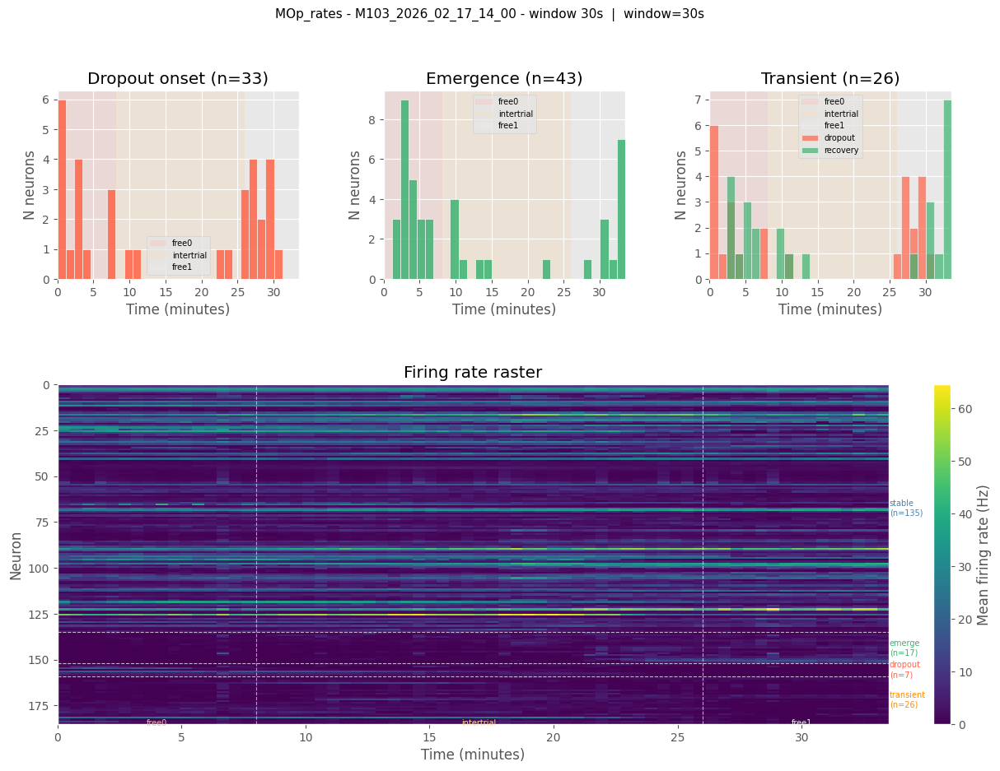

 windows: 68 , bins per window: 3000, features: 99 
trial_type
intertrial    36
free0         16
free1         16
Name: count, dtype: int64
type
stable       82
dropout       8
transient     6
emerge        3
Stable: 82 / 99


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


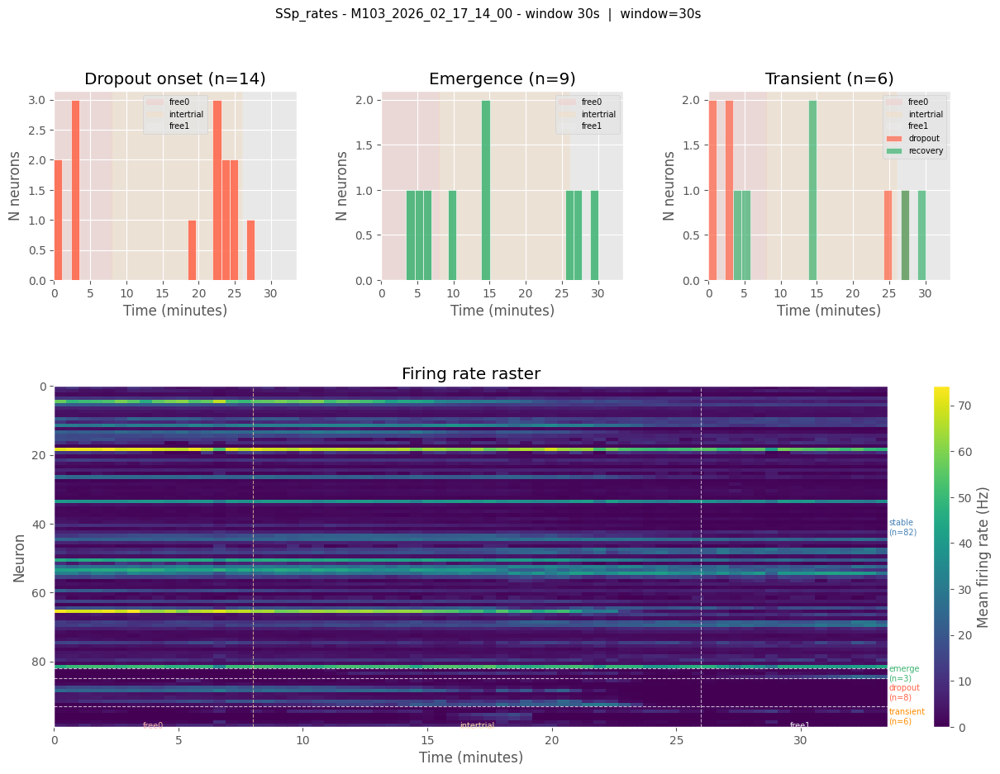

 windows: 68 , bins per window: 3000, features: 235 
trial_type
intertrial    36
free0         16
free1         16
Name: count, dtype: int64
type
stable       179
dropout       24
transient     21
emerge        11
Stable: 179 / 235


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


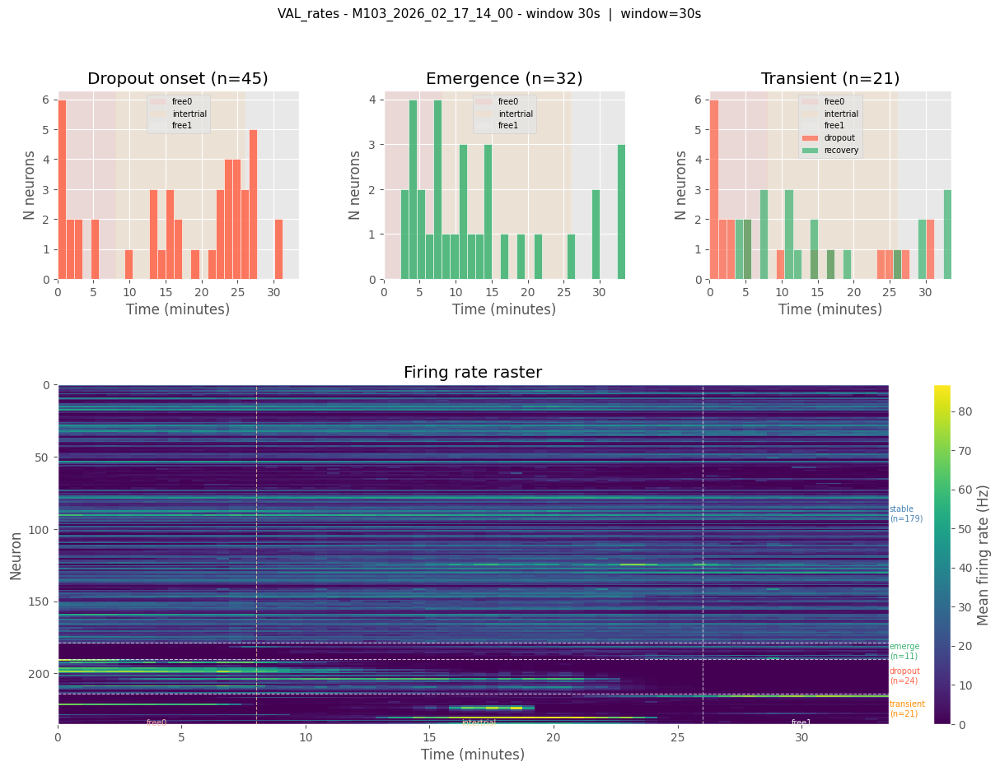

 windows: 68 , bins per window: 3000, features: 283 
trial_type
intertrial    36
free0         16
free1         16
Name: count, dtype: int64
type
stable       165
emerge        66
transient     27
dropout       25
Stable: 165 / 283


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


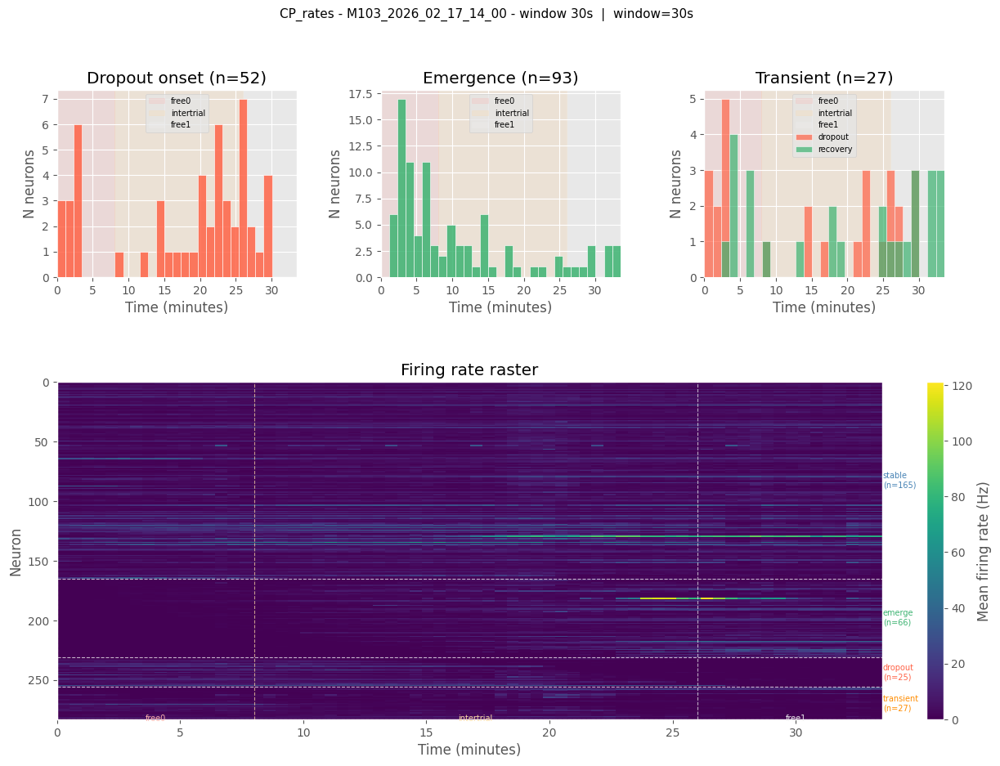

M103_2026_02_18_15_30
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_duration', 'values_Sol_direction'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_duration', 'idx_Sol_duration', 'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_duration', 'values_Sol_direction'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_duration', 'idx_Sol_duration', 'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 41999 in trial: free and id: 996, inserting NaN.
Extending index to 41999 in trial: free and id: 996, inserting NaN.
Combined every 1 bins
Resulting all_spikes ephys data shape is (NxT): (15, 48000)
Resulting CP_spikes ephys data shape is (NxT): (267, 48000)
Resulting MOp_spikes ephys data shape is

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


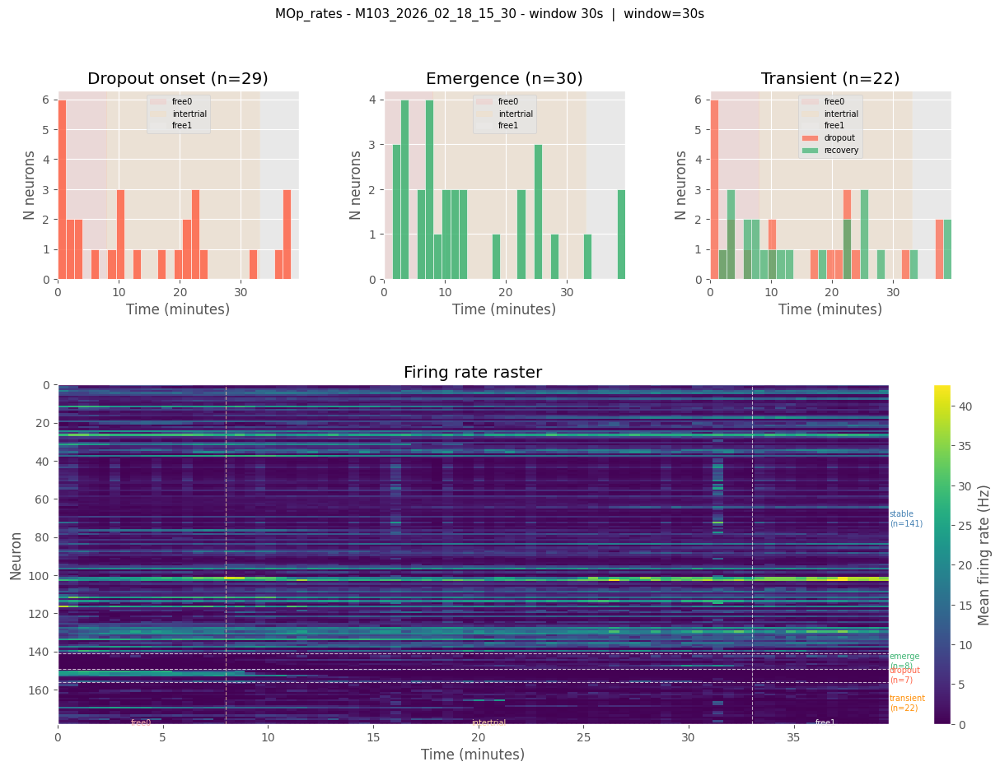

 windows: 80 , bins per window: 3000, features: 126 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
stable       116
transient      7
dropout        2
emerge         1
Stable: 116 / 126


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


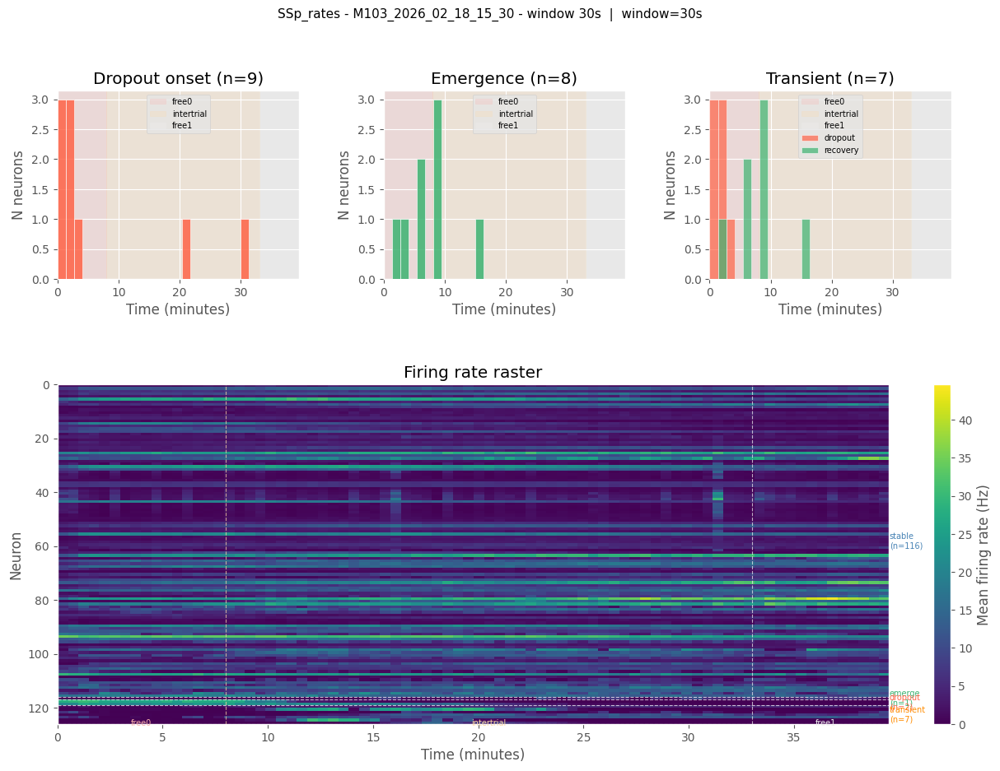

 windows: 80 , bins per window: 3000, features: 190 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
stable       157
dropout       16
transient     13
emerge         4
Stable: 157 / 190


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


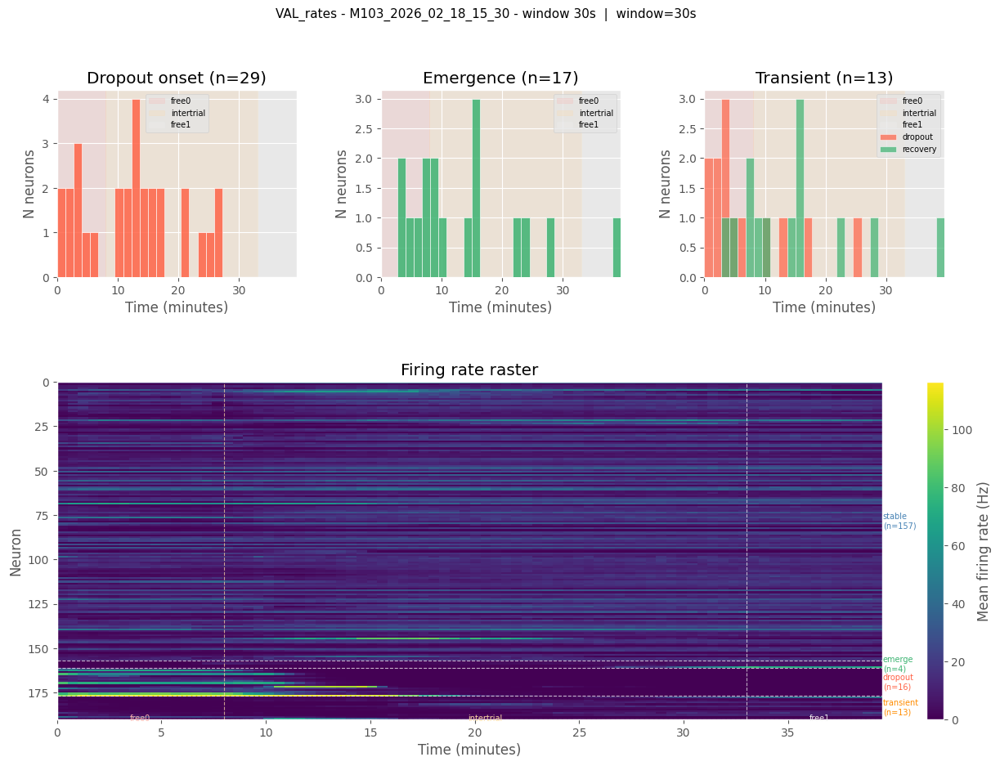

 windows: 80 , bins per window: 3000, features: 267 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
stable       161
emerge        59
transient     24
dropout       23
Stable: 161 / 267


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


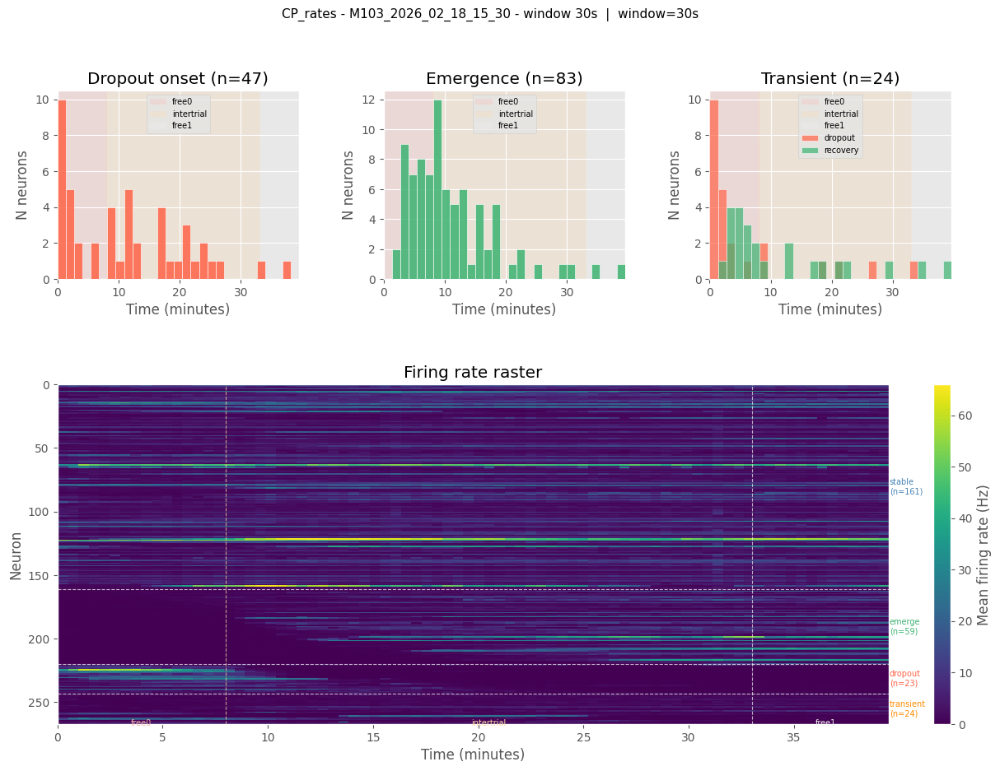

M103_2026_02_19_15_30
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 113999 in trial: free and id: 535, inserting NaN.
Extending index to 113999 in trial: free and id: 535, inserting NaN.
Combined every 1 bins
Resulting CP_spikes ephys data shape is (NxT): (176, 120000)
Resulting all_spikes ephys data shape is (NxT): (9, 120000)
Resulting MOp_spikes ephys data shape is (NxT): (141, 120000)
Resulting SSp_spikes ephys data shape is (NxT): (92, 120000)
Resulting VAL_spikes ephys data shape is (NxT): (229, 120000)
 windows: 104 , bins per w

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


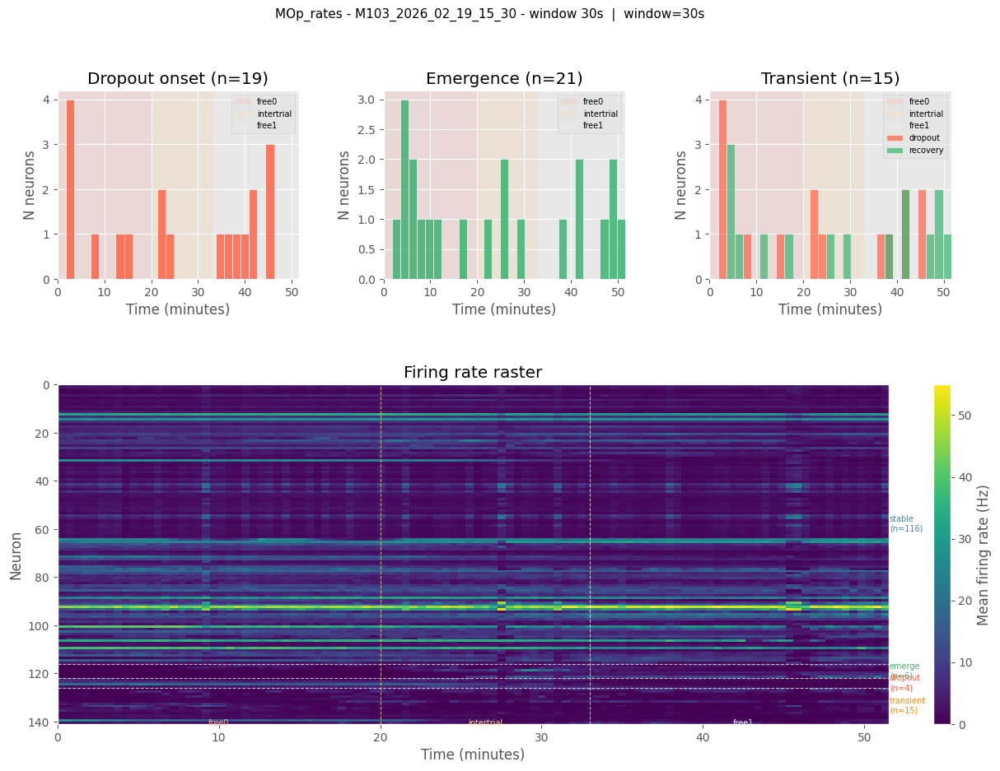

 windows: 104 , bins per window: 3000, features: 92 
trial_type
free0         40
free1         38
intertrial    26
Name: count, dtype: int64
type
stable       67
emerge       18
transient     6
dropout       1
Stable: 67 / 92


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


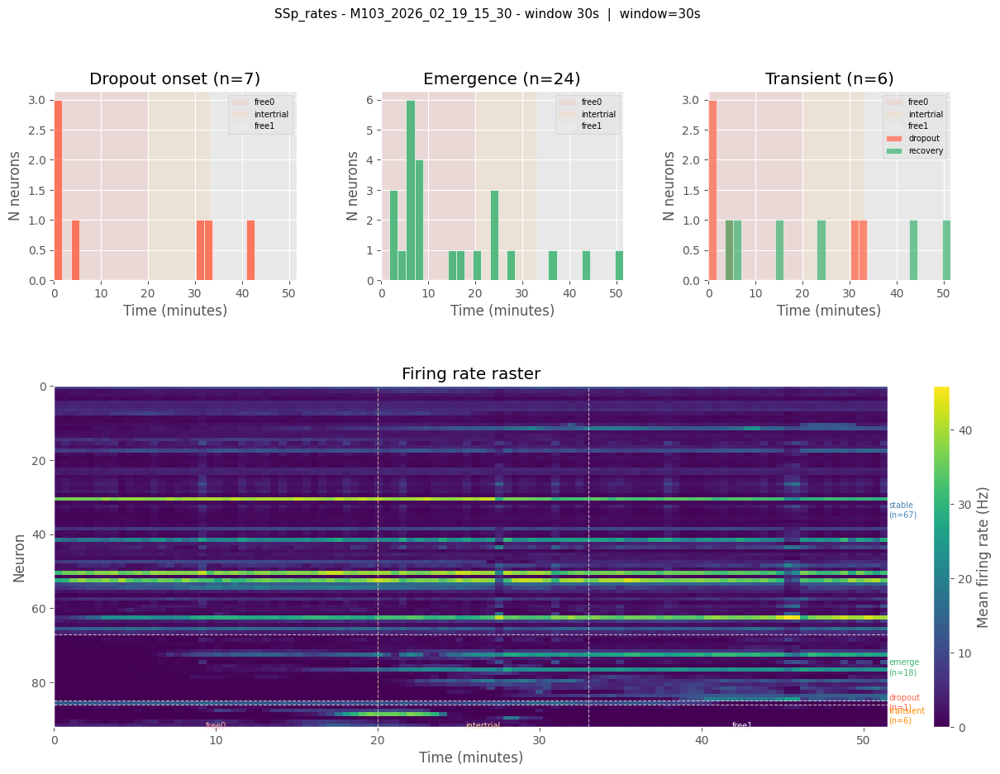

 windows: 104 , bins per window: 3000, features: 229 
trial_type
free0         40
free1         38
intertrial    26
Name: count, dtype: int64
type
stable       174
emerge        24
transient     21
dropout       10
Stable: 174 / 229


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


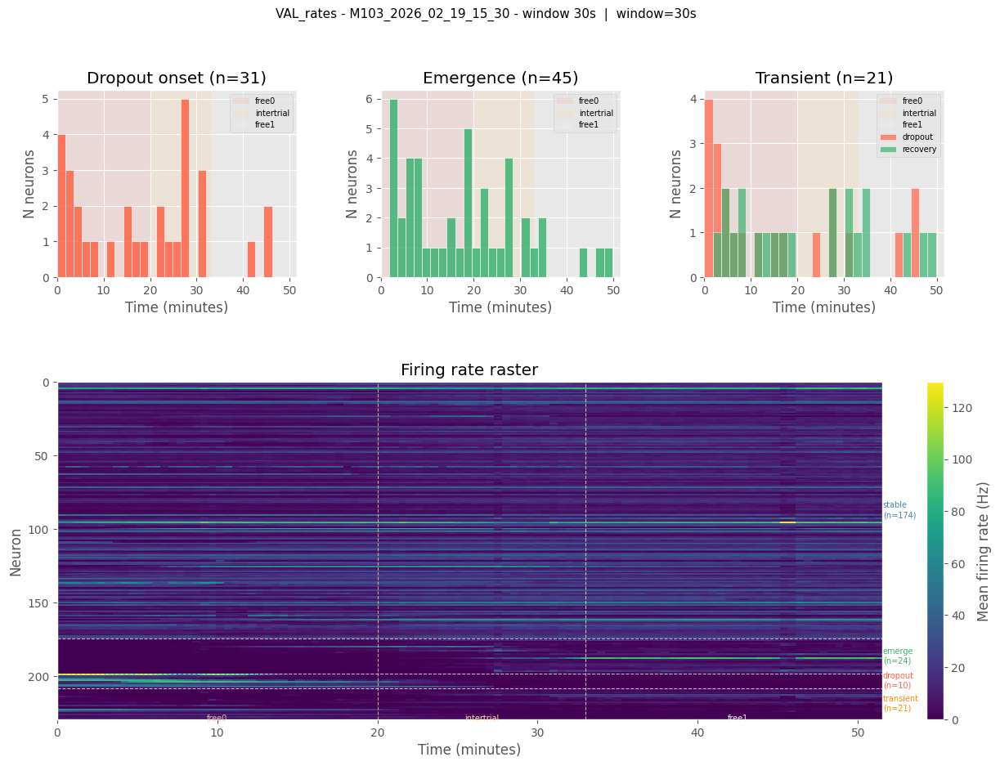

 windows: 104 , bins per window: 3000, features: 176 
trial_type
free0         40
free1         38
intertrial    26
Name: count, dtype: int64
type
stable       111
emerge        39
transient     23
dropout        3
Stable: 111 / 176


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


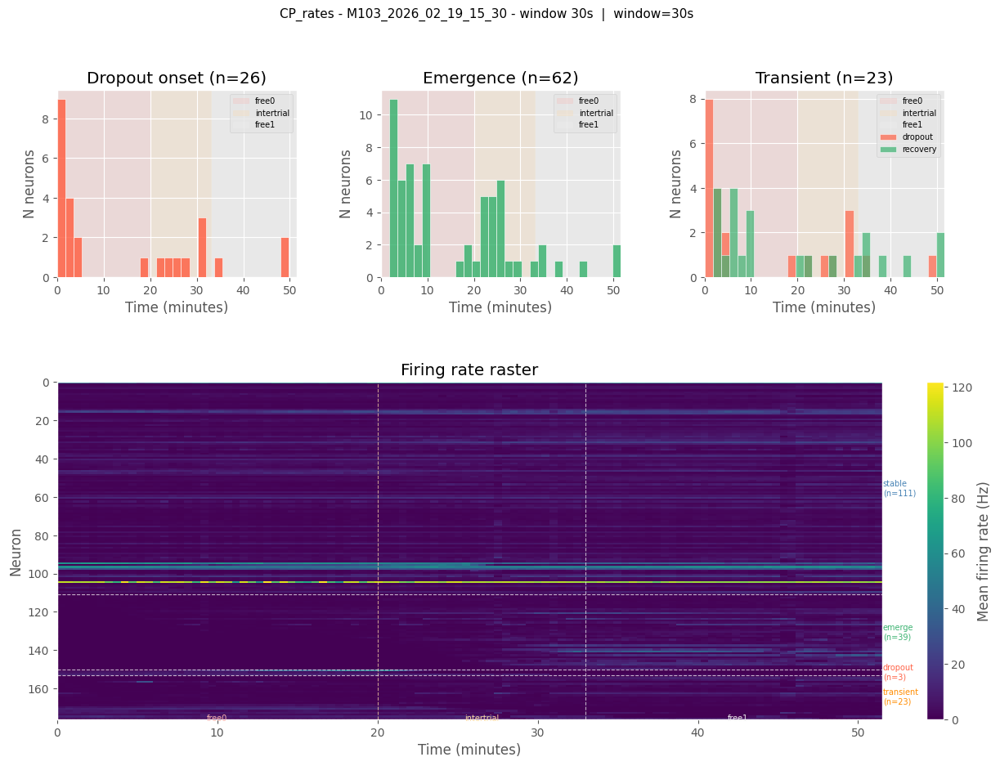

M103_2026_02_20_16_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 41999 in trial: free and id: 1002, inserting NaN.
Extending index to 41999 in trial: free and id: 1002, inserting NaN.
Combined every 1 bins
Resulting CP_spikes ephys data shape is (NxT): (136, 48000)
Resulting all_spikes ephys data shape is (NxT): (18, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (65, 48000)
Resulting SSp_spikes ephys data shape is (NxT): (43, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (164, 48000)
 windows: 79 , bins per window: 3000, features: 65 
trial_type
intertrial    49
free0 

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


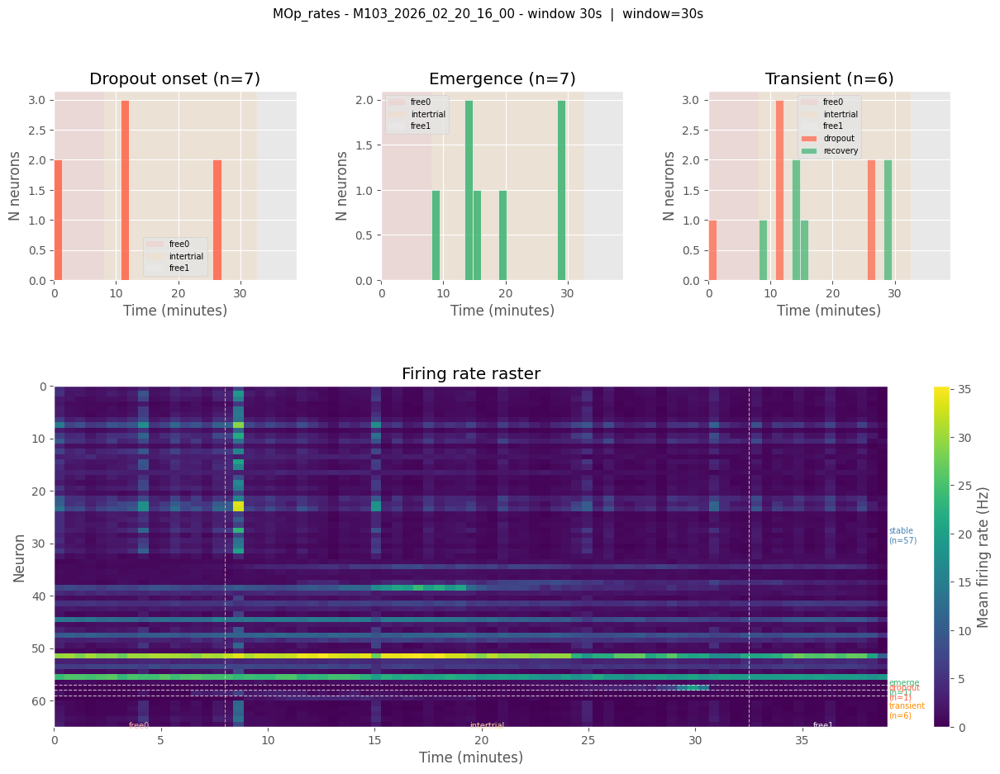

 windows: 79 , bins per window: 3000, features: 43 
trial_type
intertrial    49
free0         16
free1         14
Name: count, dtype: int64
type
stable       33
transient     8
dropout       1
emerge        1
Stable: 33 / 43


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


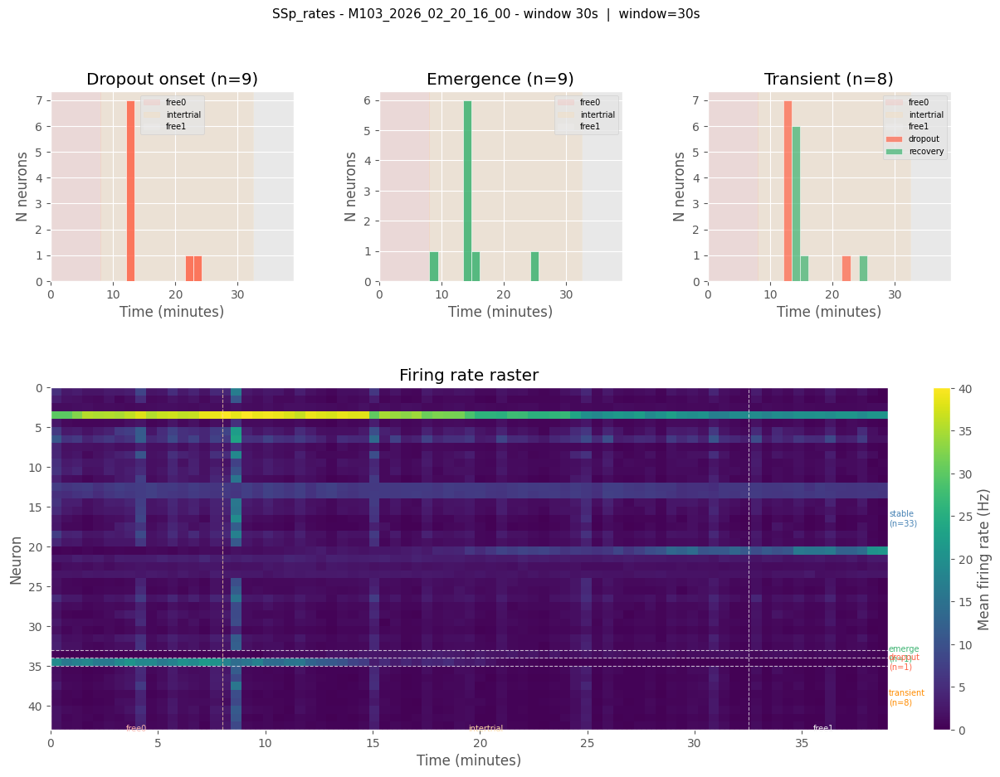

 windows: 79 , bins per window: 3000, features: 164 
trial_type
intertrial    49
free0         16
free1         14
Name: count, dtype: int64
type
stable       123
transient     15
dropout       13
emerge        13
Stable: 123 / 164


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


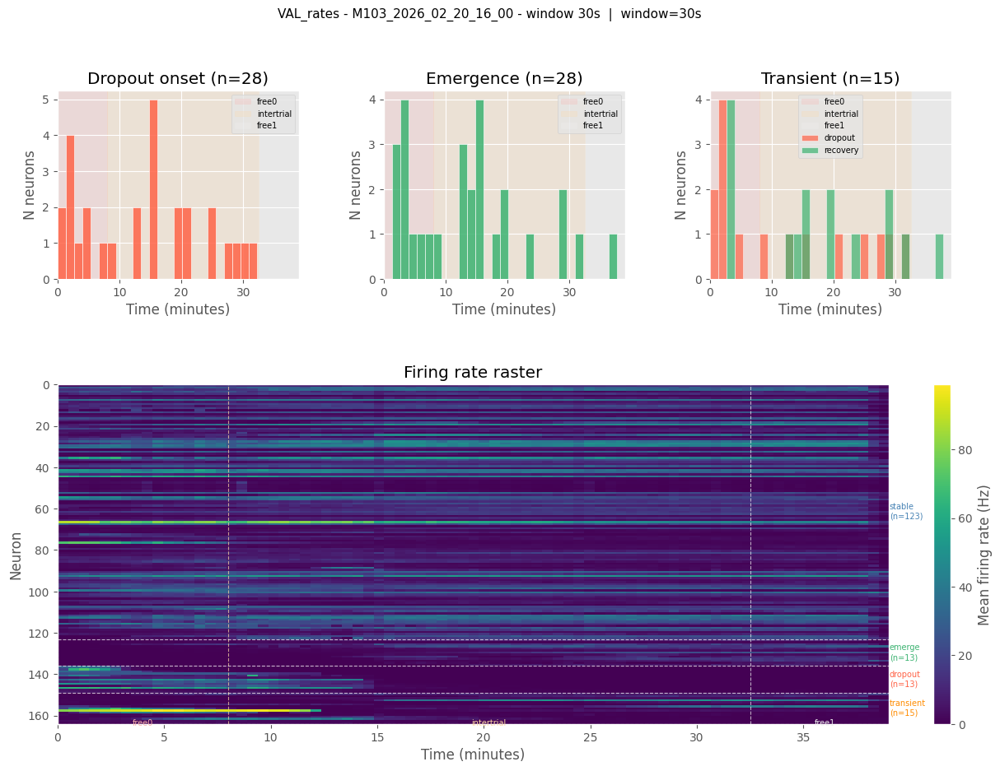

 windows: 79 , bins per window: 3000, features: 136 
trial_type
intertrial    49
free0         16
free1         14
Name: count, dtype: int64
type
stable       108
dropout       10
emerge        10
transient      8
Stable: 108 / 136


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


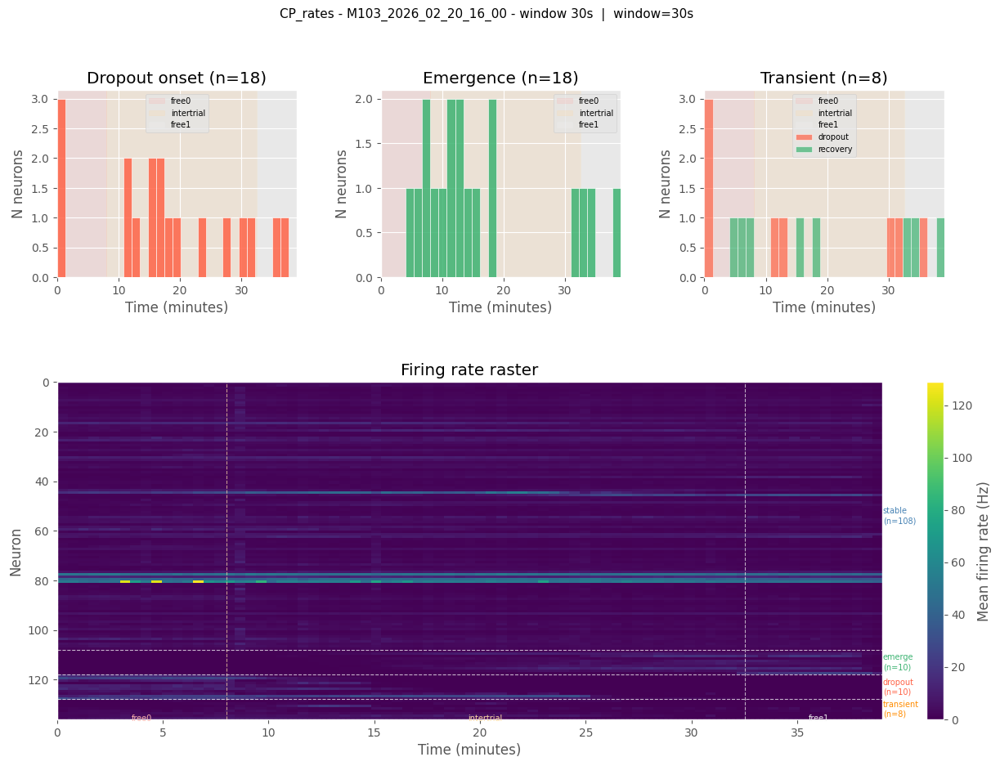

M106_2026_02_24_15_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 47999 in trial: free and id: 709, inserting NaN.
Extending index to 47999 in trial: free and id: 709, inserting NaN.


/data/miniconda3/envs/eq/lib/python3.10/site-packages/pyaldata/utils.py:155: UserWarning: hip_center might be a time-varying field. It matches the length of CP_spikes on 99.85915492957747% of trials
  warnings.warn(
/data/miniconda3/envs/eq/lib/python3.10/site-packages/pyaldata/utils.py:155: UserWarning: left_ankle might be a time-varying field. It matches the length of CP_spikes on 99.85915492957747% of trials
  warnings.warn(
/data/miniconda3/envs/eq/lib/python3.10/site-packages/pyaldata/utils.py:155: UserWarning: left_ankle_angle might be a time-varying field. It matches the length of CP_spikes on 99.85915492957747% of trials
  warnings.warn(
/data/miniconda3/envs/eq/lib/python3.10/site-packages/pyaldata/utils.py:155: UserWarning: left_elbow might be a time-varying field. It matches the length of CP_spikes on 99.85915492957747% of trials
  warnings.warn(
/data/miniconda3/envs/eq/lib/python3.10/site-packages/pyaldata/utils.py:155: UserWarning: left_elbow_angle might be a time-varying

Combined every 1 bins
Resulting CP_spikes ephys data shape is (NxT): (237, 48000)
Resulting all_spikes ephys data shape is (NxT): (10, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (160, 48000)
Resulting SSp_spikes ephys data shape is (NxT): (171, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (176, 48000)
 windows: 67 , bins per window: 3000, features: 160 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       135
transient     11
emerge        10
dropout        4
Stable: 135 / 160


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


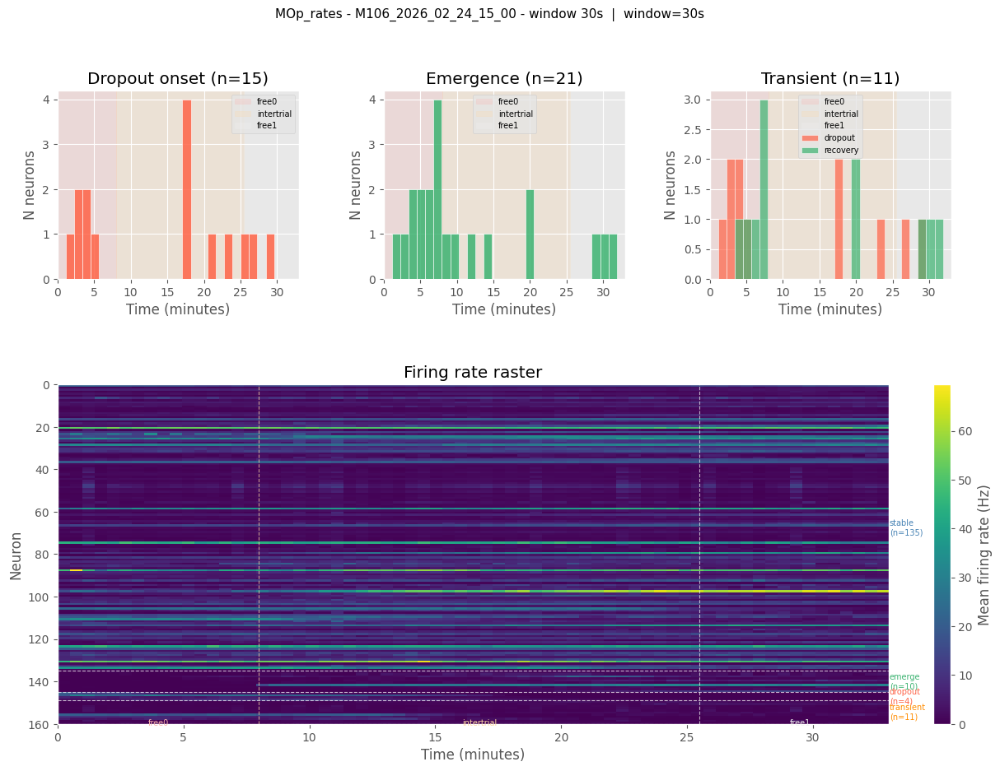

 windows: 67 , bins per window: 3000, features: 171 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       136
dropout       25
emerge         5
transient      5
Stable: 136 / 171


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


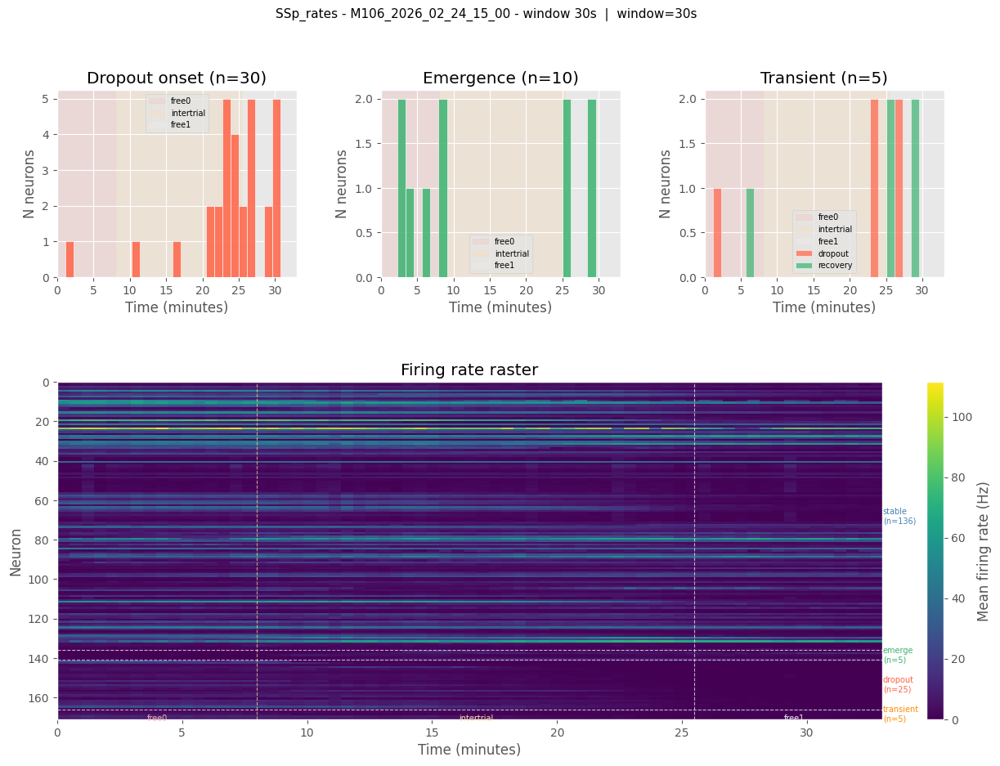

 windows: 67 , bins per window: 3000, features: 176 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       154
emerge        19
transient      3
Stable: 154 / 176


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


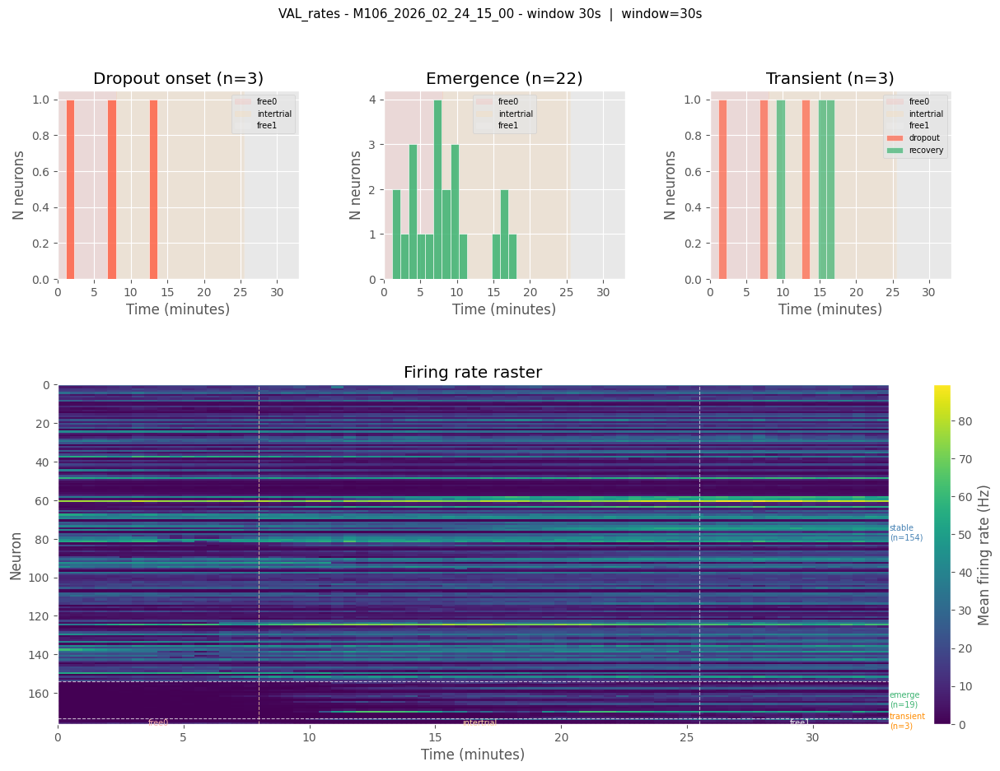

 windows: 67 , bins per window: 3000, features: 237 
trial_type
intertrial    35
free0         16
free1         16
Name: count, dtype: int64
type
stable       161
emerge        52
transient     19
dropout        5
Stable: 161 / 237


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


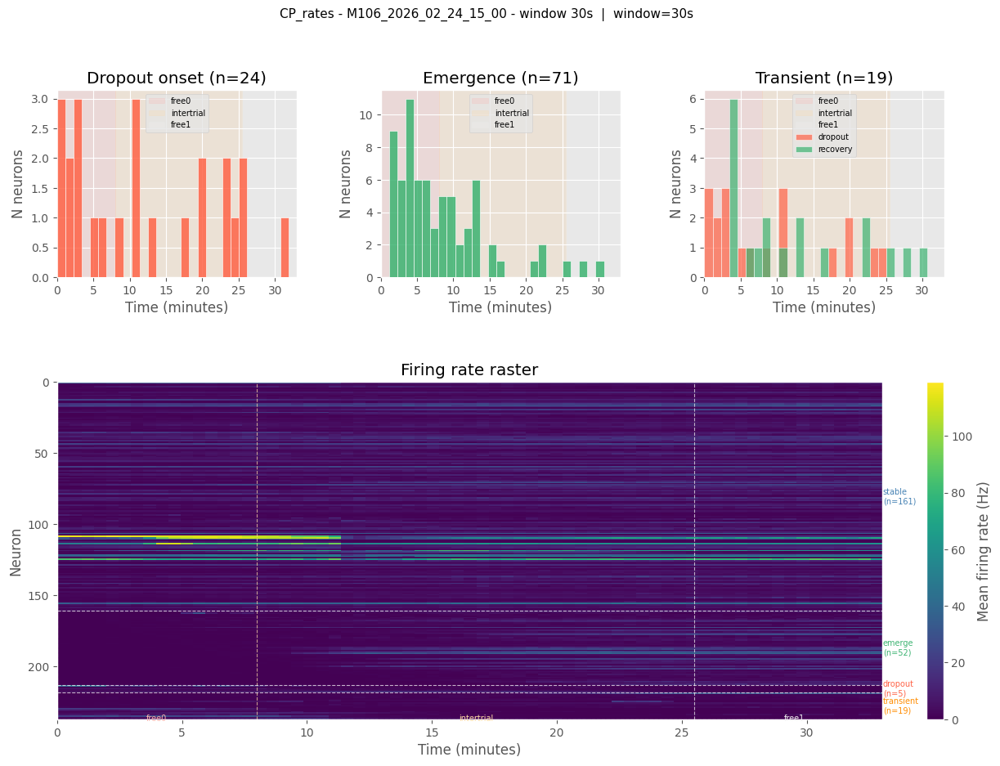

M106_2026_02_25_15_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_duration', 'values_Sol_direction'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_duration', 'idx_Sol_duration', 'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_duration', 'idx_Sol_duration', 'values_Sol_direction', 'idx_Sol_direction', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 41999 in trial: free and id: 1001, inserting NaN.
Extending index to 41999 in trial: free and id: 1001, inserting NaN.
Combined every 1 bins
Resulting CP_spikes ephys data shape is (NxT): (206, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (156, 48000)
Resulting all_spikes ephys data shape is (NxT): (11, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (132, 48000)
Resulting SSp_spikes ephys data sha

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


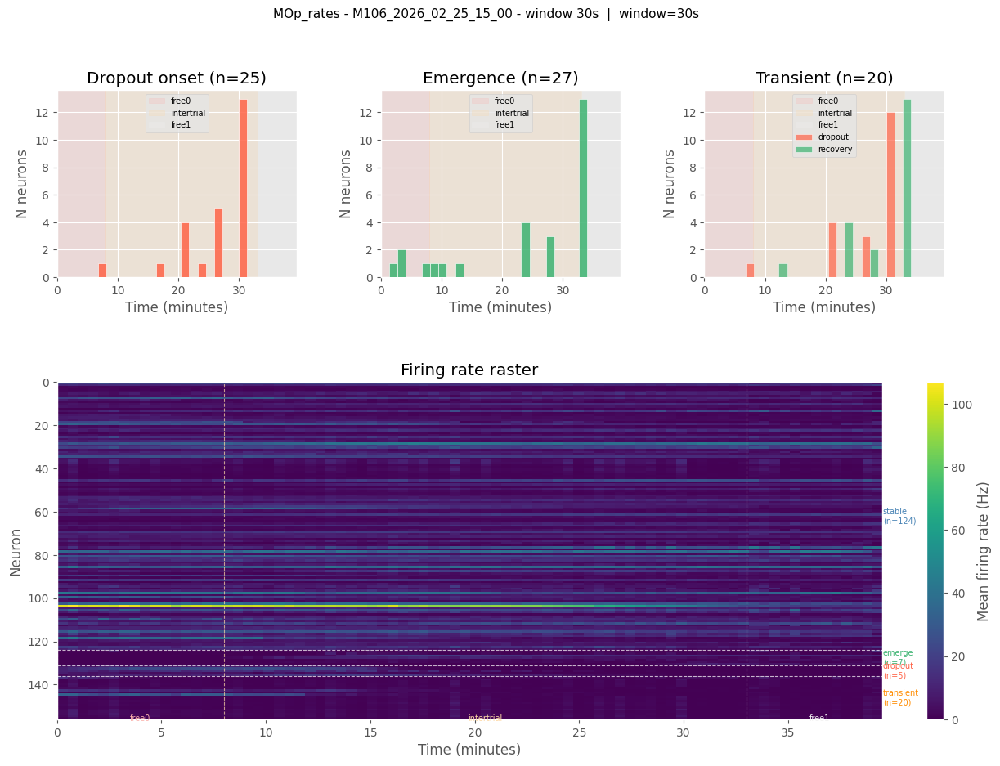

 windows: 80 , bins per window: 3000, features: 142 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
stable       109
emerge        13
transient     12
dropout        8
Stable: 109 / 142


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


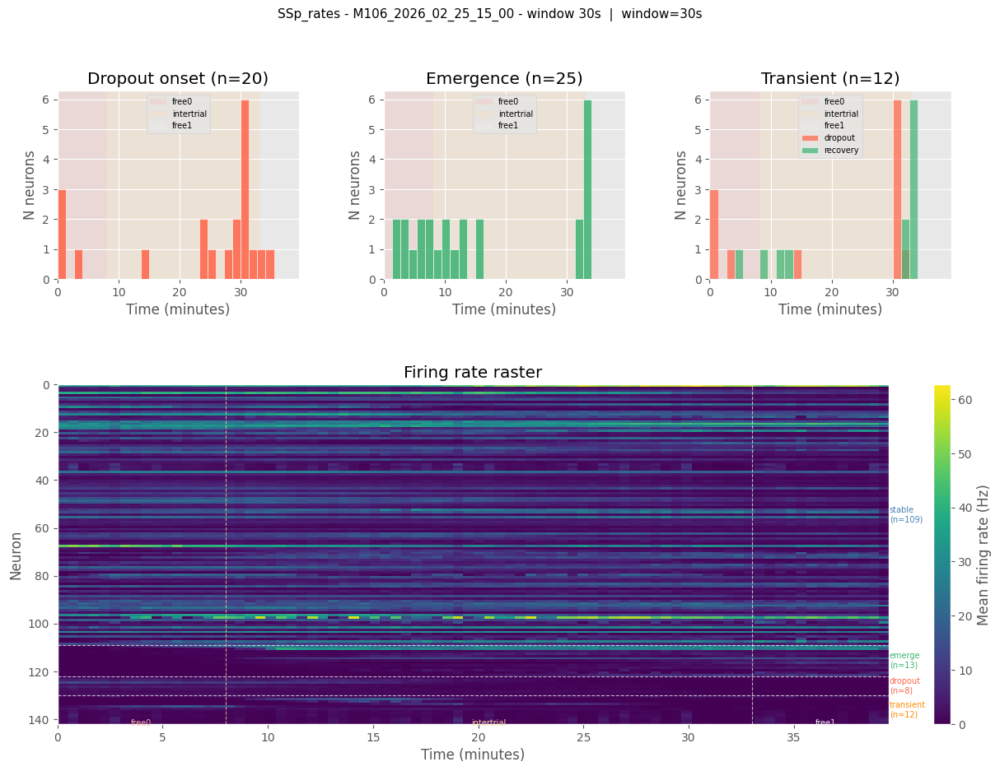

 windows: 80 , bins per window: 3000, features: 132 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
stable       113
emerge        10
transient      5
dropout        4
Stable: 113 / 132


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


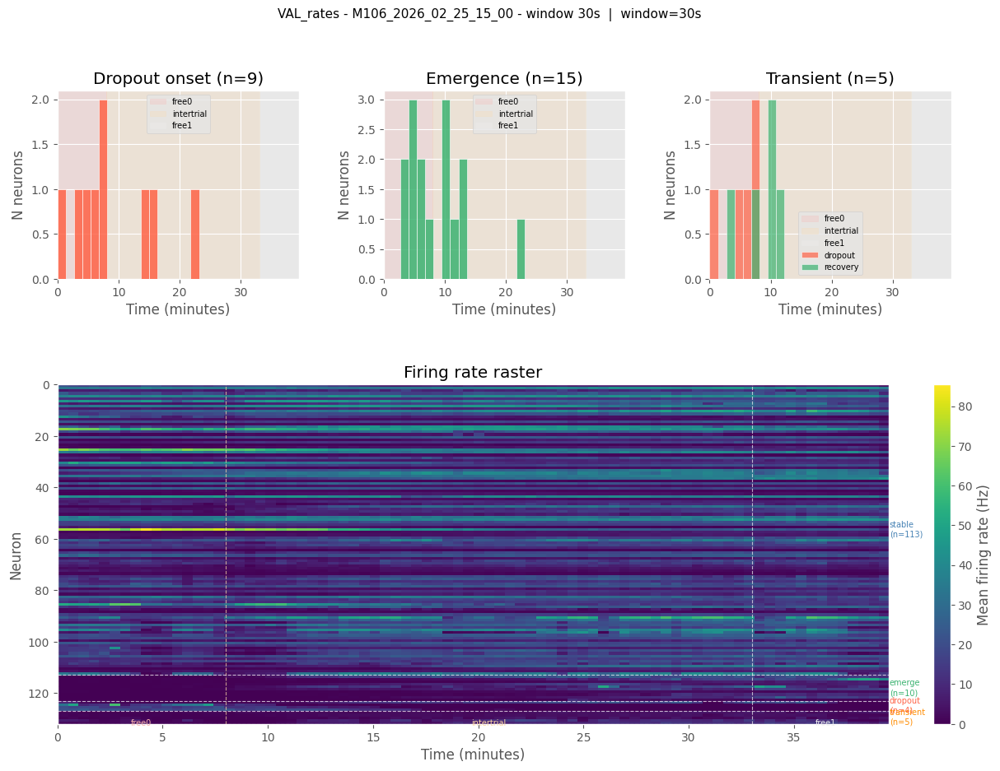

 windows: 80 , bins per window: 3000, features: 206 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
stable       128
emerge        41
transient     19
dropout       18
Stable: 128 / 206


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


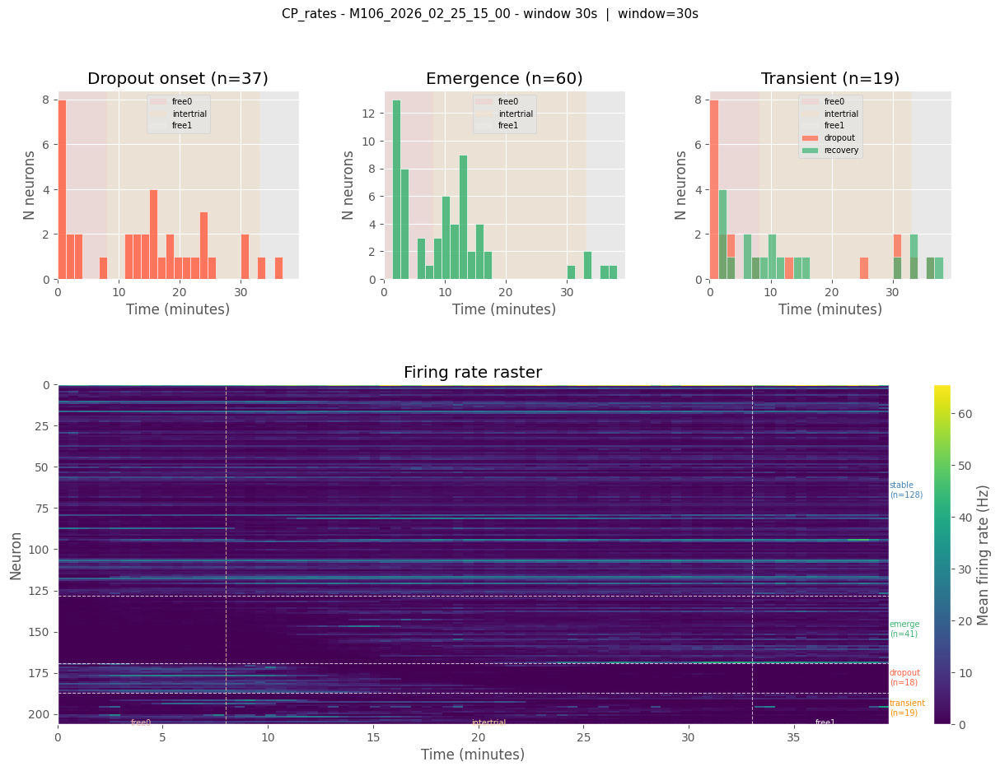

M106_2026_02_26_16_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 113999 in trial: free and id: 535, inserting NaN.
Extending index to 113999 in trial: free and id: 535, inserting NaN.
Combined every 1 bins
Resulting CP_spikes ephys data shape is (NxT): (132, 120000)
Resulting all_spikes ephys data shape is (NxT): (17, 120000)
Resulting MOp_spikes ephys data shape is (NxT): (122, 120000)
Resulting VAL_spikes ephys data shape is (NxT): (187, 120000)
Resulting SSp_spikes ephys data shape is (NxT): (77, 120000)
 windows: 104 , bins per window: 3000, features: 122 
trial_type
free0         40
free1         38
intertrial    26
Name: count, dtype: int64
ty

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


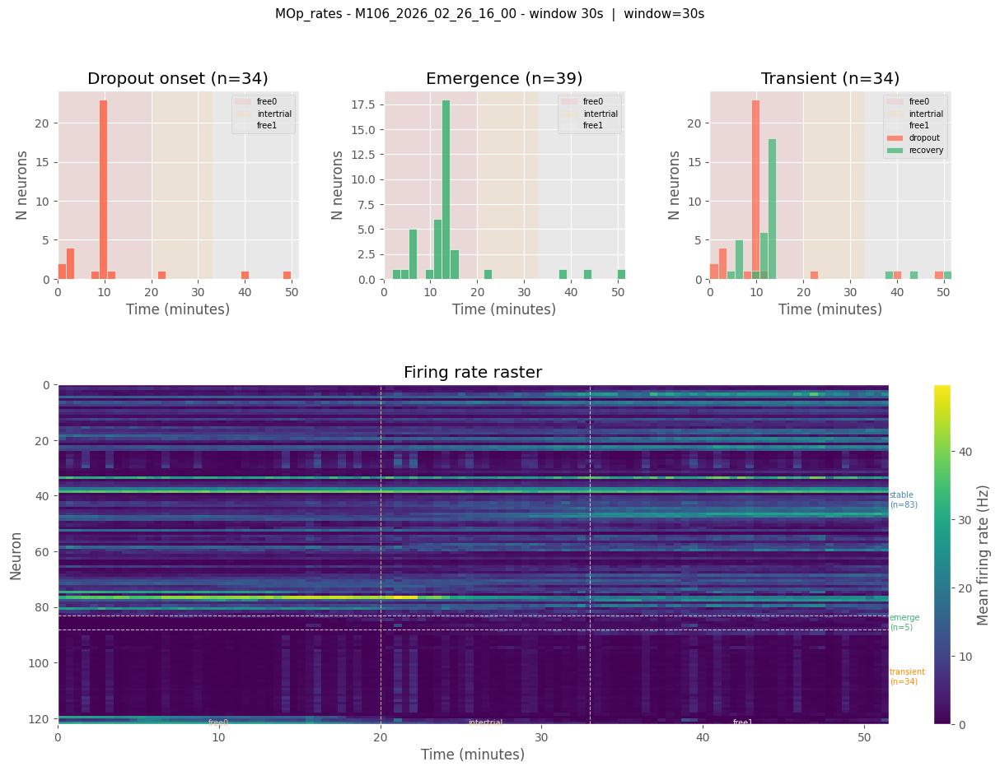

 windows: 104 , bins per window: 3000, features: 77 
trial_type
free0         40
free1         38
intertrial    26
Name: count, dtype: int64
type
stable       51
emerge       16
transient    10
Stable: 51 / 77


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


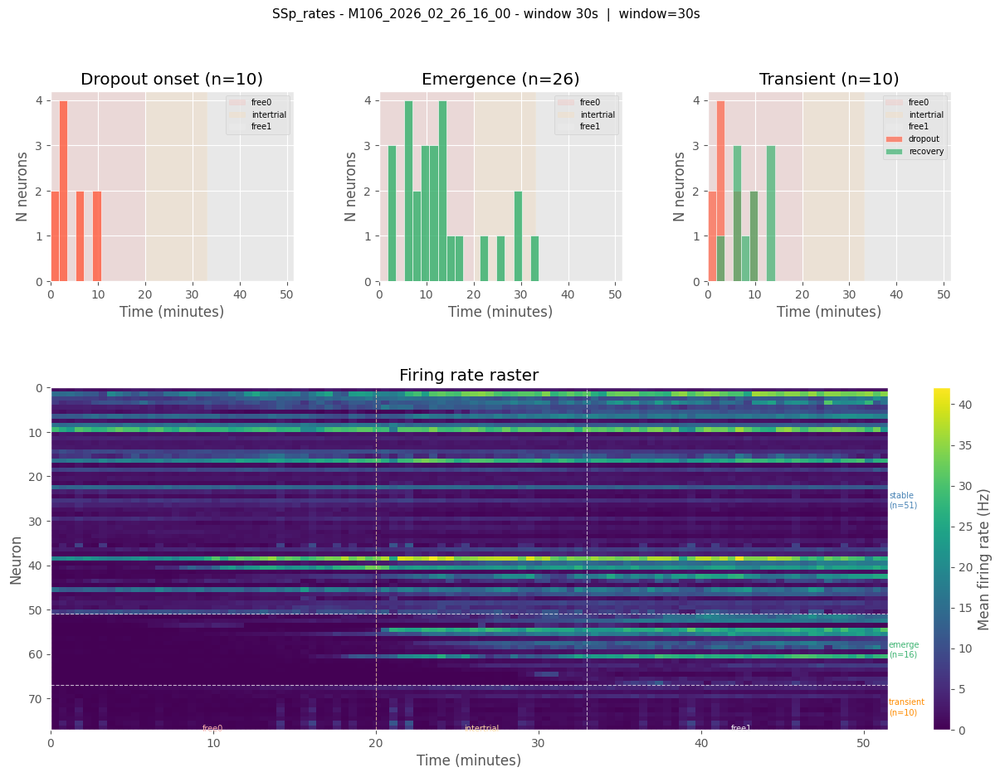

 windows: 104 , bins per window: 3000, features: 187 
trial_type
free0         40
free1         38
intertrial    26
Name: count, dtype: int64
type
stable       164
emerge        13
transient      6
dropout        4
Stable: 164 / 187


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


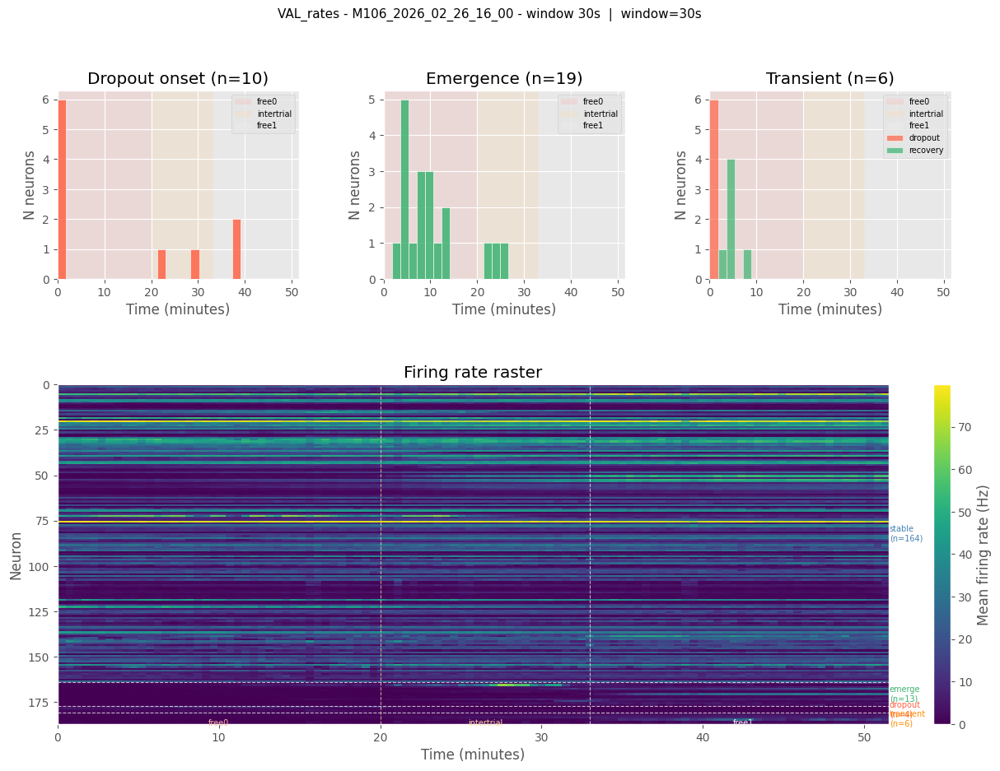

 windows: 104 , bins per window: 3000, features: 132 
trial_type
free0         40
free1         38
intertrial    26
Name: count, dtype: int64
type
stable       99
emerge       23
transient     7
dropout       3
Stable: 99 / 132


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


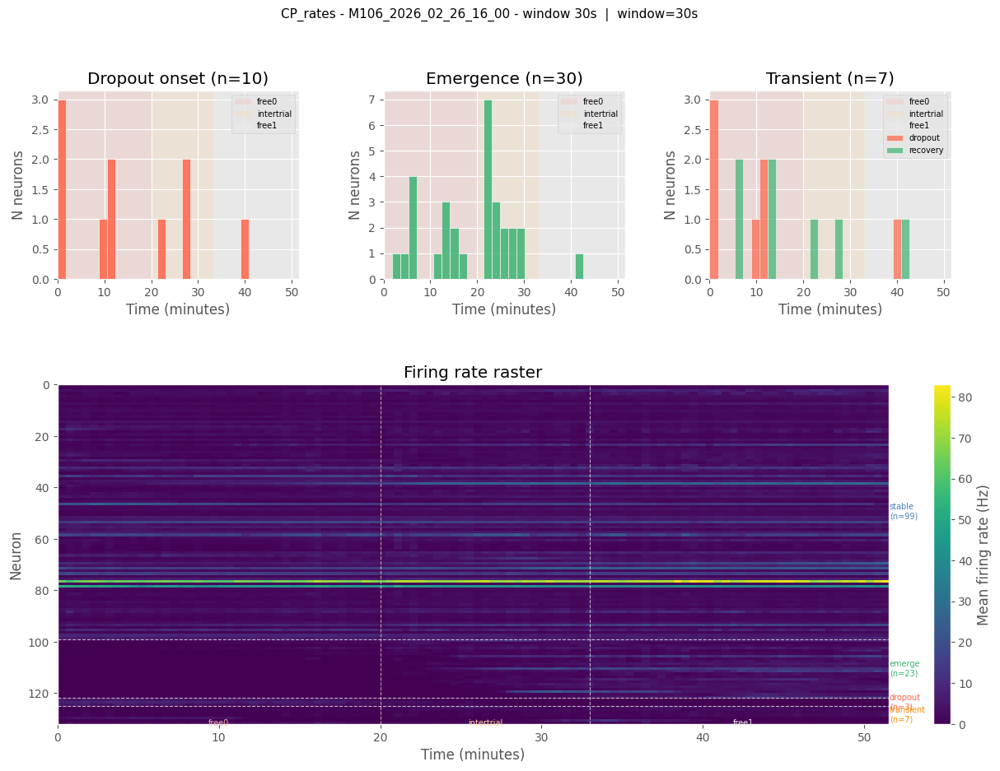

M106_2026_02_27_16_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 41999 in trial: free and id: 993, inserting NaN.
Extending index to 41999 in trial: free and id: 993, inserting NaN.
Combined every 1 bins
Resulting CP_spikes ephys data shape is (NxT): (118, 48000)
Resulting MOp_spikes ephys data shape is (NxT): (49, 48000)
Resulting all_spikes ephys data shape is (NxT): (7, 48000)
Resulting SSp_spikes ephys data shape is (NxT): (37, 48000)
Resulting VAL_spikes ephys data shape is (NxT): (166, 48000)
 windows: 80 , bins per window: 30

/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


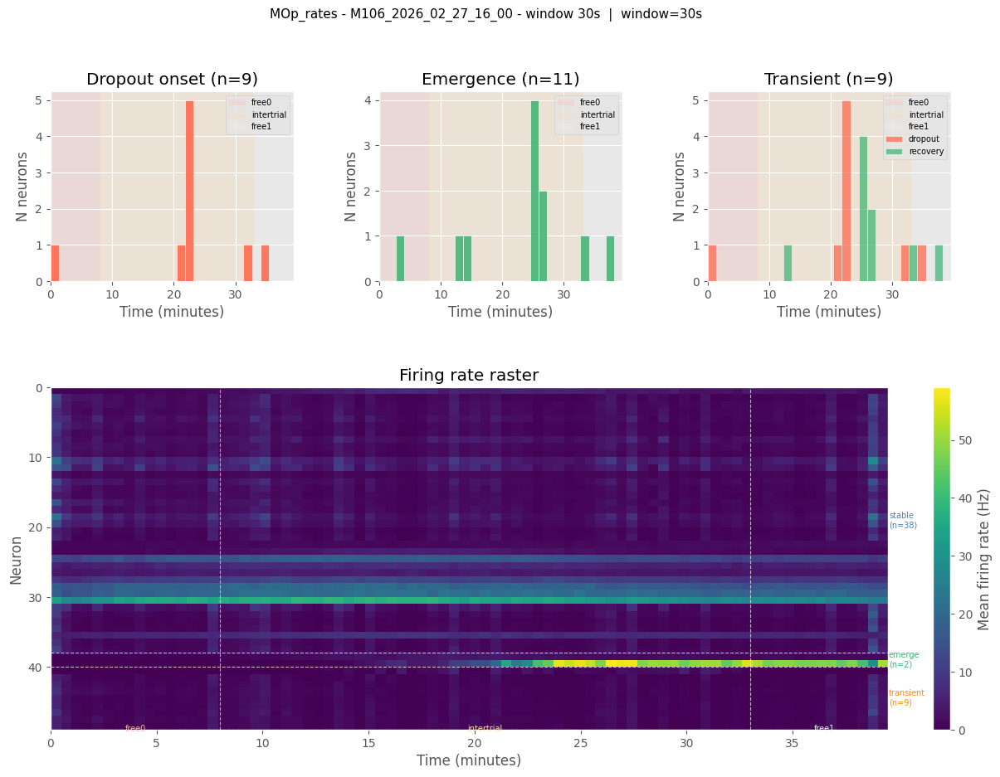

 windows: 80 , bins per window: 3000, features: 37 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
stable       27
transient     6
emerge        4
Stable: 27 / 37


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


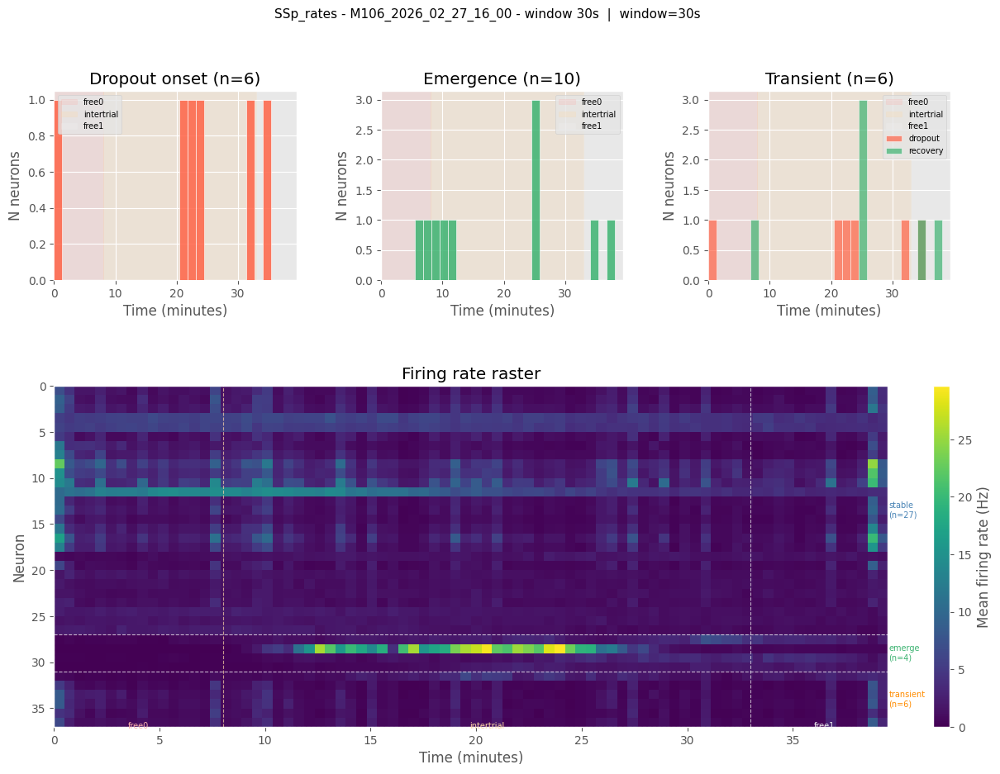

 windows: 80 , bins per window: 3000, features: 166 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
stable       135
emerge        17
transient     11
dropout        3
Stable: 135 / 166


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


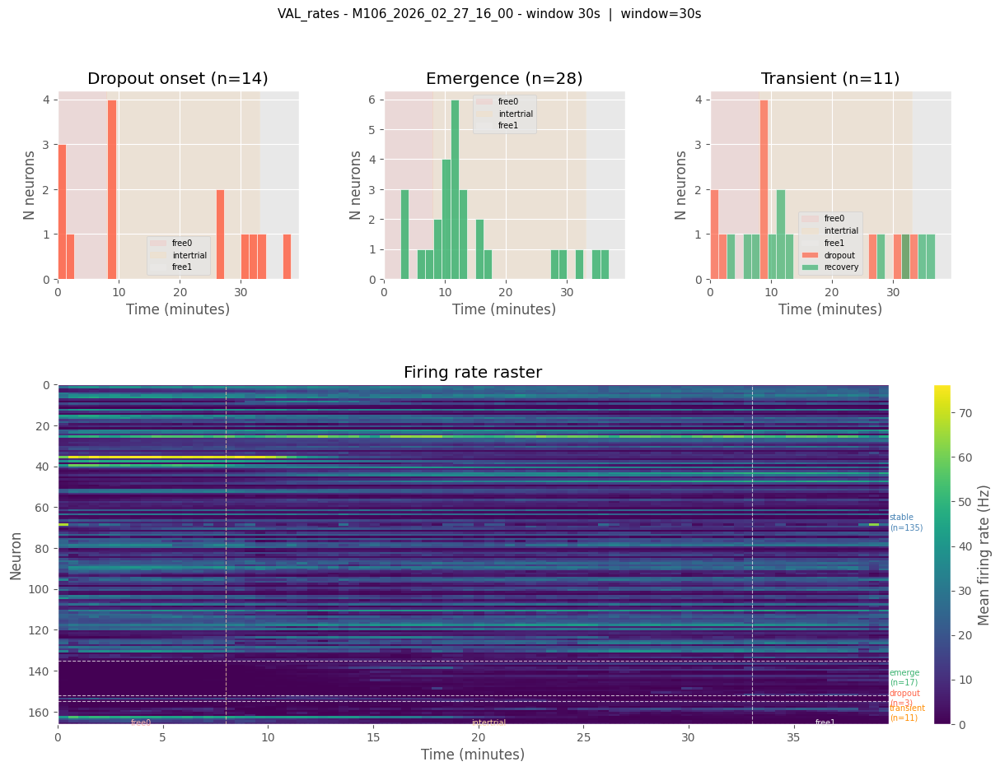

 windows: 80 , bins per window: 3000, features: 118 
trial_type
intertrial    50
free0         16
free1         14
Name: count, dtype: int64
type
stable       88
emerge       17
transient    10
dropout       3
Stable: 88 / 118


/tmp/ipykernel_338138/1560660394.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


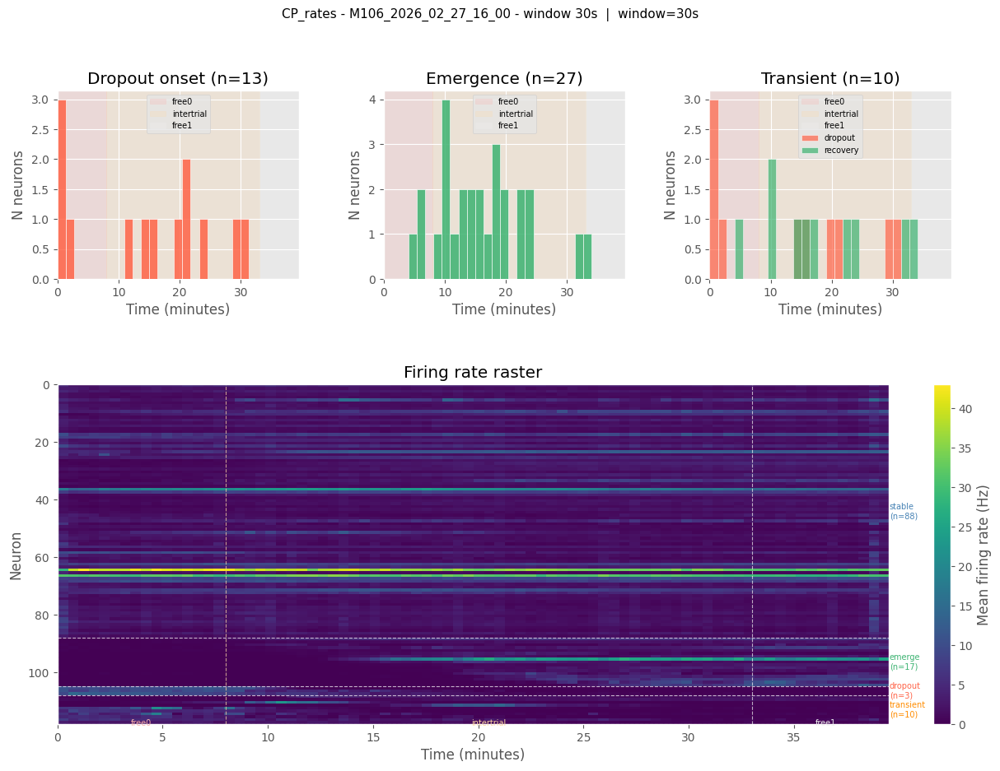

In [36]:

window_size_s = 30
for session_idx in range(len(sessions)):
    prep_df = dt.load_sessions([sessions[session_idx]], prep=True, only_trials=False)[0]
    # prep_df = dt.add_no_mua_field(prep_df)

    prep_df_no_trials = pyal.select_trials(prep_df,"trial_name!='trial'" )

    for field in ["MOp_rates", "SSp_rates","VAL_rates","CP_rates"]:
        # Build windows by concatenating within each trial type (e.g., trial vs intertrial)
        meta_df, X = dt.build_window_tensor_concat_by_trial_type(
            prep_df_no_trials,
            window_size_s=window_size_s,
            field=field,
            trial_type_col="trial_name",   # your type column
            bin_size_col="bin_size",
        )
        print(f" windows: {X.shape[0]} , bins per window: {X.shape[1]}, features: {X.shape[2]} ")
        print(meta_df["trial_type"].value_counts())
        meta_df = meta_df.reset_index(drop=True)

        # Choose device
        device = "cuda" if torch.cuda.is_available() else "cpu"
        X = X.to(device)


        df_silent = detect_silent_neurons(
            X=X,                        # (nW, w, N) already on device or cpu
            threshold=0.5,
            window_size_s=window_size_s,
            min_silent_s=120.0,
        )

        # Stable neuron mask
        stable_mask = df_silent["type"] == "stable"
        print(f"Stable: {stable_mask.sum()} / {len(stable_mask)}")

        # Apply to X
        # X_stable = X[:, :, stable_mask.values]
        # plot_transition_times(
        #     df_silent=df_silent,
        #     window_size_s=window_size_s,
        #     meta_df=meta_df,
        #     title =f"{sessions[session_idx]} - {field} - window {window_size_s}s"
        # )
        plot_transition_times(
            df_silent=df_silent,
            X=X,
            window_size_s=window_size_s,
            meta_df=meta_df,
            title = f"{field} - {sessions[session_idx]} - window {window_size_s}s"
        )


In [ ]:
window_size_s = 20
field = "MOp_rates"
prep_df_no_trials = pyal.select_trials(prep_df,"trial_name!='trial'" )


# Build windows by concatenating within each trial type (e.g., trial vs intertrial)
meta_df, X = dt.build_window_tensor_concat_by_trial_type(
    prep_df_no_trials,
    window_size_s=window_size_s,
    field=field,
    trial_type_col="trial_name",   # your type column
    bin_size_col="bin_size",
)
print(f" windows: {X.shape[0]} , bins per window: {X.shape[1]}, features: {X.shape[2]} ")
print(meta_df["trial_type"].value_counts())
meta_df = meta_df.reset_index(drop=True)

# Choose device
device = "cuda" if torch.cuda.is_available() else "cpu"
X = X.to(device)
X_mean = X.mean(dim=1)  # (n_windows, F)
X_mean.shape


fig, ax = plt.subplots(figsize=(12, 6))
cmap = 'viridis'
im = ax.imshow(X_mean.detach().cpu().numpy().T, aspect="auto", origin="lower", cmap=cmap)
boundaries = dt.trial_change_boundaries(meta_df,col = 'trial_type')
for b in boundaries:
    ax.axvline(b, color="w", ls="--", lw=1.5)
ax.legend(loc="upper right", frameon=True)
ax.set_xlabel("Window index")
ax.set_ylabel("Neuron index")
ax.grid(False)
ax.set_title(f"{field}, {window_size_s}s windows, {sessions[session_idx]} all neurons")
cbar = plt.colorbar(im, ax=ax, pad=0.01)
cbar.set_label("Mean firing rate")
plt.tight_layout()

M106_2026_02_26_16_00
fields: ['values_before_camera_trigger', 'idx_before_camera_trigger', 'values_Sol_direction', 'values_Sol_duration'] could not be converted to int.
fields: ['values_before_camera_trigger', 'values_Sol_direction', 'idx_Sol_direction', 'values_Sol_duration', 'idx_Sol_duration', 'idx_sol_on'] could not be converted to int.
Repairing columns ['MotSen1_X', 'MotSen1_Y']
Extending index to 113999 in trial: free and id: 535, inserting NaN.
Extending index to 113999 in trial: free and id: 535, inserting NaN.
Combined every 1 bins
Resulting CP_spikes ephys data shape is (NxT): (132, 120000)
Resulting all_spikes ephys data shape is (NxT): (17, 120000)
Resulting MOp_spikes ephys data shape is (NxT): (122, 120000)
Resulting VAL_spikes ephys data shape is (NxT): (187, 120000)
Resulting SSp_spikes ephys data shape is (NxT): (77, 120000)
 windows: 3139 , bins per window: 100, features: 122 
trial_type
free0         1200
free1         1140
intertrial     799
Name: count, dtype: in

/tmp/ipykernel_338138/3695740101.py:36: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper right", frameon=True)


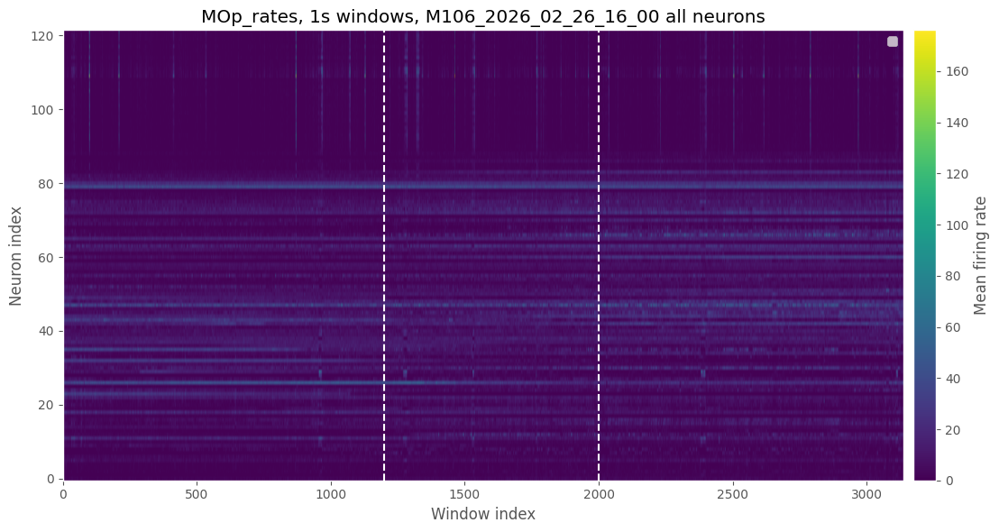

In [5]:
# mean per feature per window
session_idx = 9
prep_df = dt.load_sessions([sessions[session_idx]], prep=True, only_trials=False)[0]
prep_df = dt.add_no_mua_field(prep_df)

window_size_s = 1
field = "MOp_rates"
prep_df_no_trials = pyal.select_trials(prep_df,"trial_name!='trial'" )


# Build windows by concatenating within each trial type (e.g., trial vs intertrial)
meta_df, X = dt.build_window_tensor_concat_by_trial_type(
    prep_df_no_trials,
    window_size_s=window_size_s,
    field=field,
    trial_type_col="trial_name",   # your type column
    bin_size_col="bin_size",
)
print(f" windows: {X.shape[0]} , bins per window: {X.shape[1]}, features: {X.shape[2]} ")
print(meta_df["trial_type"].value_counts())
meta_df = meta_df.reset_index(drop=True)

# Choose device
device = "cuda" if torch.cuda.is_available() else "cpu"
X = X.to(device)
X_mean = X.mean(dim=1)  # (n_windows, F)
X_mean.shape


fig, ax = plt.subplots(figsize=(12, 6))
cmap = 'viridis'
im = ax.imshow(X_mean.detach().cpu().numpy().T, aspect="auto", origin="lower", cmap=cmap)
boundaries = dt.trial_change_boundaries(meta_df,col = 'trial_type')
for b in boundaries:
    ax.axvline(b, color="w", ls="--", lw=1.5)
ax.legend(loc="upper right", frameon=True)
ax.set_xlabel("Window index")
ax.set_ylabel("Neuron index")
ax.grid(False)
ax.set_title(f"{field}, {window_size_s}s windows, {sessions[session_idx]} all neurons")
cbar = plt.colorbar(im, ax=ax, pad=0.01)
cbar.set_label("Mean firing rate")
plt.tight_layout()

 windows: 3139 , bins per window: 100, features: 33 
trial_type
free0         1200
free1         1140
intertrial     799
Name: count, dtype: int64


/tmp/ipykernel_338138/2998237368.py:36: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper right", frameon=True)


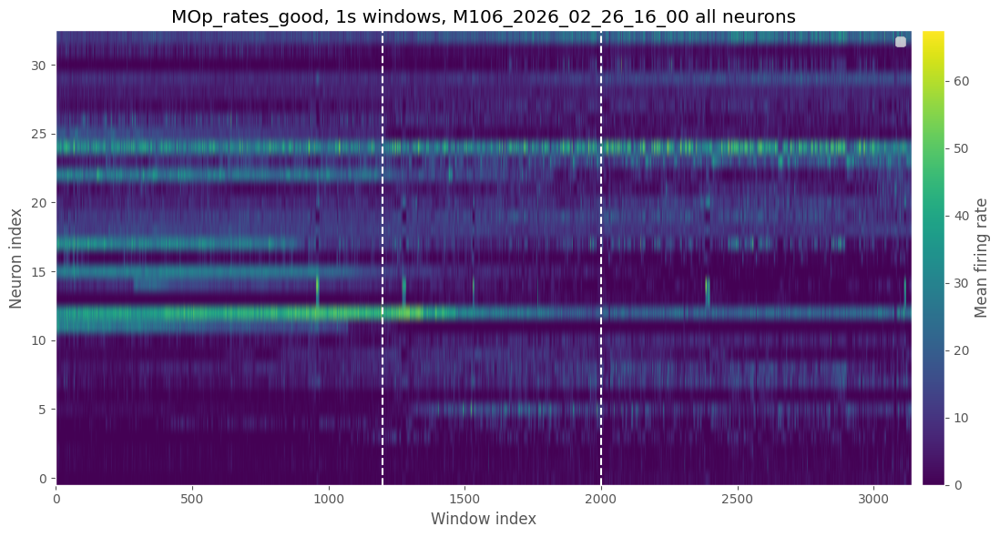

In [26]:
# mean per feature per window
# session_idx = 9
# prep_df = dt.load_sessions([sessions[session_idx]], prep=True, only_trials=False)[0]
# prep_df = dt.add_no_mua_field(prep_df)

window_size_s = 1
field = "MOp_rates_good"
prep_df_no_trials = pyal.select_trials(prep_df,"trial_name!='trial'" )


# Build windows by concatenating within each trial type (e.g., trial vs intertrial)
meta_df, X = dt.build_window_tensor_concat_by_trial_type(
    prep_df_no_trials,
    window_size_s=window_size_s,
    field=field,
    trial_type_col="trial_name",   # your type column
    bin_size_col="bin_size",
)
print(f" windows: {X.shape[0]} , bins per window: {X.shape[1]}, features: {X.shape[2]} ")
print(meta_df["trial_type"].value_counts())
meta_df = meta_df.reset_index(drop=True)

# Choose device
device = "cuda" if torch.cuda.is_available() else "cpu"
X = X.to(device)
X_mean = X.mean(dim=1)  # (n_windows, F)
X_mean.shape


fig, ax = plt.subplots(figsize=(12, 6))
cmap = 'viridis'
im = ax.imshow(X_mean.detach().cpu().numpy().T, aspect="auto", origin="lower", cmap=cmap)
boundaries = dt.trial_change_boundaries(meta_df,col = 'trial_type')
for b in boundaries:
    ax.axvline(b, color="w", ls="--", lw=1.5)
ax.legend(loc="upper right", frameon=True)
ax.set_xlabel("Window index")
ax.set_ylabel("Neuron index")
ax.grid(False)
ax.set_title(f"{field}, {window_size_s}s windows, {sessions[session_idx]} all neurons")
cbar = plt.colorbar(im, ax=ax, pad=0.01)
cbar.set_label("Mean firing rate")
plt.tight_layout()

In [19]:
alldata = np.concatenate(pyal.select_trials(prep_df,"trial_name!='trial'")[field].values,axis = 0)

In [20]:
alldata.shape

(313900, 122)

In [29]:
free0_len = dt.get_n_time(prep_df, "free0", field=field)
free1_len = dt.get_n_time(prep_df, "free1", field=field)
session_len = alldata.shape[0]

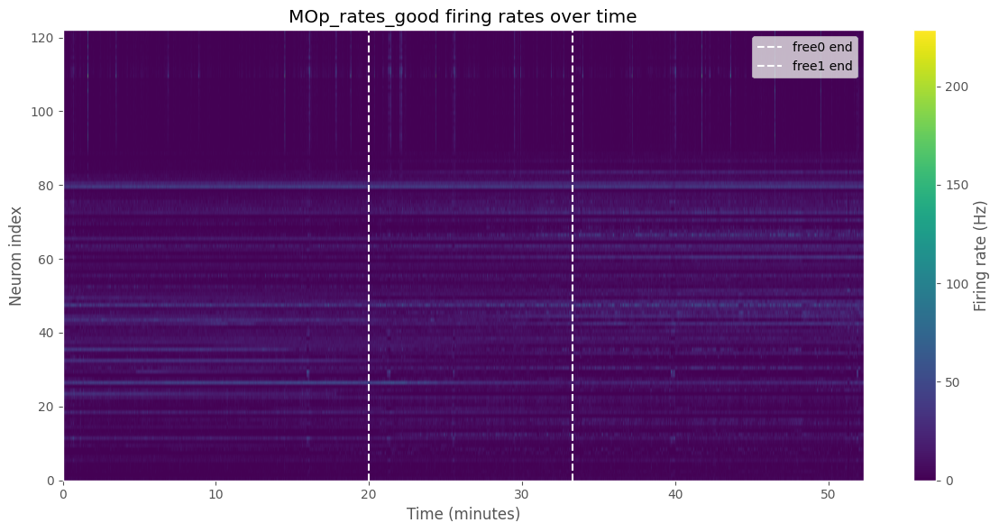

In [30]:
# plot firing rates
time = np.arange(alldata.shape[0]) * prep_df["bin_size"].iloc[0] / 60.0
plt.figure(figsize=(12, 6))
plt.imshow(alldata.T, aspect="auto", origin="lower", cmap="viridis",
           extent=[time[0], time[-1], 0, alldata.shape[1]])
plt.axvline(free0_len * prep_df["bin_size"].iloc[0] / 60.0, color="w", ls="--", lw=1.5, label="free0 end")
plt.axvline((session_len-free1_len) * prep_df["bin_size"].iloc[0] / 60.0, color="w", ls="--", lw=1.5, label="free1 end")
plt.colorbar(label="Firing rate (Hz)")
plt.xlabel("Time (minutes)")
plt.ylabel("Neuron index")
plt.title(f"{field} firing rates over time")
plt.grid(False)
plt.legend(loc="upper right")
plt.tight_layout()
plt.show()